In [67]:
%matplotlib inline

In [68]:
import networkx as nx
import preprocessing as prep
import numpy as np
import pandas as pd
import numpy as np
import seaborn as sns
import json
import os
import datetime
import pytz
import matplotlib.pyplot as plt
from collections import Counter
from bb_binary import load_frame_container, Repository
from pandas import Series, DataFrame
import sqlite3
import igraph as ig

In [69]:
db_path = "/storage/mi/aschle/data.db"
conn = sqlite3.connect(db_path)
c = conn.cursor()

In [95]:
def plotXY(txt, df, camIDleft, camIDright, s=5000):
    data_l = df[df.CAM_ID == camIDleft].sample(s)
    data_r = df[df.CAM_ID == camIDright].sample(s)
#     data_l = df[df.CAM_ID == camIDleft]
#     data_r = df[df.CAM_ID == camIDright]
    data_r.XPOS = data_r.XPOS + 3000
    data = pd.concat([data_l,data_r])
    data.plot.scatter(x='XPOS', y="YPOS",s=1, xlim=(0,6000),ylim=(0,4000), alpha=0.2)
    plt.axes().set_aspect('equal')
    plt.axes().set_title("{} \nCam {} & Cam {}".format(txt, str(camIDleft), str(camIDright)))

In [66]:
def getDFwithIDS(ids, conn):
    ids_str = ', '.join([str(x) for x in ids])
    sql = '''
        SELECT d.XPOS, d.YPOS, d.ID, fc.CAM_ID
        FROM DETECTIONS d
        INNER JOIN FRAME f
        ON d.FRAME_ID=f.FRAME_ID
        INNER JOIN FRAME_CONTAINER fc
        ON f.FC_ID=fc.FC_ID
        WHERE d.ID IN ({});
    '''.format(ids_str)
    return pd.read_sql(sql, conn)

# Plot Communities per HOURLY Networks

## Example one Hour

In [34]:
def removeEdges(G, limit):
    for e in G.edges():
        if (G.get_edge_data(e[0],e[1]).get("weight") < limit):
            G.remove_edge(e[0],e[1])
            
    
    Gcc = sorted(nx.connected_component_subgraphs(G), key = len, reverse=True)
    print("Number of components: {}".format(len(Gcc)))

    size_components = []
    for comp in Gcc:
        size_components.append(nx.number_of_nodes(comp))

    print(Counter(list(size_components)))
    
    return Gcc[0]

In [365]:
G = nx.read_graphml("networks-hours/2015-08-21T00:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml")

In [366]:
print(nx.info(G))

Name: 
Type: Graph
Number of nodes: 772
Number of edges: 5691
Average degree:  14.7435


In [367]:
G = removeEdges(G, 2)

Number of components: 158
Counter({1: 150, 2: 6, 3: 1, 607: 1})


In [368]:
print(nx.info(G))

Name: 
Type: Graph
Number of nodes: 607
Number of edges: 1597
Average degree:   5.2619


In [369]:
c = list(nx.community.k_clique_communities(G,3))

In [370]:
len(c)

59

In [371]:
size = [len(i) for i in c]

In [372]:
size.sort(reverse=True)

print(size)

[79, 53, 22, 17, 8, 8, 8, 6, 6, 6, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3]


In [72]:
ids_c  = [i for i in c if len(i) > 10]

In [99]:
len(ids_c)

4

In [94]:
df0 = getDFwithIDS(ids_c[0], conn)

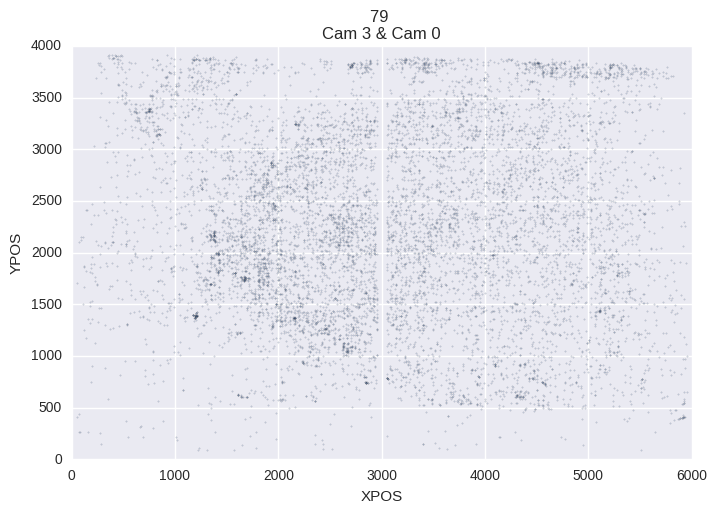

In [96]:
plotXY(str(len(ids_c[0])), df0, 3, 0)

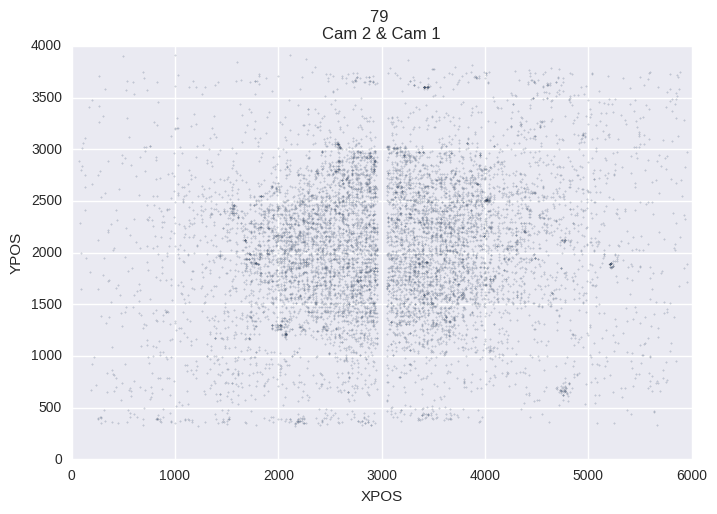

In [97]:
plotXY(str(len(ids_c[0])), df0, 2, 1)

In [100]:
df1 = getDFwithIDS(ids_c[1], conn)

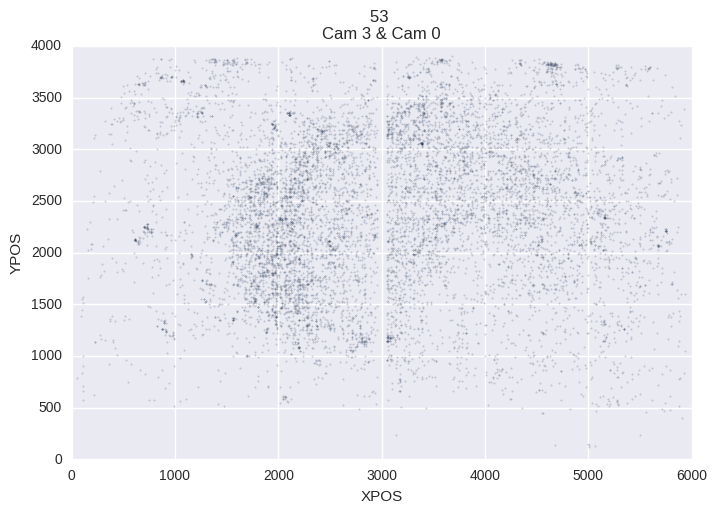

In [103]:
plotXY(str(len(ids_c[1])), df1, 3, 0)

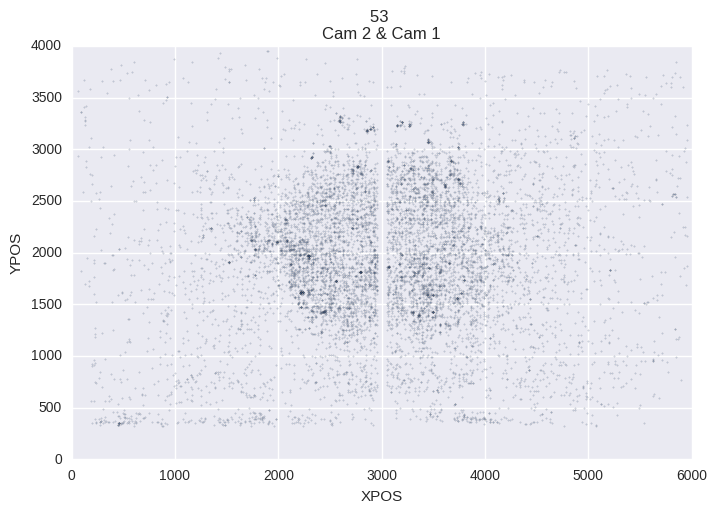

In [104]:
plotXY(str(len(ids_c[1])), df1, 2, 1)

In [105]:
df2 = getDFwithIDS(ids_c[2], conn)

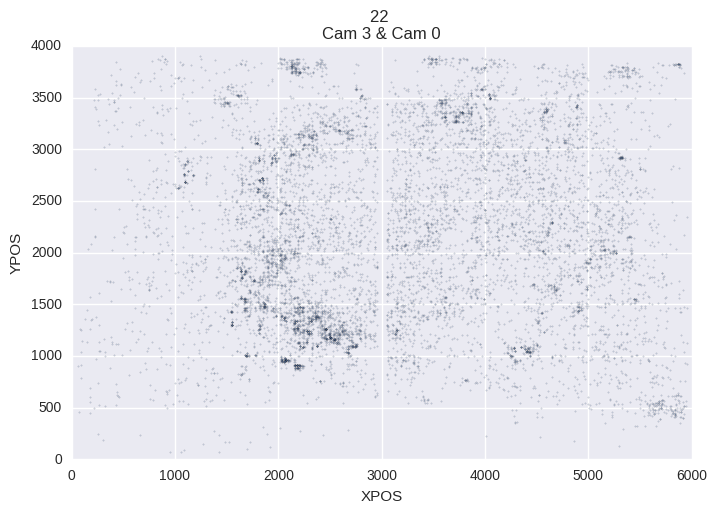

In [106]:
plotXY(str(len(ids_c[2])), df2, 3, 0)

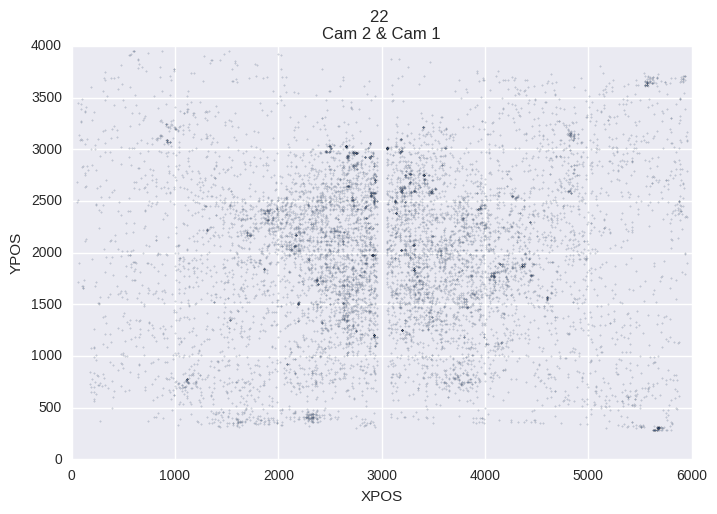

In [107]:
plotXY(str(len(ids_c[2])), df2, 2, 1)

In [108]:
df3 = getDFwithIDS(ids_c[3], conn)

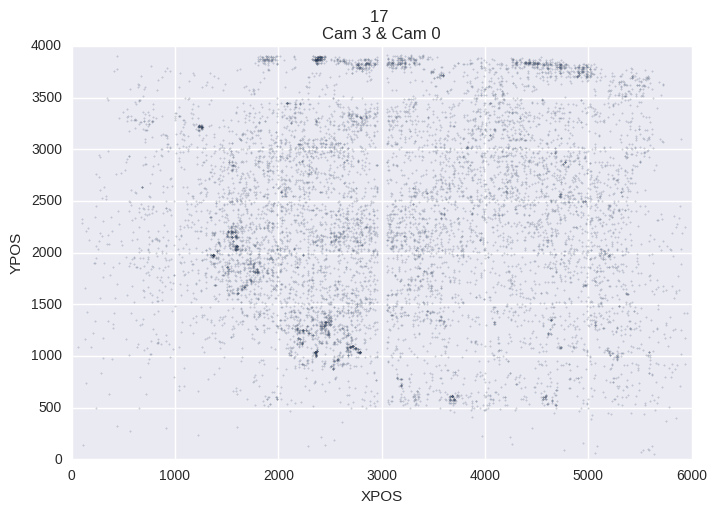

In [109]:
plotXY(str(len(ids_c[3])), df3, 3, 0)

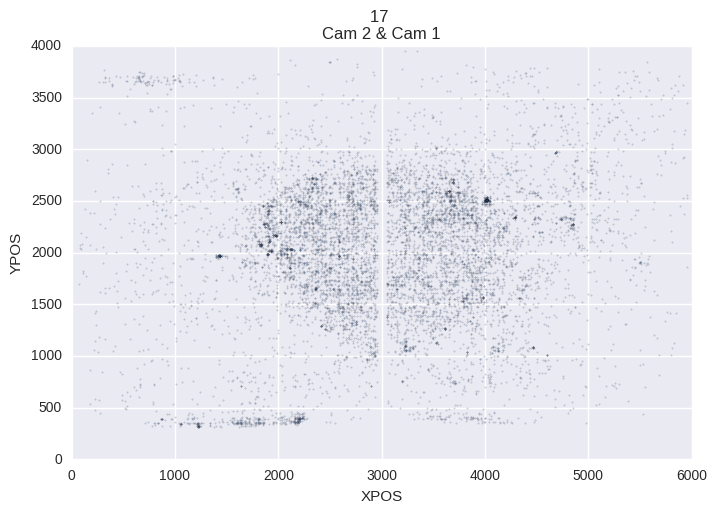

In [110]:
plotXY(str(len(ids_c[3])), df3, 2, 1)

## Example for one hour (igraph - no overlapping communities)

In [113]:
import igraph as ig

In [363]:
g = ig.Graph.Read_GraphML("networks-hours/2015-08-21T00:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml")

In [115]:
g.summary()

'IGRAPH U-W- 772 5691 -- \n+ attr: id (v), weight (e)'

In [122]:
c = g.community_infomap()

limit = 20

# keep communities with lots of members
cl = [(e,s) for e,s in enumerate(c.sizes()) if s > limit]

print(cl)

a,b = zip(*cl)

a = list(a)
b = list(b)

print(sum(b))

membership = c.membership
ids = [[],[],[],[],[],[]] #[[]]*len(cl)

print(ids)

for name, membership in zip(g.vs, membership):
    if membership in a:
        counter += 1
        ids[membership].append(int(name['id']))

[len(item) for item in ids]

In [299]:
def plotCommunity(ids, index, conn):
    infomap = getDFwithIDS(ids[index], conn)
    plotXY(str(len(ids[index])), infomap, 3, 0)
    plt.show()
    plotXY(str(len(ids[index])), infomap, 2, 1)
    plt.show()

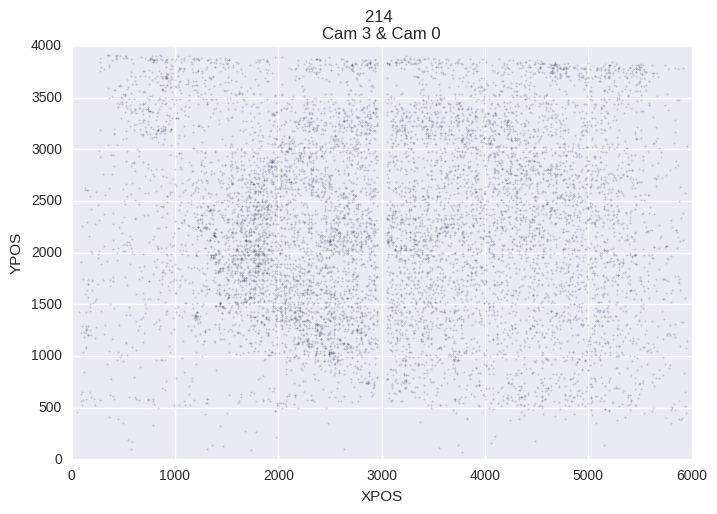

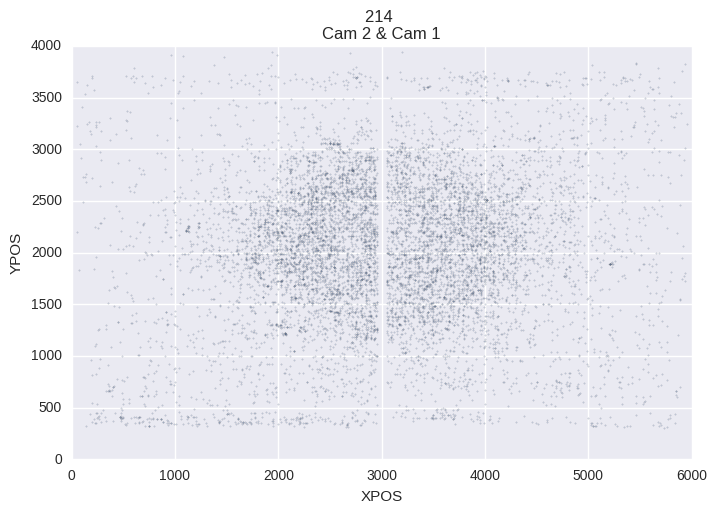

In [300]:
plotCommunity(ids,0,conn)

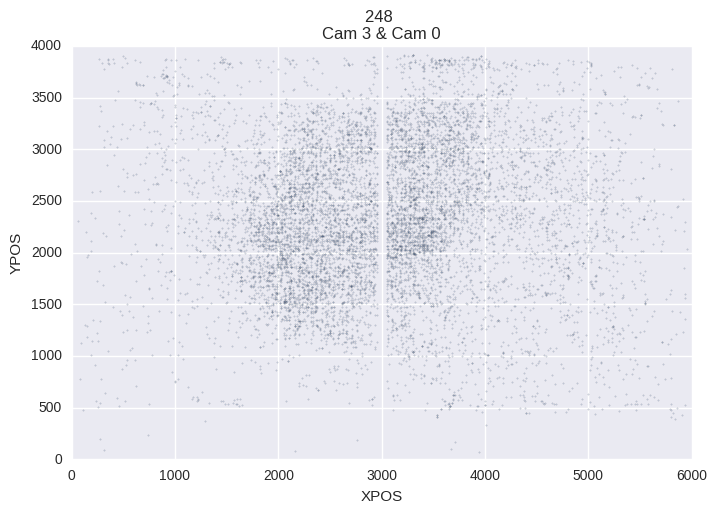

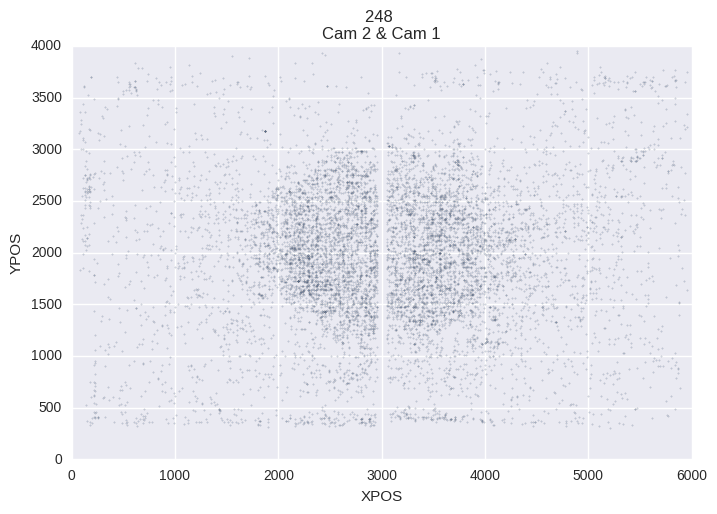

In [301]:
plotCommunity(ids,1,conn)

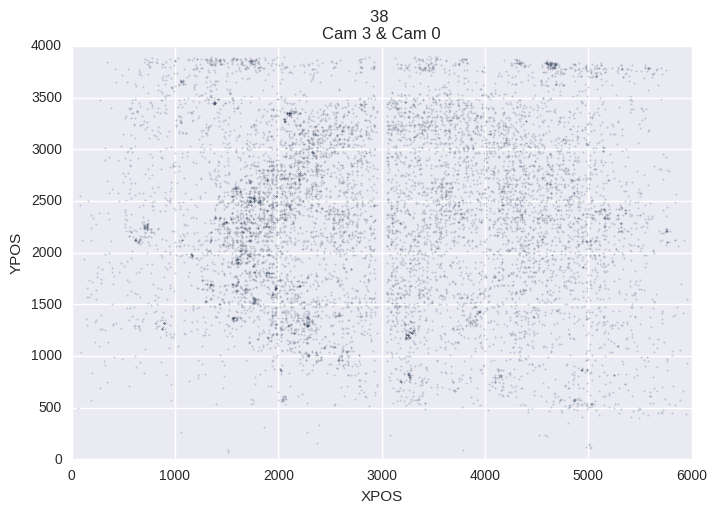

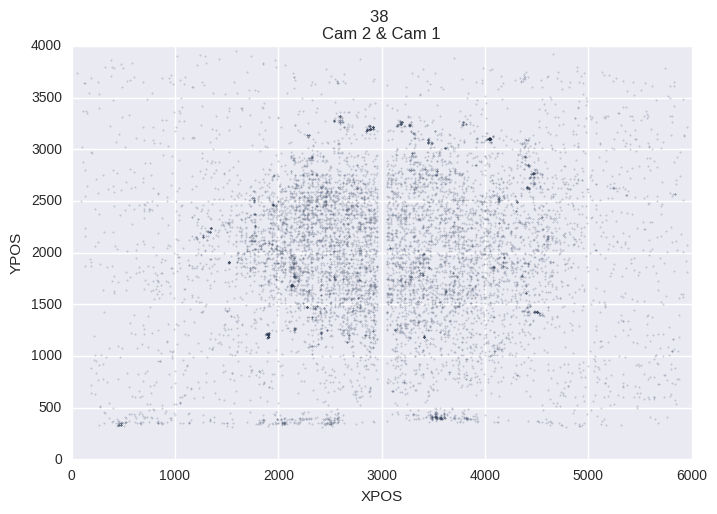

In [302]:
plotCommunity(ids,2,conn)

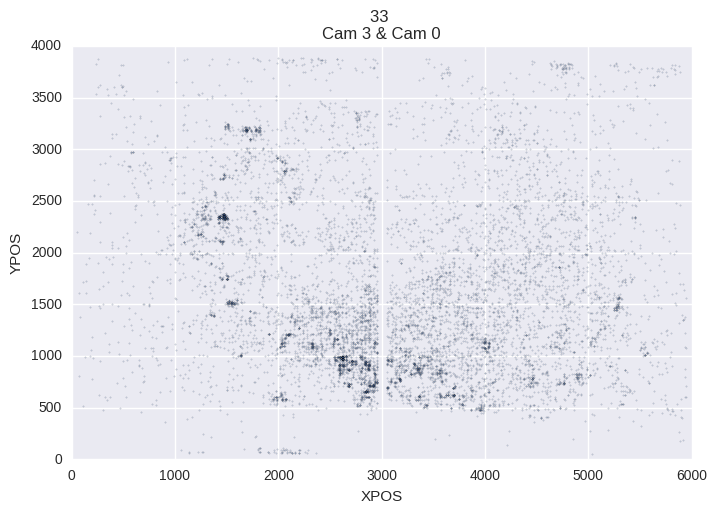

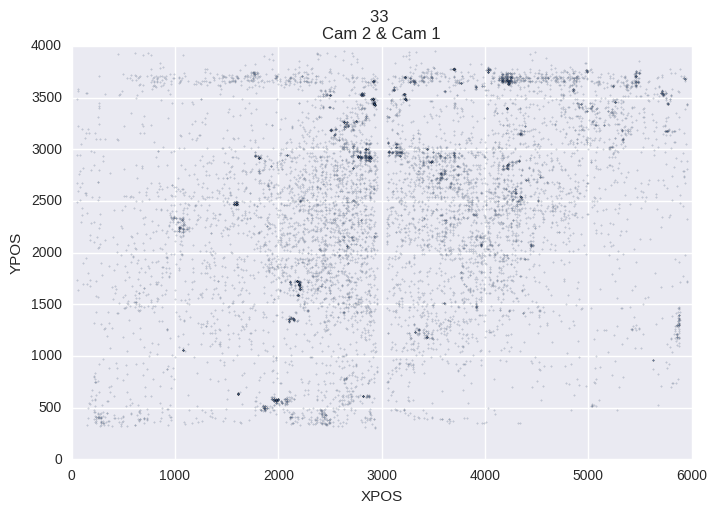

In [303]:
plotCommunity(ids,3,conn)

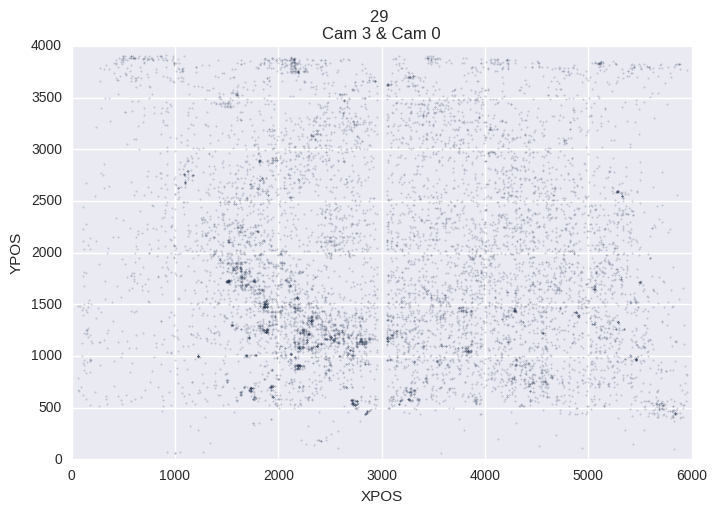

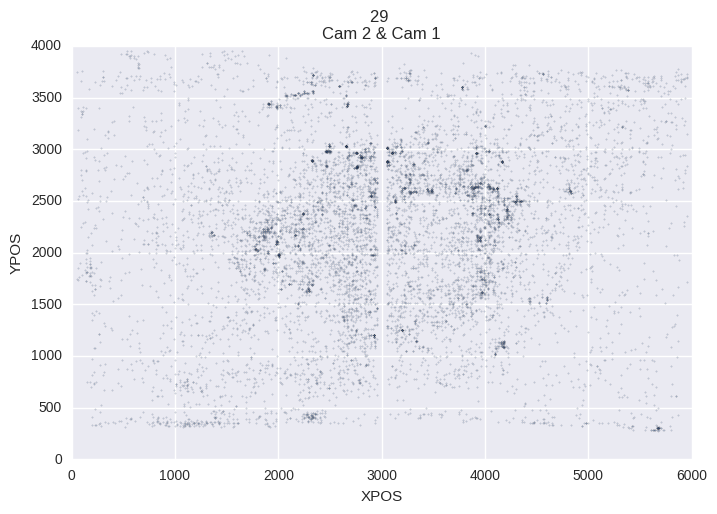

In [304]:
plotCommunity(ids,4,conn)

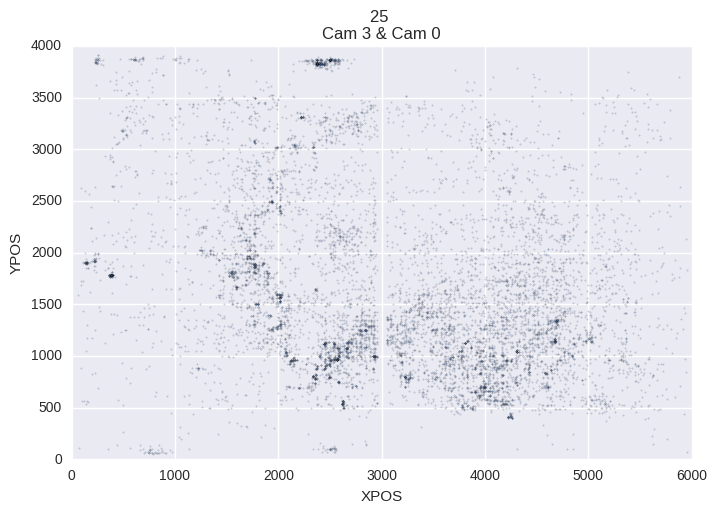

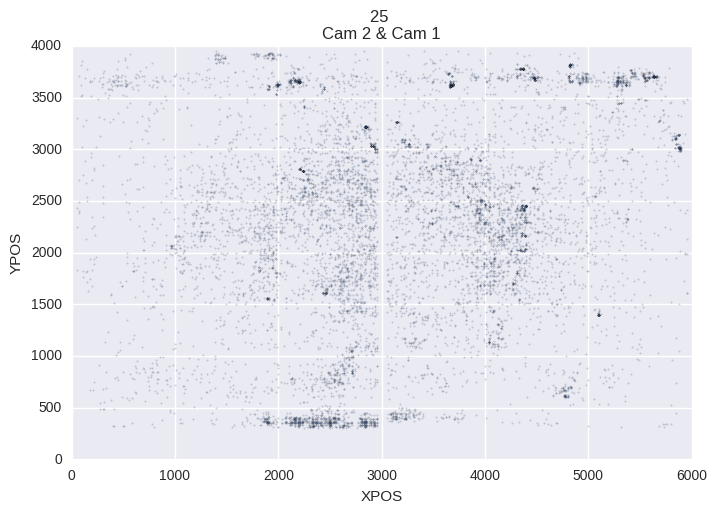

In [305]:
plotCommunity(ids,5,conn)

In [312]:
def plotCommunityFrac(ids, index, conn, frac):
    infomap = getDFwithIDS(ids[index], conn)
    plotXYFrac(str(len(ids[index])), infomap, 3, 0, frac)
    plt.show()
    plotXYFrac(str(len(ids[index])), infomap, 2, 1, frac)
    plt.show()
    return infomap

In [313]:
def plotXYFrac(txt, df, camIDleft, camIDright, f=0.5):
    data_l = df[df.CAM_ID == camIDleft].sample(frac=f)
    data_r = df[df.CAM_ID == camIDright].sample(frac=f)
#     data_l = df[df.CAM_ID == camIDleft]
#     data_r = df[df.CAM_ID == camIDright]
    data_r.XPOS = data_r.XPOS + 3000
    data = pd.concat([data_l,data_r])
    data.plot.scatter(x='XPOS', y="YPOS",s=1, xlim=(0,6000),ylim=(0,4000), alpha=0.2)
    plt.axes().set_aspect('equal')
    plt.axes().set_title("{} \nCam {} & Cam {}".format(txt, str(camIDleft), str(camIDright)))

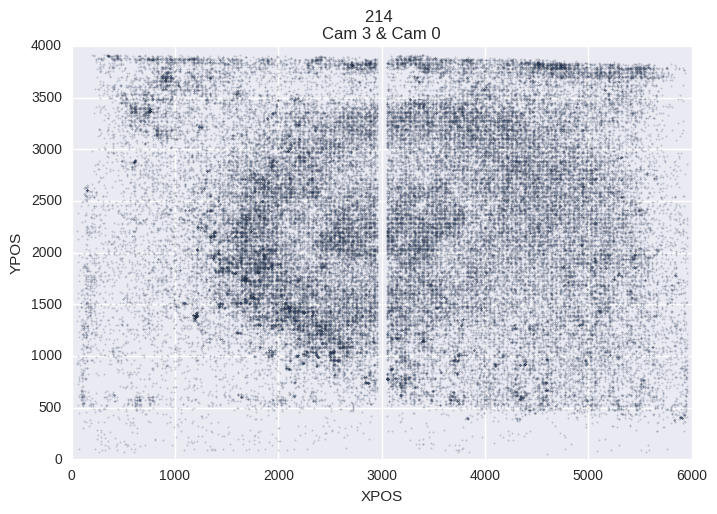

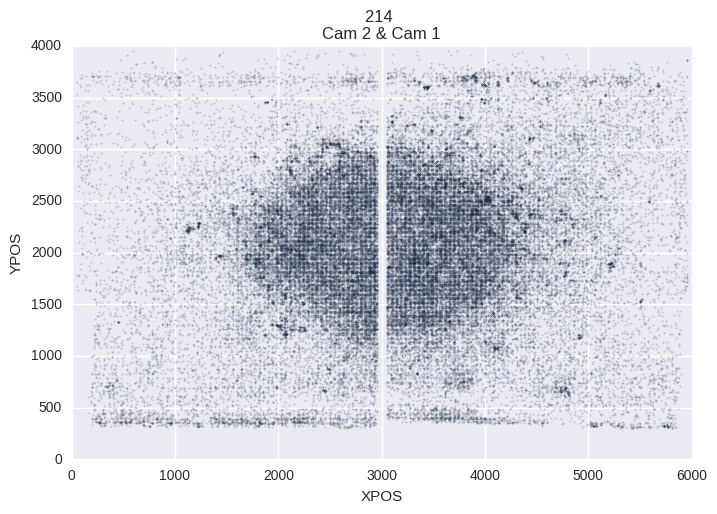

In [314]:
plt0 = plotCommunityFrac(ids,0,conn, 0.01)

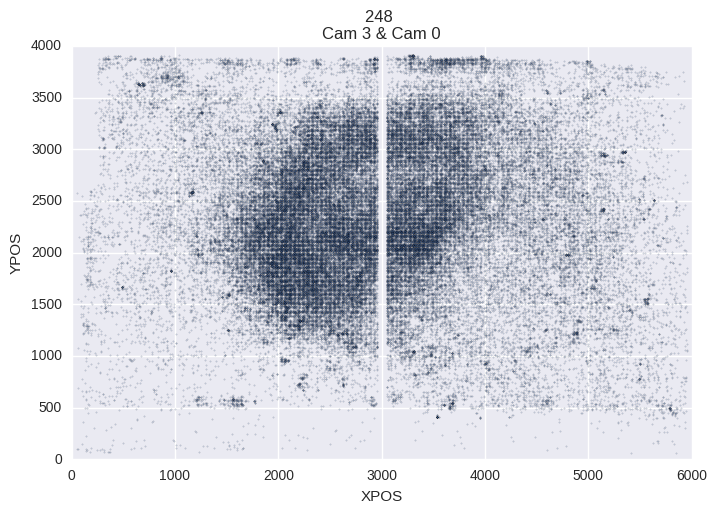

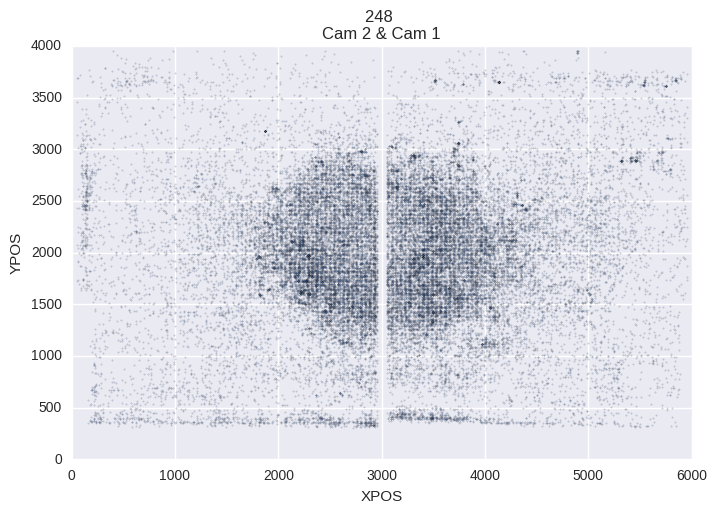

In [315]:
plt1 = plotCommunityFrac(ids,1,conn, 0.01)

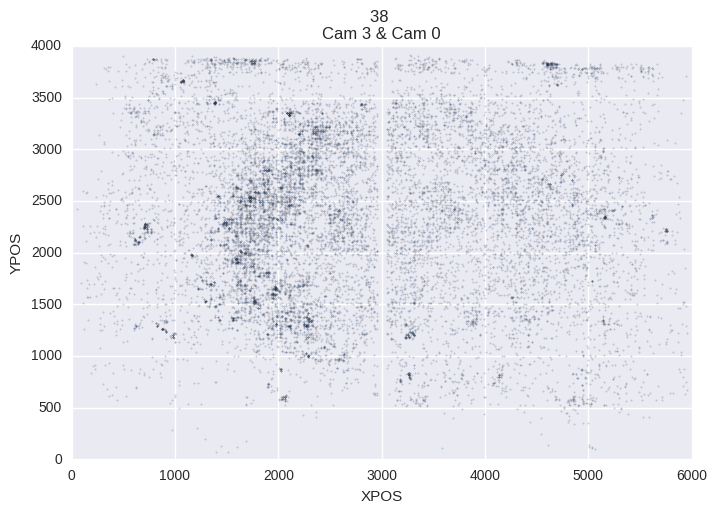

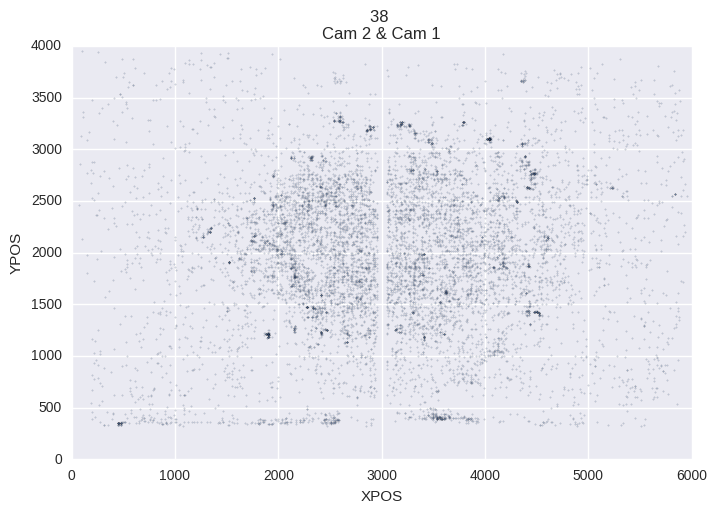

In [316]:
plt2 = plotCommunityFrac(ids,2,conn, 0.01)

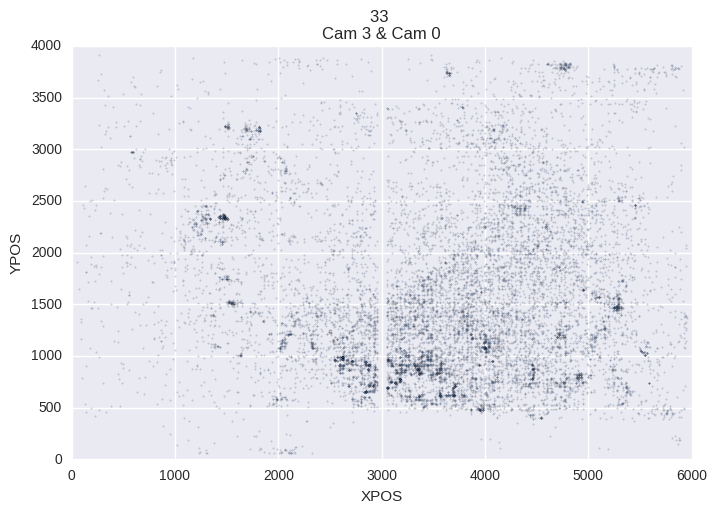

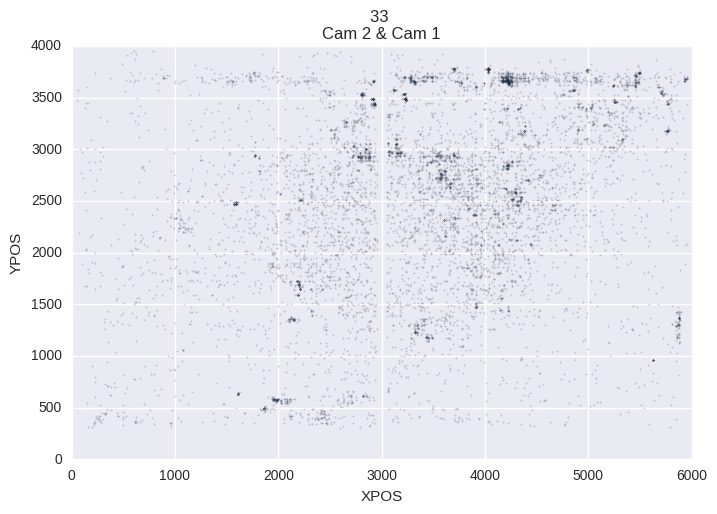

In [317]:
plt3 = plotCommunityFrac(ids,3,conn, 0.01)

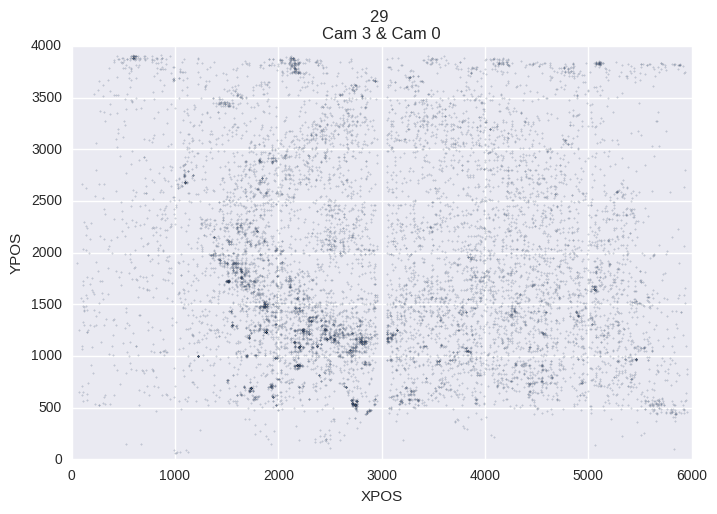

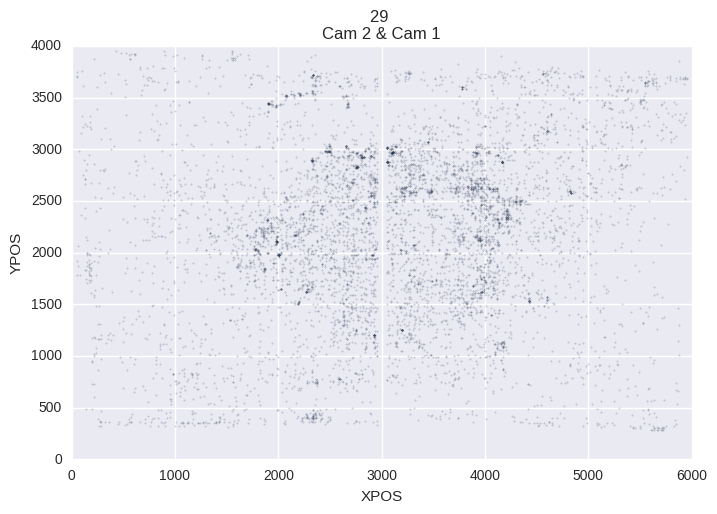

In [318]:
plt4 = plotCommunityFrac(ids,4,conn, 0.01)

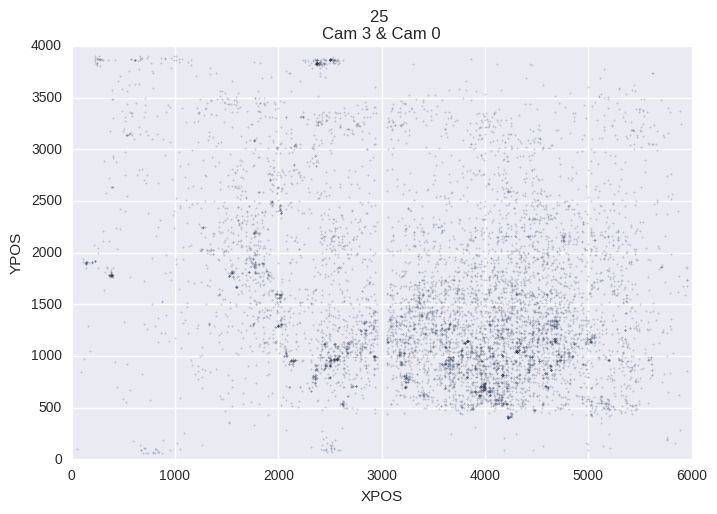

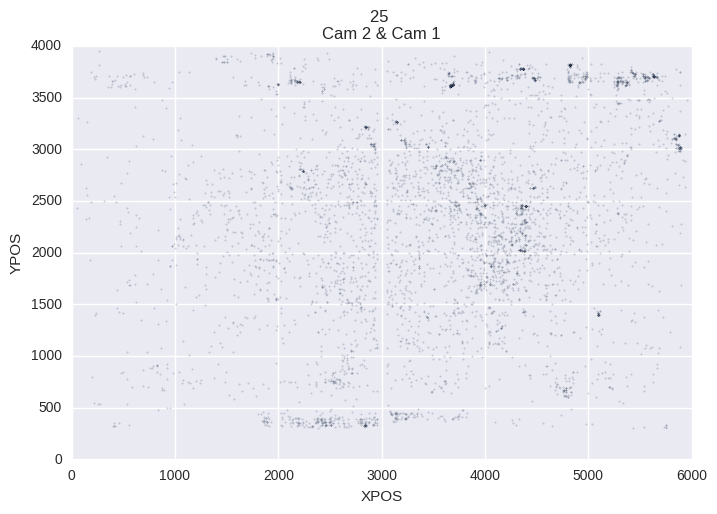

In [319]:
plt5 = plotCommunityFrac(ids,5,conn, 0.01)

## Some hour at noon

In [387]:
g2 = ig.Graph.Read_GraphML("networks-hours/2015-08-21T12:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml")

In [388]:
g2.summary()

'IGRAPH U-W- 982 14090 -- \n+ attr: id (v), weight (e)'

In [389]:
def removeEdges(g, weight):
    print(g.summary())
    # Niedrige Kanten entfernen
    l = list(g.es.select(weight_le = weight))

    l = [elem.index for elem in l]
    g.delete_edges(l)
    print(g.summary())

    v = list(g.vs.select(_degree = 0))
    v = [elem.index for elem in v]
    g.delete_vertices(v)
    print(g.summary())

In [390]:
def getCommunities(g, limit):

    c = g.community_infomap()

    # keep communities with lots of members
    cl = [(e,s) for e,s in enumerate(c.sizes()) if s > limit]

    print(cl)

    a,b = zip(*cl)

    a = list(a)
    b = list(b)

    membership = c.membership
    ids = [[] for i in range(len(cl))]

    print(ids)

    for name, membership in zip(g.vs, membership):
        if membership in a:
            ids[membership].append(int(name['id']))

    return ids

In [392]:
removeEdges(g2,1)

IGRAPH U-W- 982 14090 -- 
+ attr: id (v), weight (e)
IGRAPH U-W- 982 3382 -- 
+ attr: id (v), weight (e)
IGRAPH U-W- 845 3382 -- 
+ attr: id (v), weight (e)


In [394]:
noon = getCommunities(g2, 20)

[(0, 162), (1, 99), (2, 43), (3, 41), (4, 31), (5, 28), (6, 25)]
[[], [], [], [], [], [], []]


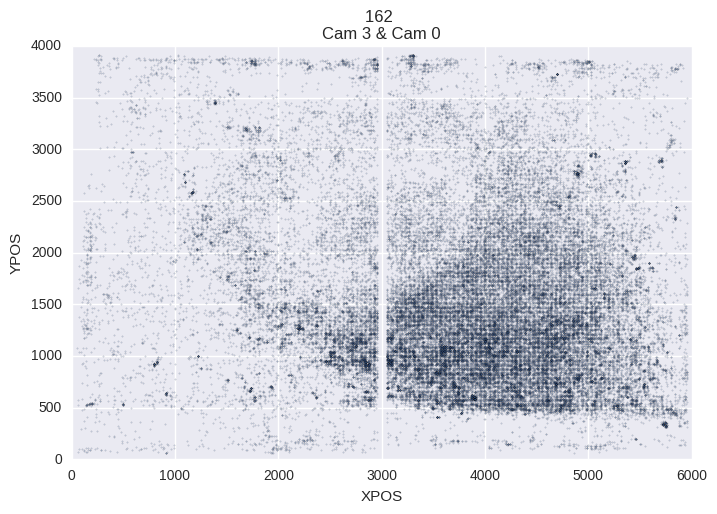

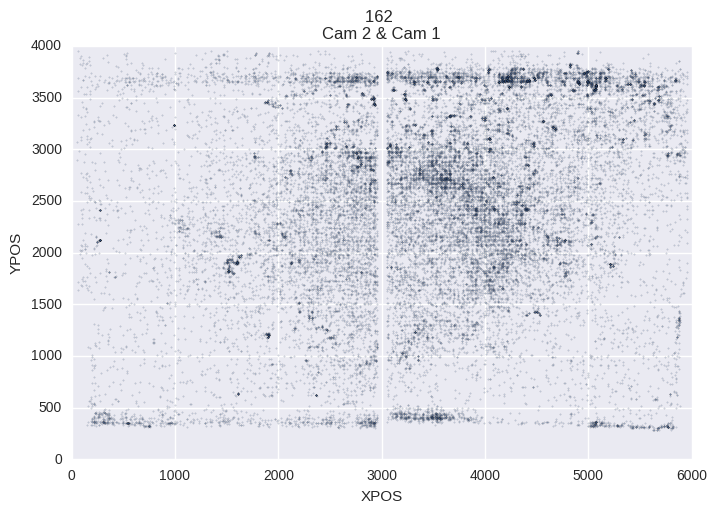

In [395]:
noon0 = plotCommunityFrac(noon,0,conn, 0.01)

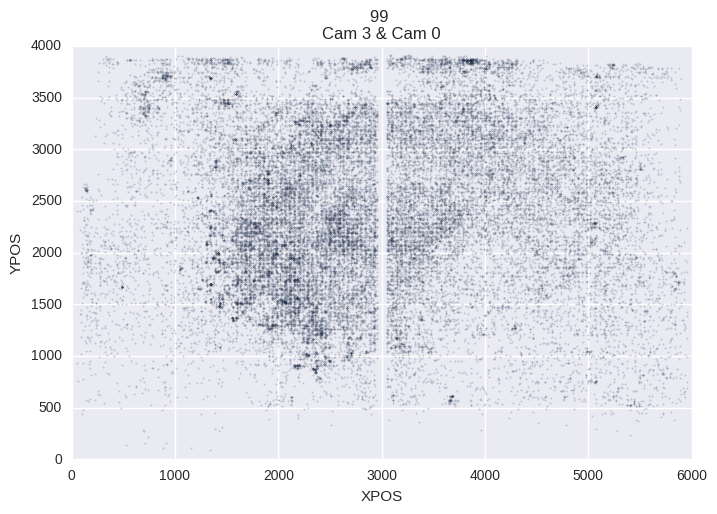

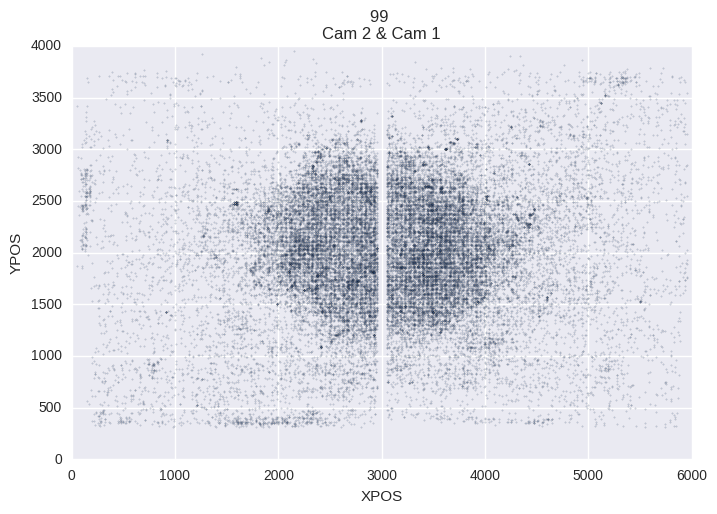

In [396]:
noon1 = plotCommunityFrac(noon,1,conn, 0.01)

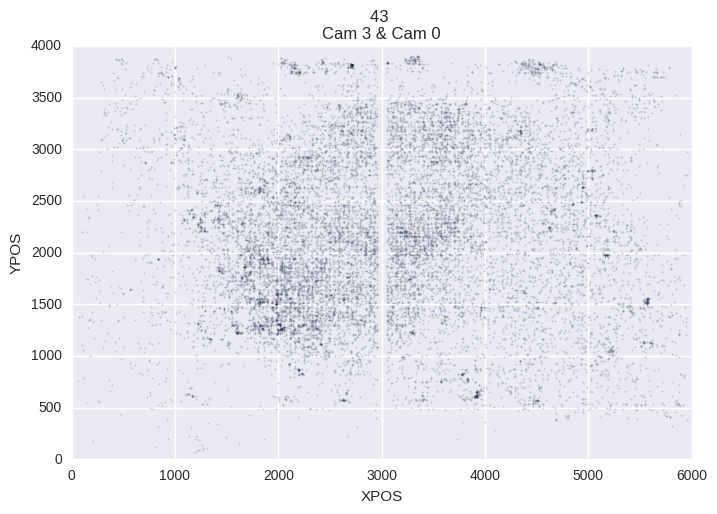

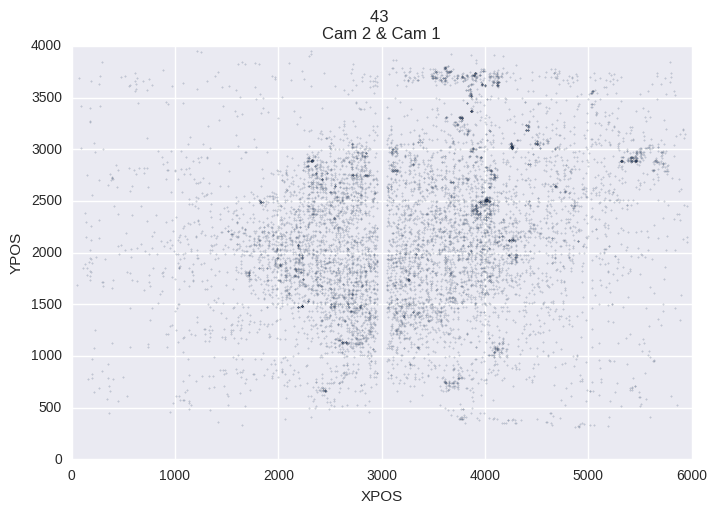

In [397]:
noon2 = plotCommunityFrac(noon,2,conn, 0.01)

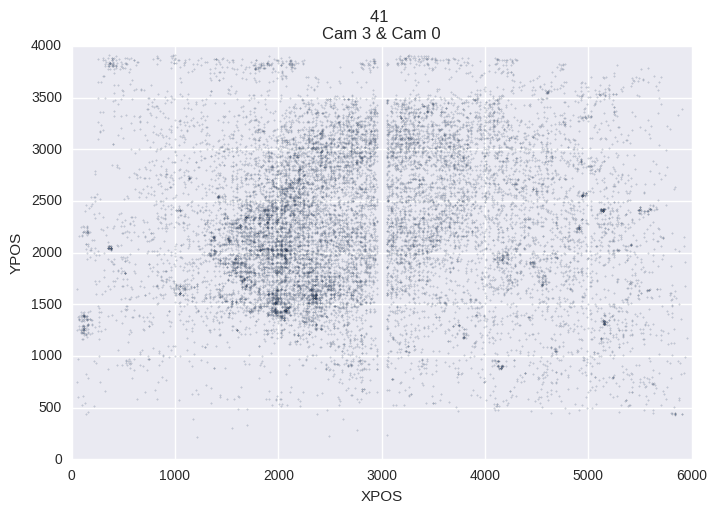

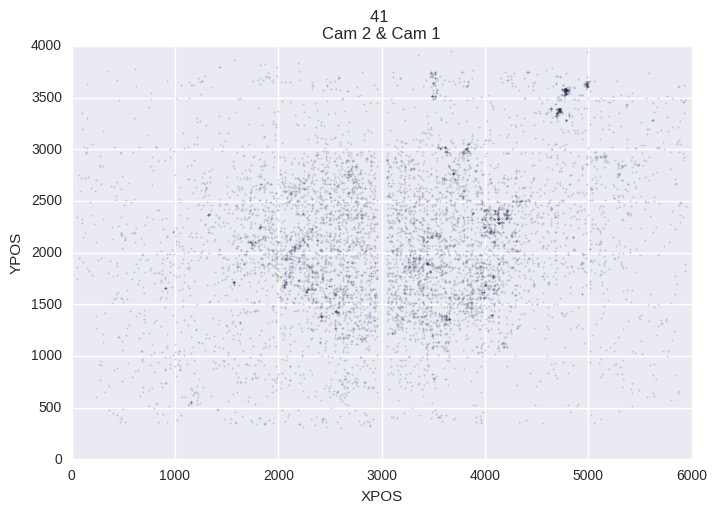

In [398]:
noon3 = plotCommunityFrac(noon,3,conn, 0.01)

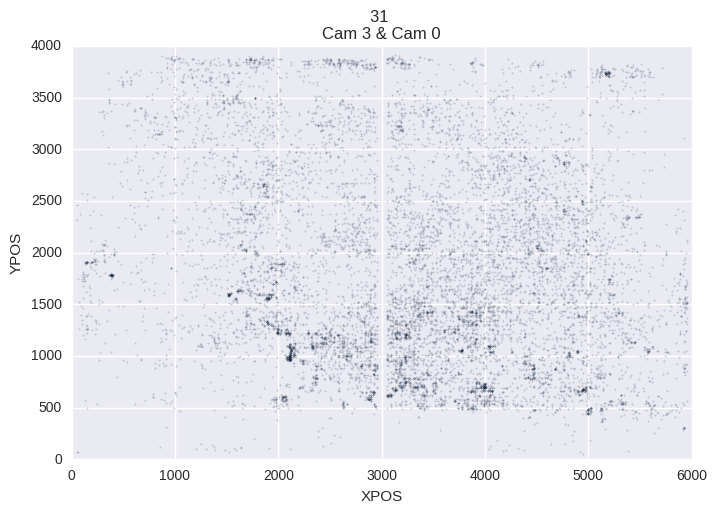

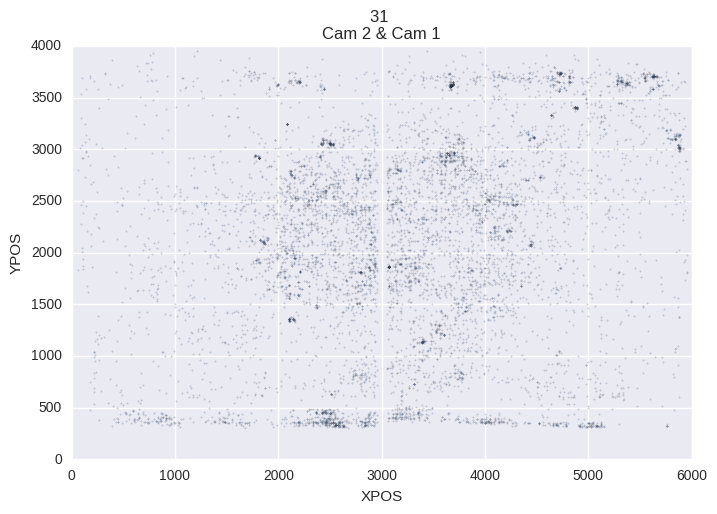

In [399]:
noon4 = plotCommunityFrac(noon,4,conn, 0.01)

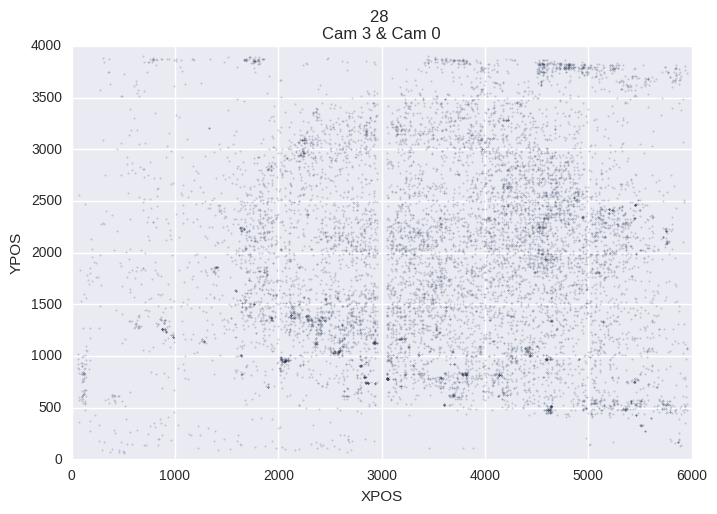

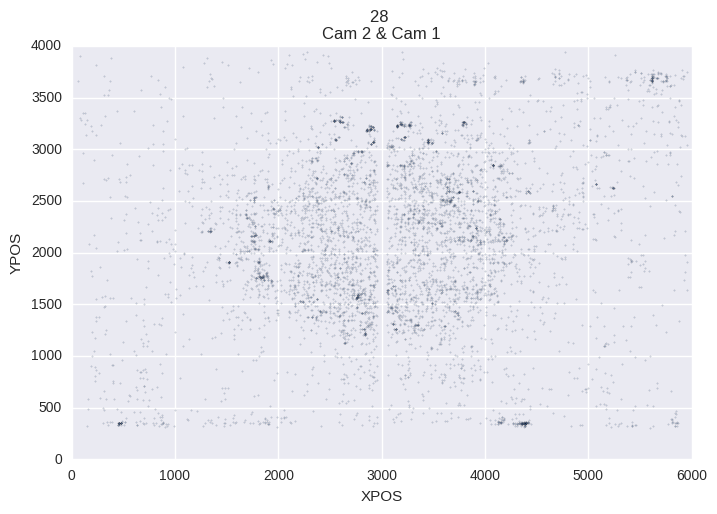

In [400]:
noon5 = plotCommunityFrac(noon,5,conn, 0.01)

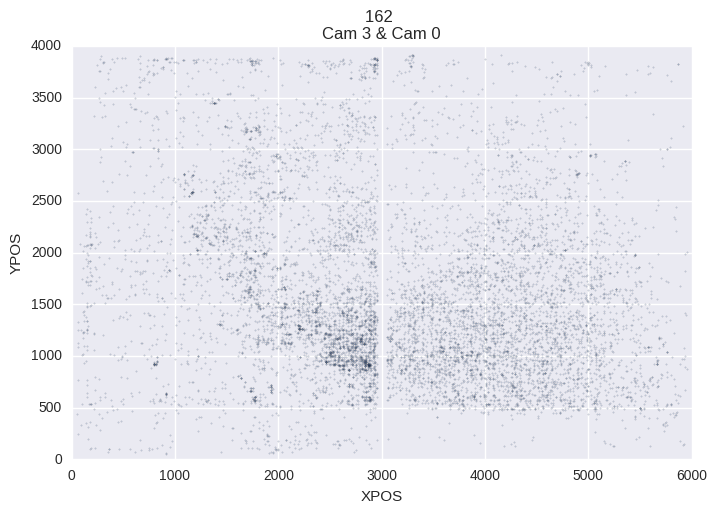

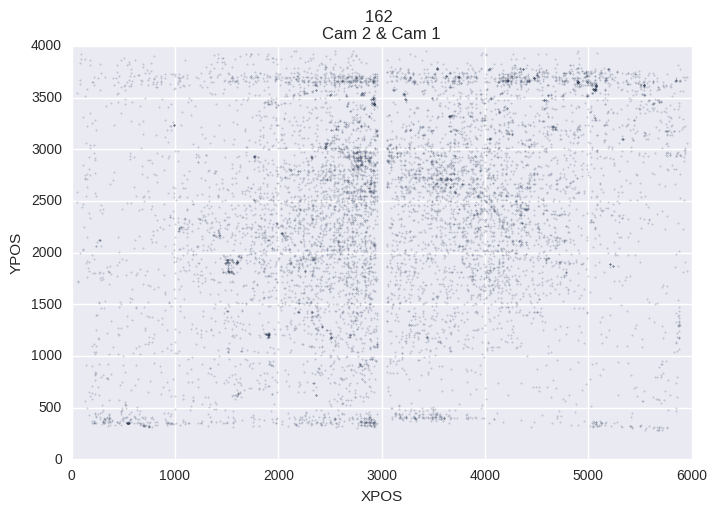

In [404]:
noon00 = plotCommunity(noon,0,conn)

In [412]:
def plotHeatmapXY(txt, df, camIDleft, camIDright, s=5000):
    data_l = df[df.CAM_ID == camIDleft].sample(s)
    data_r = df[df.CAM_ID == camIDright].sample(s)
    data_r.XPOS = data_r.XPOS + 3000

    data = pd.concat([data_l,data_r])
    x = data.XPOS
    y = data.YPOS
    
#     heatmap, xedges, yedges = np.histogram2d(x, y, bins=50)
#     extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
#     plt.clf()
#     plt.imshow(heatmap.T, extent=extent, origin='lower')
#     plt.show()
    
#     plt.hexbin(x,y)
#     plt.show()

    H, xedges, yedeges, im = plt.hist2d(x,y,bins=[60,40])
    plt.colorbar()
    plt.axes().set_title("{} \nCam {} & Cam {}".format(txt, str(camIDleft), str(camIDright)))
    
    return H
#     data.plot.scatter(x='XPOS', y="YPOS",s=1, xlim=(0,6000),ylim=(0,4000), alpha=0.2)
#     plt.axes().set_aspect('equal')
#     plt.axes().set_title("{} \nCam {} & Cam {}".format(txt, str(camIDleft), str(camIDright)))

In [413]:
def plotCommunityHeatmap(ids, index, conn):
    infomap = getDFwithIDS(ids[index], conn)
    plotHeatmapXY(str(len(ids[index])), infomap, 3, 0)
    plt.show()
    plotHeatmapXY(str(len(ids[index])), infomap, 2, 1)
    plt.show()

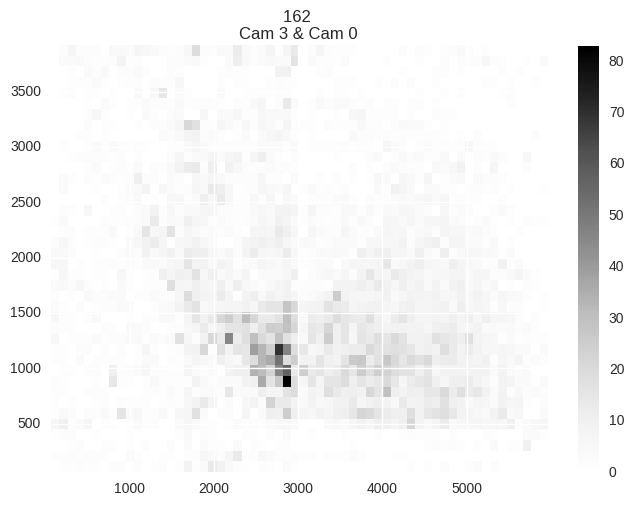

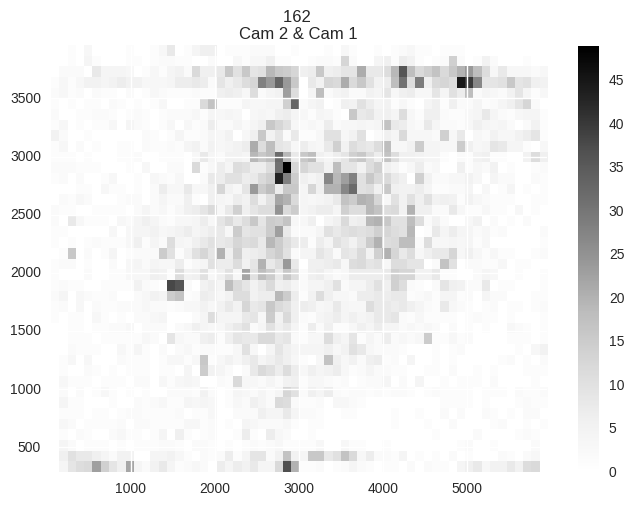

In [414]:
plotCommunityHeatmap(noon,0, conn)

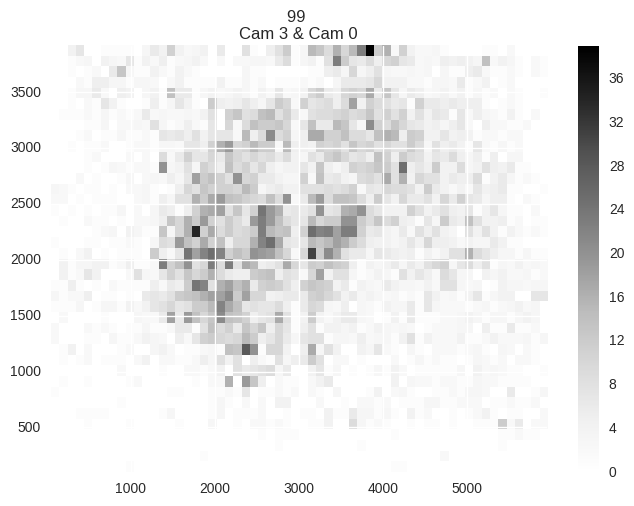

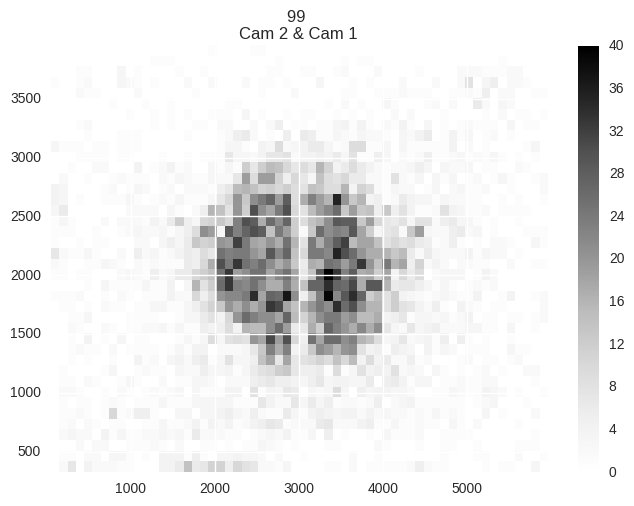

In [415]:
plotCommunityHeatmap(noon,1, conn)

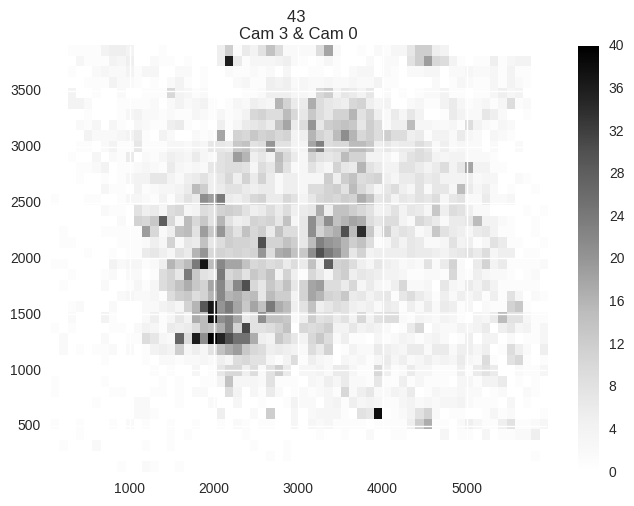

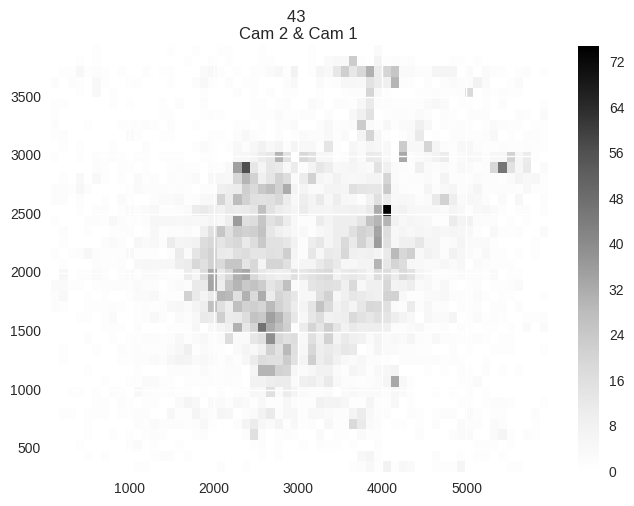

In [417]:
plotCommunityHeatmap(noon,2, conn)

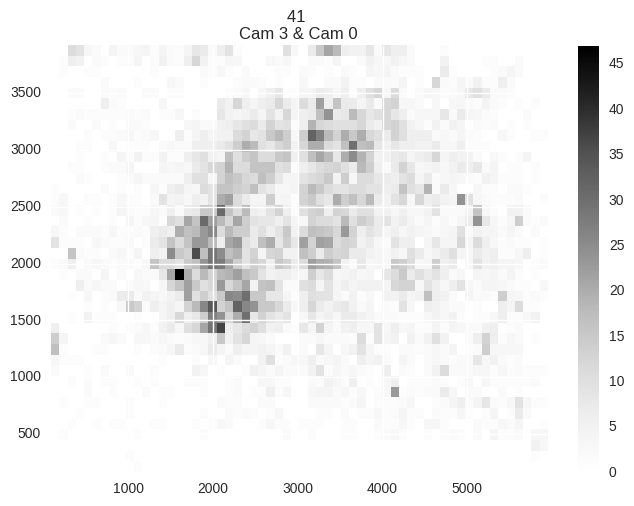

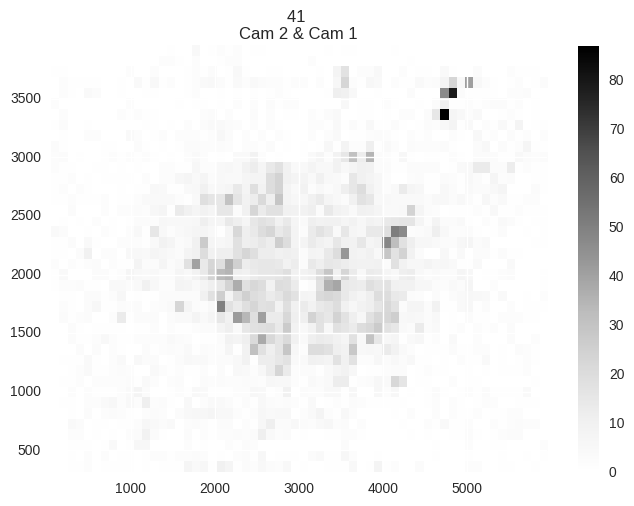

In [418]:
plotCommunityHeatmap(noon,3, conn)

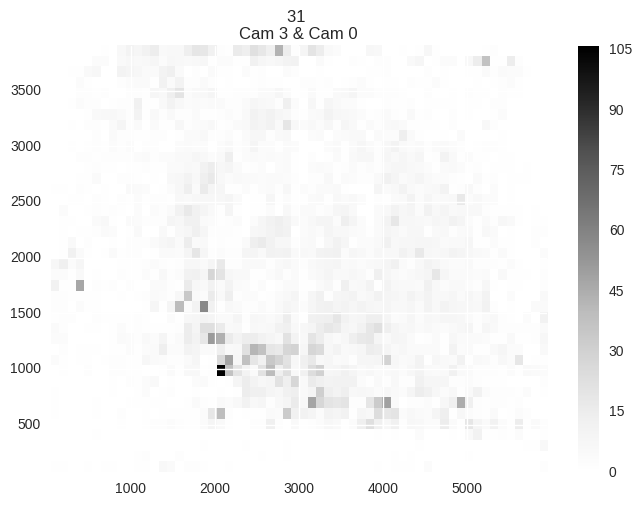

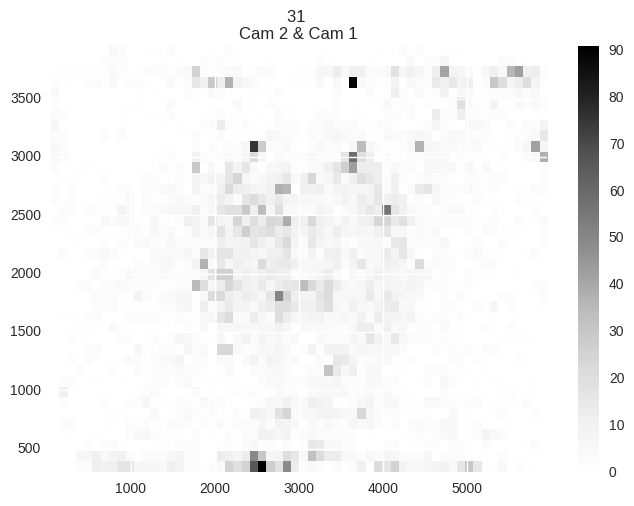

In [419]:
plotCommunityHeatmap(noon,4, conn)

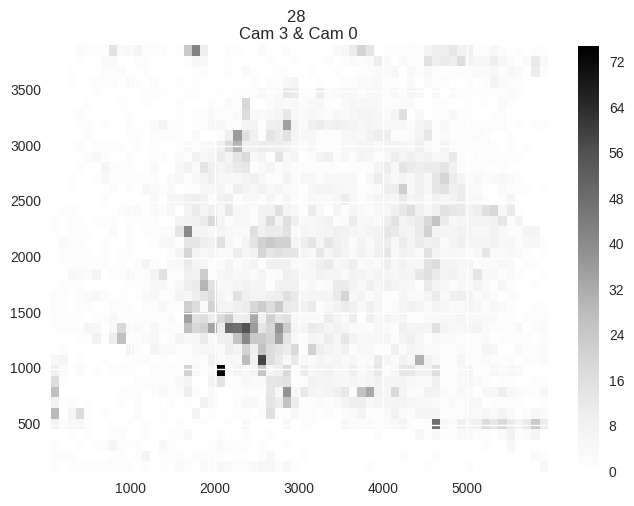

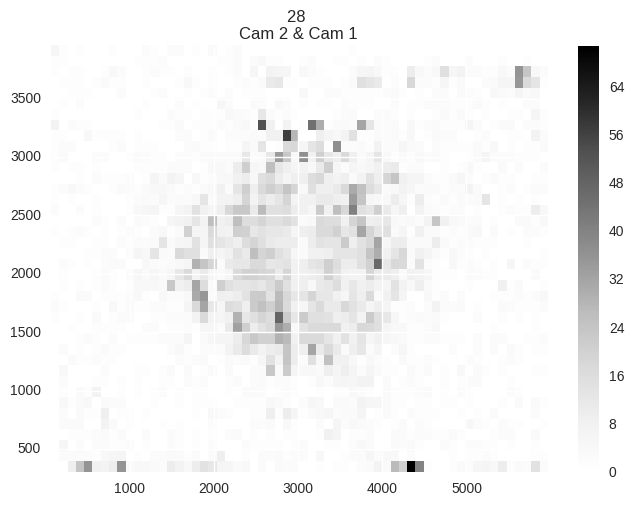

In [420]:
plotCommunityHeatmap(noon,5, conn)

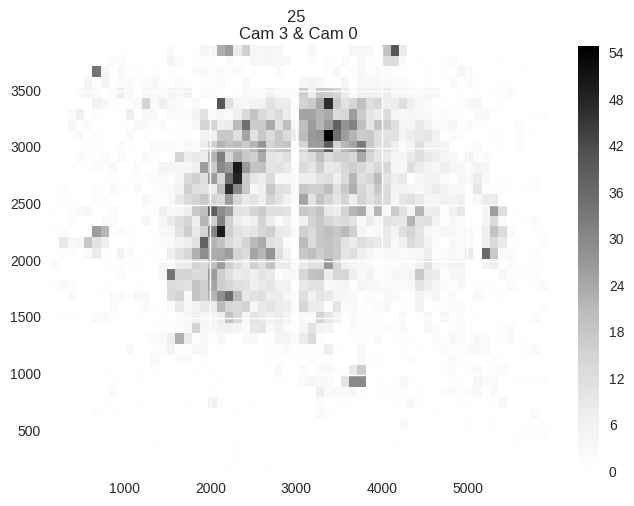

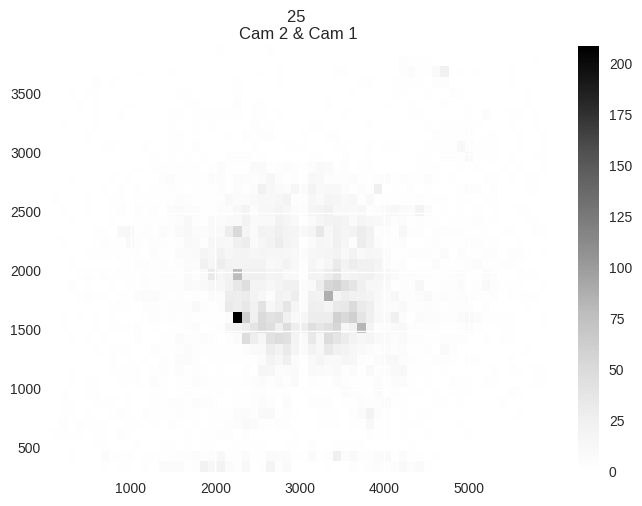

In [421]:
plotCommunityHeatmap(noon,6, conn)

In [423]:
len(ids)

6

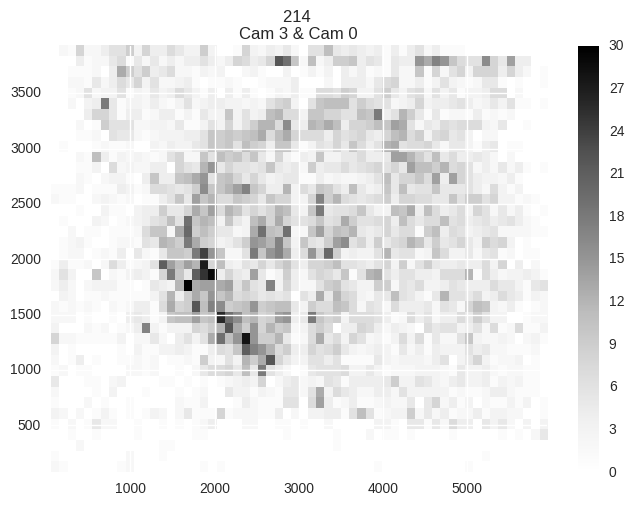

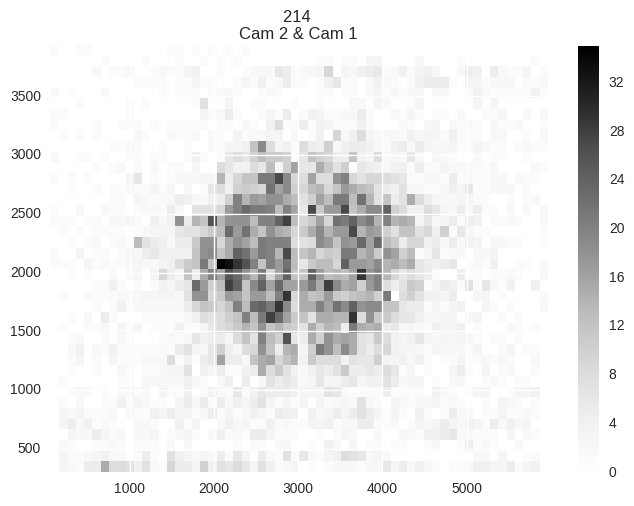

In [424]:
plotCommunityHeatmap(ids,0, conn)

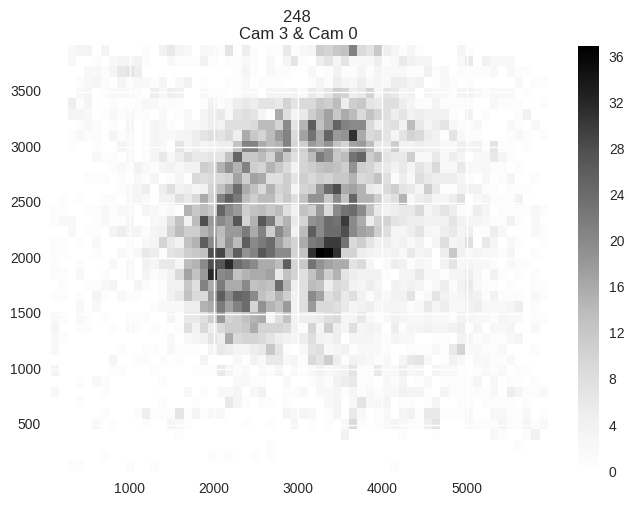

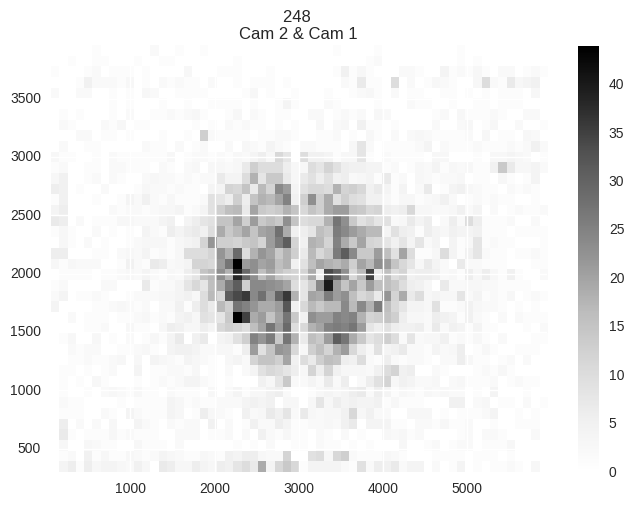

In [425]:
plotCommunityHeatmap(ids,1, conn)

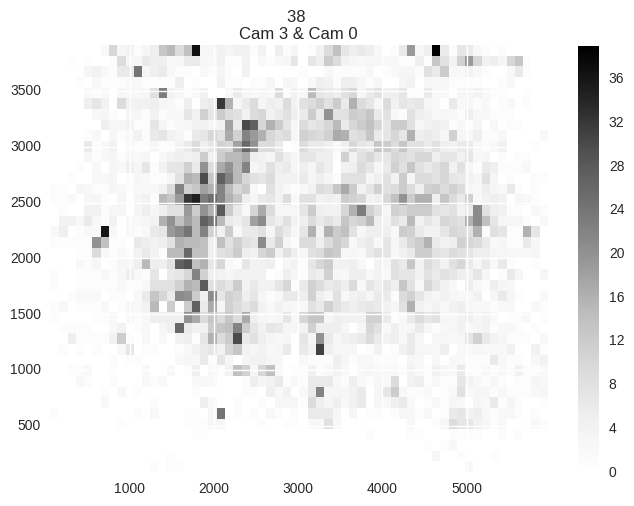

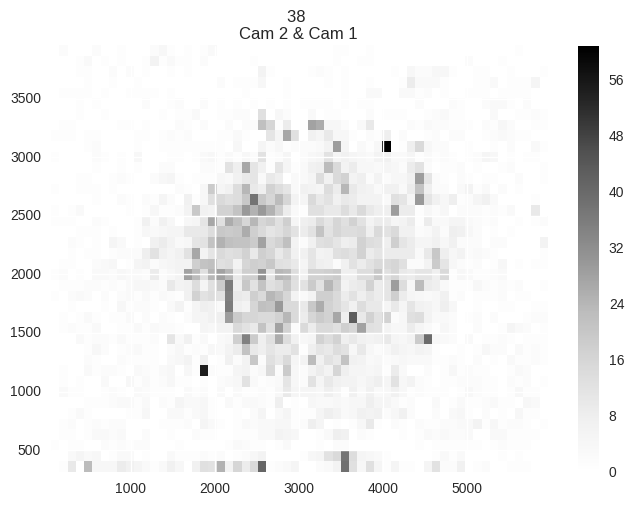

In [426]:
plotCommunityHeatmap(ids,2, conn)

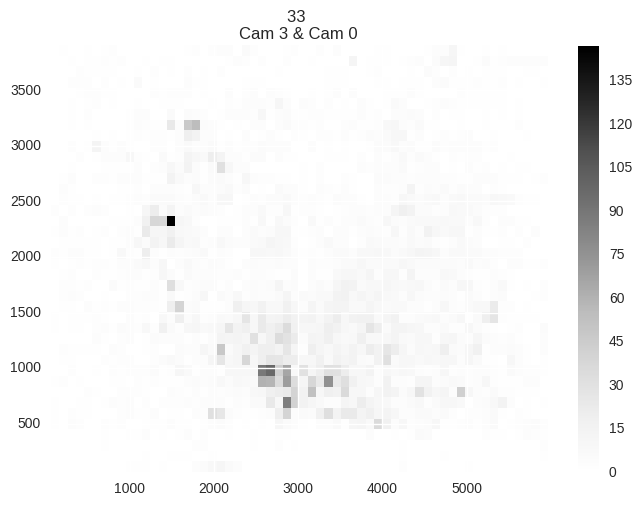

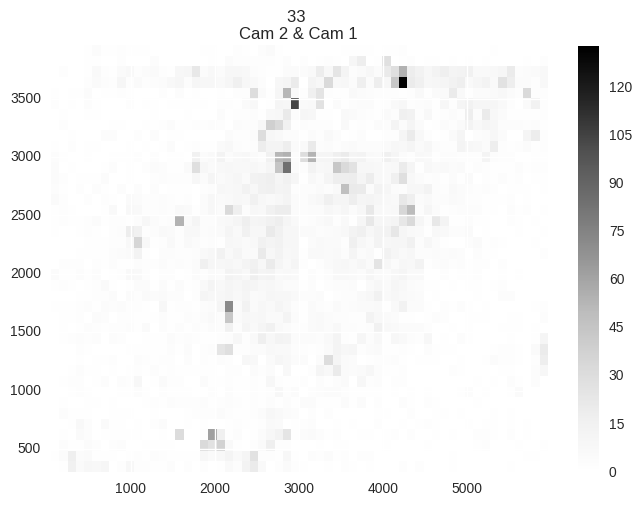

In [427]:
plotCommunityHeatmap(ids,3, conn)

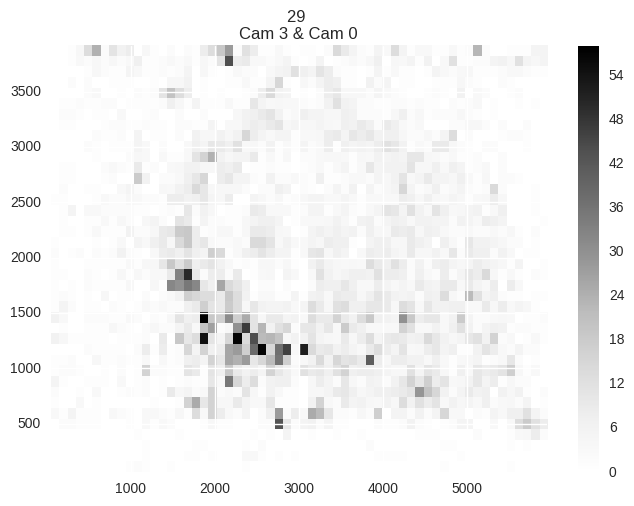

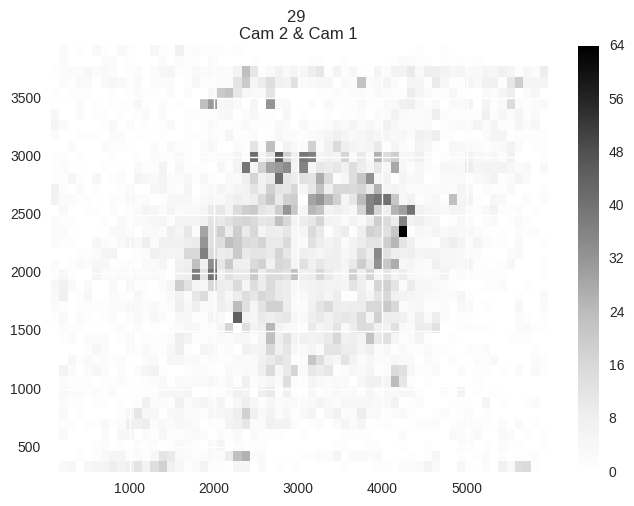

In [428]:
plotCommunityHeatmap(ids,4, conn)

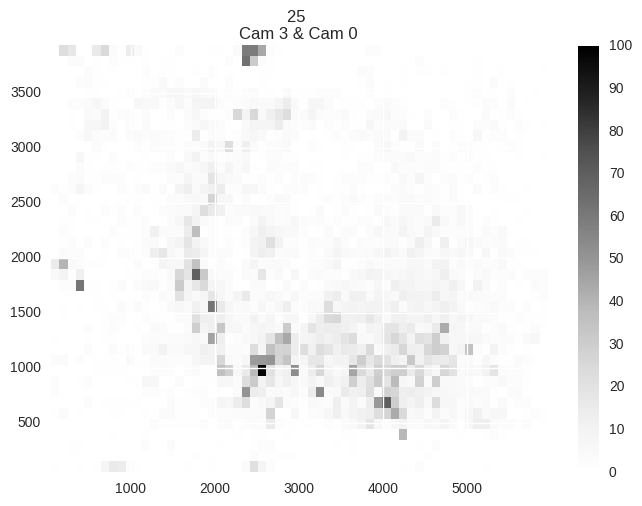

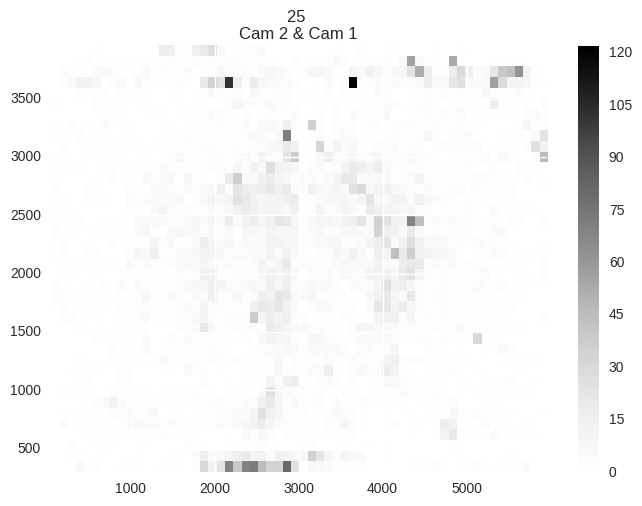

In [429]:
plotCommunityHeatmap(ids,5, conn)

# Infomap für das Tagesnetzwerk

In [433]:
g21 = ig.Graph.Read_GraphML("networks-days/2015-08-21T00:00:00Z_1d_allCams_0.99conf_160dist_6ilen.graphml")

In [353]:
g21.summary()

'IGRAPH U-W- 1202 152449 -- \n+ attr: id (v), weight (e)'

In [354]:
# Niedrige Kanten entfernen
l = list(g21.es.select(weight_le = 1))

l = [elem.index for elem in l]
g21.delete_edges(l)
g21.summary()

v = list(g21.vs.select(_degree = 0))
v = [elem.index for elem in v]
g21.delete_vertices(v)
g21.summary()

In [360]:
c = g21.community_infomap(trials=50)

In [361]:
g21.transitivity_undirected()

0.2166444610572469

In [362]:
c.sizes()

[1095]

# Irgendwas anderes für das Tagesnetzwerk

In [439]:
fg  = g21.community_fastgreedy()

In [440]:
vc = fg.as_clustering(fg.optimal_count)

In [457]:
vc.sizes().sort()

In [438]:
print(Counter(vc.membership))

Counter({1: 661, 0: 509, 3: 12, 5: 9, 4: 8, 2: 3})


In [34]:
def getCommunitiesFastGreedy(g, limit):

    fg = g.community_fastgreedy()
    vc = fg.as_clustering(fg.optimal_count)

    # keep communities with lots of members
    cl = [(e,s) for e,s in enumerate(vc.sizes()) if s > limit]

    print(cl)

    a,b = zip(*cl)

    a = list(a)
    b = list(b)

    membership = vc.membership
    ids = [[] for i in range(len(vc.sizes()))]

    for name, membership in zip(g.vs, membership):
        if membership in a:
            ids[membership].append(int(name['id']))

    return [i for i in ids if (len(i) > limit)]

In [444]:
c = getCommunitiesFastGreedy(g21, 20)

[(0, 509), (1, 661)]
[[], []]


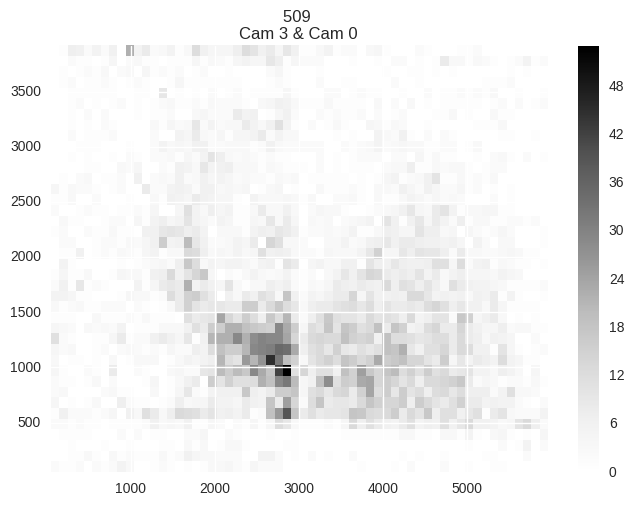

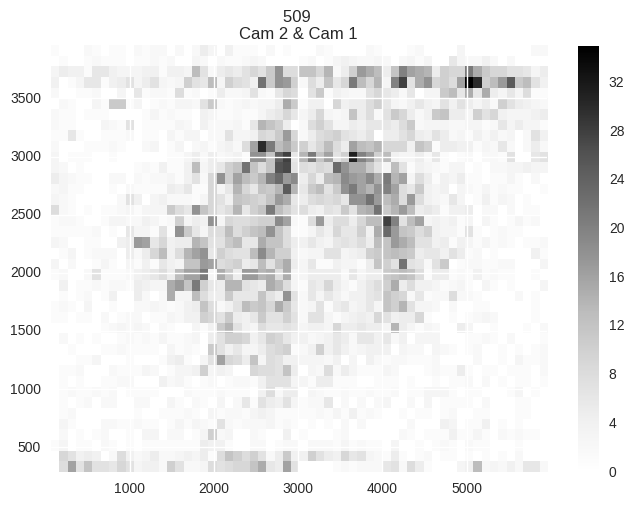

In [446]:
plotCommunityHeatmap(c,0, conn)

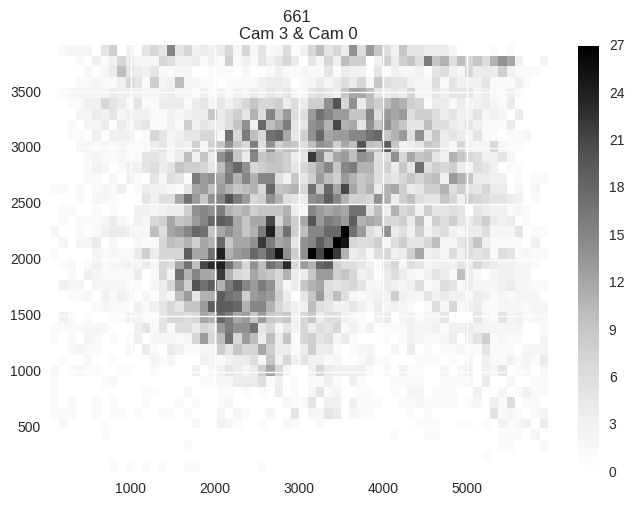

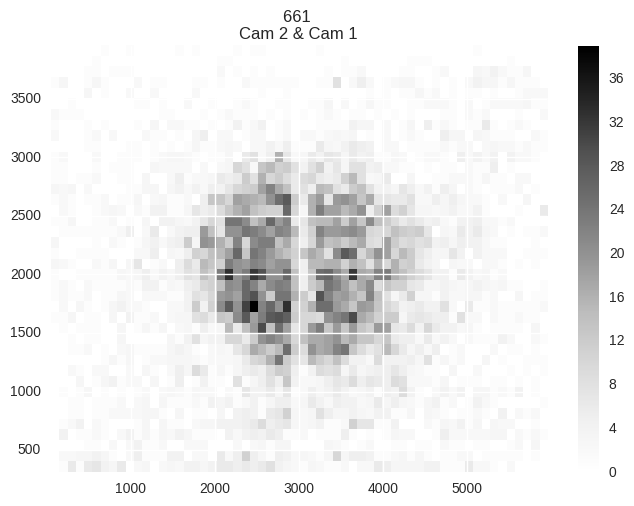

In [447]:
plotCommunityHeatmap(c,1, conn)

# FastGreedy for hourly Networks

In [63]:
def plotForHour(path, limit):
    g = ig.Graph.Read_GraphML(path)
    print(g.summary())
    c = getCommunitiesFastGreedy(g,limit)
    print(c)
    print([len(cc) for cc in c])
    for i in list(range(len(c))):
        plotCommunityHeatmapFrac(c, i, conn, path)

In [65]:
def plotCommunityHeatmapFrac(ids, index, conn, path):
    infomap = getDFwithIDS(ids[index], conn)
    plotHeatmapXYFrac(str(len(ids[index])), infomap, 3, 0, path, 0.05)
    plt.show()
    plotHeatmapXYFrac(str(len(ids[index])), infomap, 2, 1, path, 0.05)
    plt.show()

<module 'matplotlib.pyplot' from '/home/mi/aschle/miniconda3/lib/python3.5/site-packages/matplotlib/pyplot.py'>

In [74]:
def plotHeatmapXYFrac(txt, df, camIDleft, camIDright, path, f=0.5):
    data_l = df[df.CAM_ID == camIDleft].sample(frac=f)
    data_r = df[df.CAM_ID == camIDright].sample(frac=f)
    data_r.XPOS = data_r.XPOS + 3000

    data = pd.concat([data_l,data_r])
    x = data.XPOS
    y = data.YPOS

    H, xedges, yedeges, im = plt.hist2d(x,y,bins=[60,40])
    plt.colorbar()
    plt.axes().set_title("{} \nCam {} & Cam {}".format(txt, str(camIDleft), str(camIDright)))
    plt.savefig("{}-{}-{}-{}.png".format(camIDleft, camIDright, path.split("_")[0].split("/")[-1], txt))
    return H

IGRAPH U-W- 772 5691 -- 
+ attr: id (v), weight (e)
[(1, 143), (2, 230), (3, 358)]
[[2050, 2062, 2097, 2121, 2138, 2155, 2178, 2231, 2235, 2251, 2318, 2326, 2329, 2349, 2359, 320, 2386, 2411, 2415, 2420, 384, 2467, 2488, 2510, 2514, 2519, 2524, 2530, 2534, 2556, 2567, 2571, 2575, 2583, 2626, 2631, 2678, 2725, 2734, 2504, 2742, 2744, 2764, 2786, 2140, 2845, 2856, 2869, 828, 2883, 2897, 1507, 2904, 2947, 2955, 2966, 2968, 2978, 940, 3009, 3017, 3027, 3035, 3055, 3062, 3063, 3066, 3086, 3118, 3129, 3157, 3185, 3212, 3255, 3289, 3307, 3316, 3328, 1288, 180, 3364, 3400, 3409, 3418, 3422, 3424, 3430, 3469, 3474, 3527, 3533, 3538, 3539, 3544, 3574, 3601, 3630, 3637, 3646, 3649, 3650, 3667, 3686, 3703, 3709, 3712, 3724, 3740, 3744, 3747, 3753, 3761, 3762, 3770, 3794, 3806, 1777, 3827, 3828, 3835, 3841, 3844, 3863, 3866, 3875, 3887, 3894, 1848, 3897, 1494, 3922, 3925, 3935, 3938, 3972, 3976, 3984, 4028, 4035, 4047, 2005, 4060, 4069], [2053, 2057, 2058, 2059, 2066, 2069, 2076, 2086, 40, 2094, 48

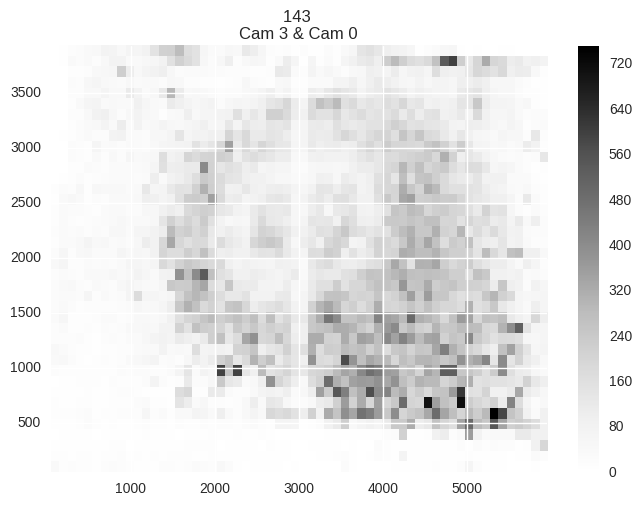

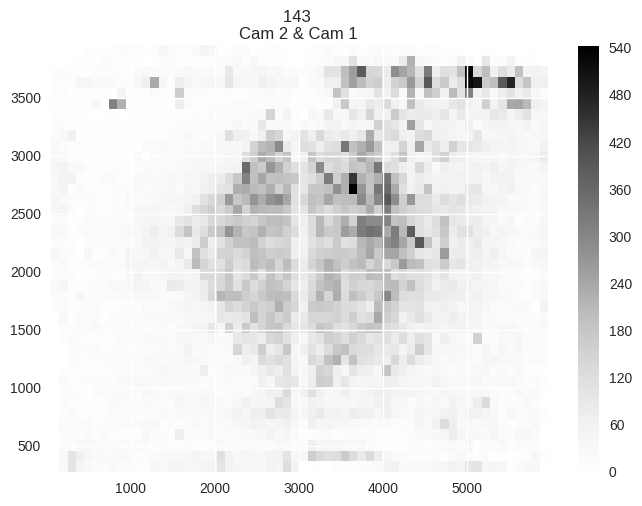

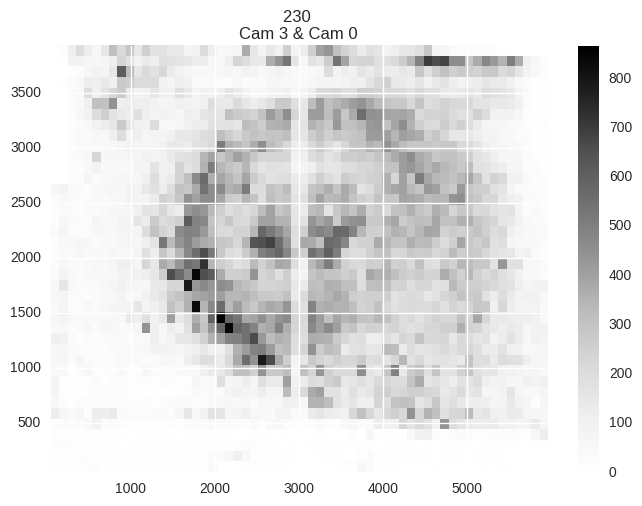

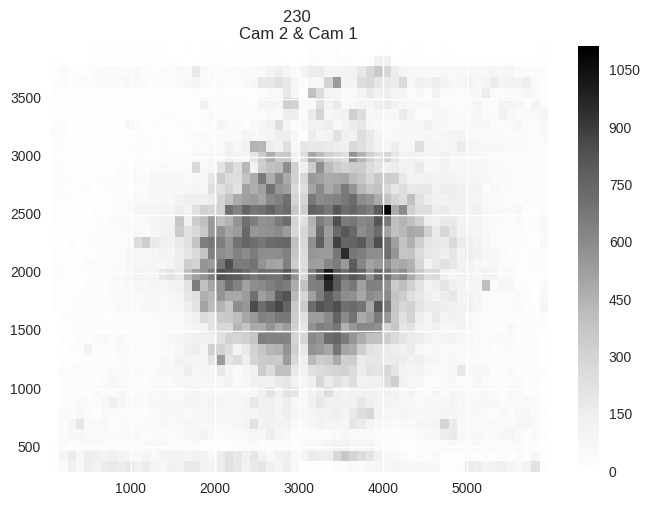

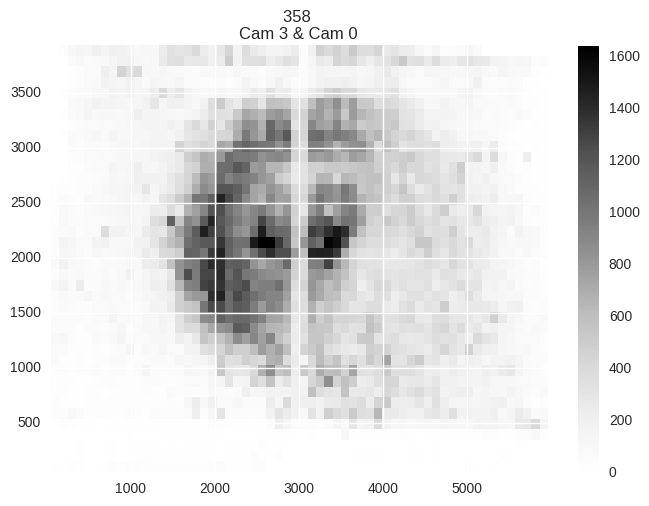

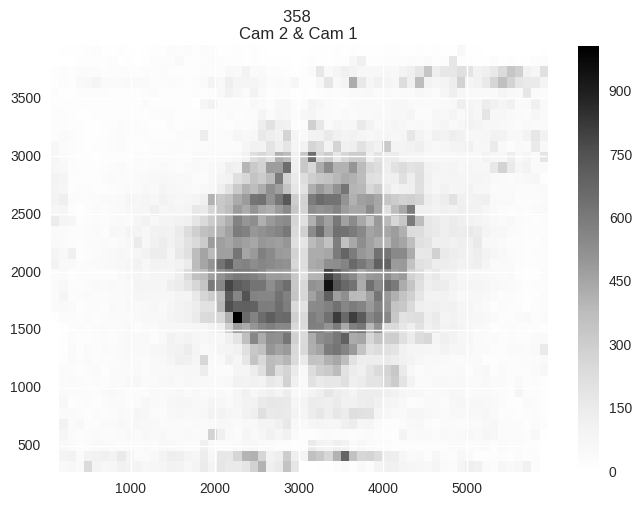

In [510]:
plotForHour("networks-hours/2015-08-21T00:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 993 14991 -- 
+ attr: id (v), weight (e)
[(0, 343), (1, 385), (2, 250)]
[[2048, 2050, 2055, 2392, 2076, 2078, 2091, 2092, 2102, 2111, 2114, 2117, 2121, 2123, 2744, 2131, 2138, 2157, 2161, 2165, 118, 2171, 2177, 2181, 2195, 2204, 2211, 2214, 2217, 2224, 2234, 2238, 2247, 2253, 3789, 2265, 2768, 2279, 2282, 2088, 2295, 2296, 2432, 2318, 2325, 280, 2339, 2350, 2357, 2359, 2366, 2379, 2387, 2403, 2407, 2411, 2412, 2413, 2431, 2434, 2437, 405, 956, 2461, 2463, 2466, 2467, 2482, 2488, 2507, 2509, 2513, 2514, 2519, 2522, 2525, 2530, 2534, 2546, 2556, 2565, 2567, 2569, 2574, 2582, 2585, 2589, 2598, 3847, 2608, 2615, 2623, 2625, 2626, 2631, 2640, 2645, 2652, 2657, 2675, 2685, 644, 2694, 2696, 2713, 2720, 2723, 2734, 2504, 2738, 2745, 2757, 2255, 2766, 2684, 2786, 3196, 2809, 2814, 2815, 2817, 2834, 2845, 2850, 2851, 2853, 2861, 2869, 2874, 2881, 2889, 2890, 2903, 2907, 2909, 2919, 2937, 2946, 2540, 2954, 2955, 2957, 2958, 2962, 2966, 2978, 936, 2986, 3008, 3009, 968, 3021, 2552, 302

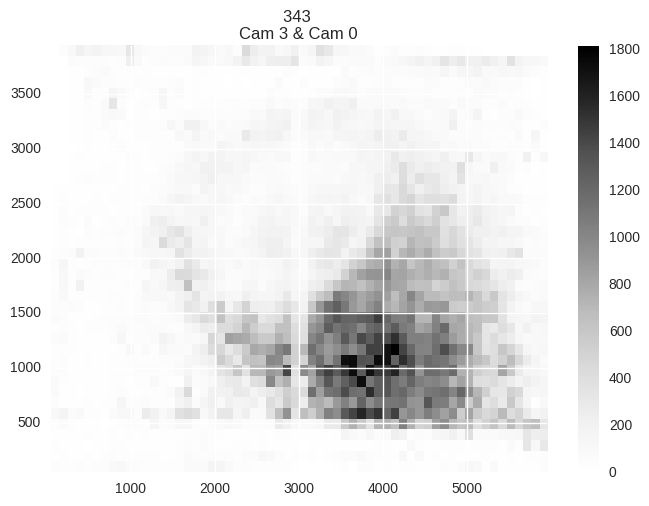

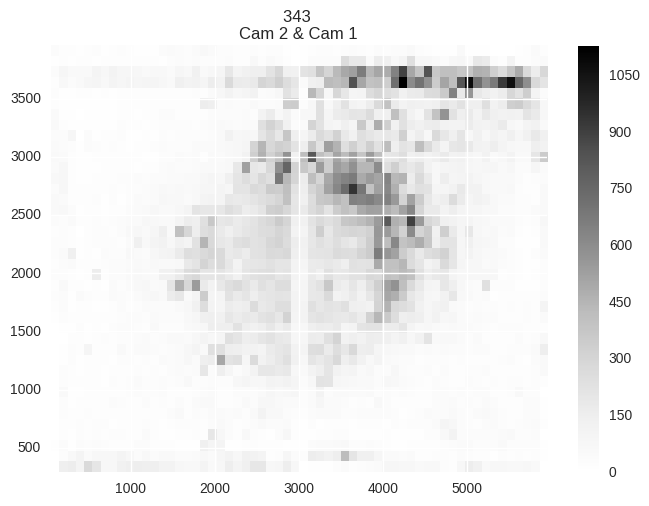

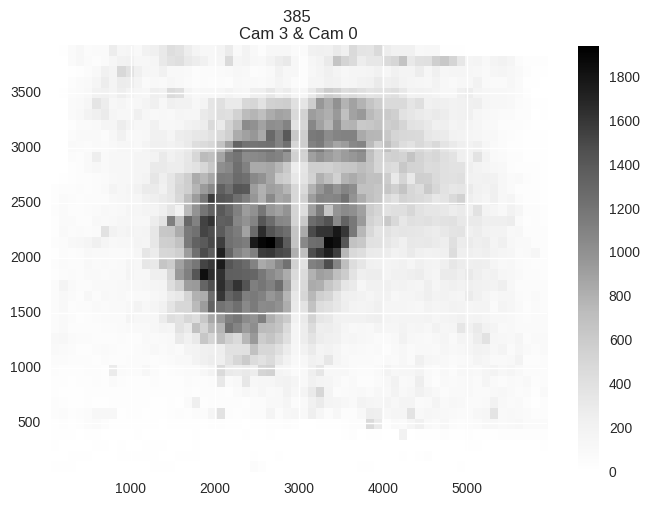

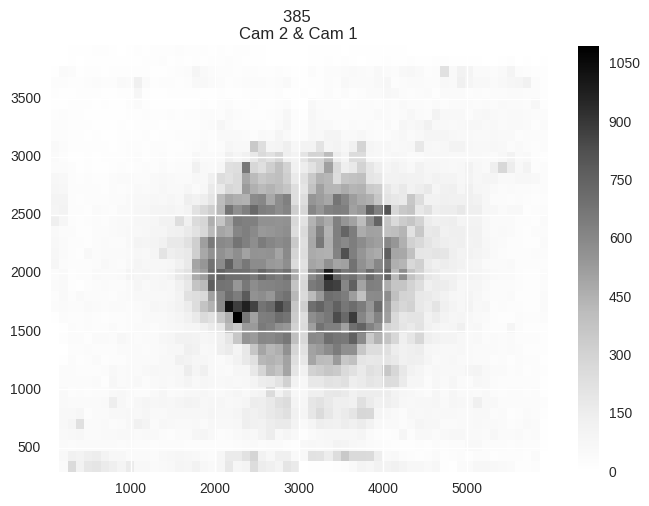

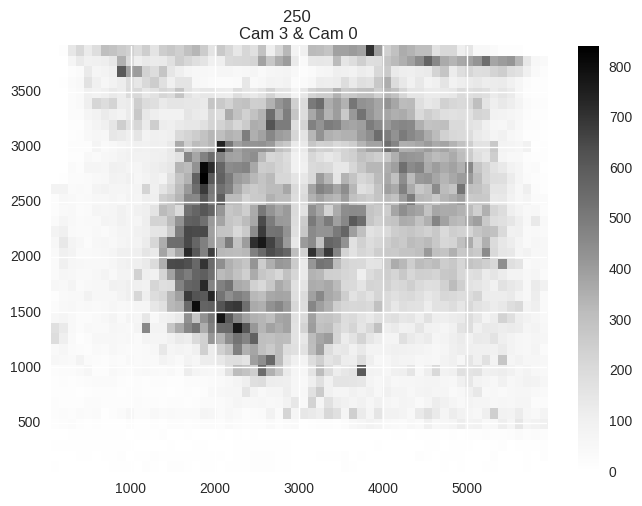

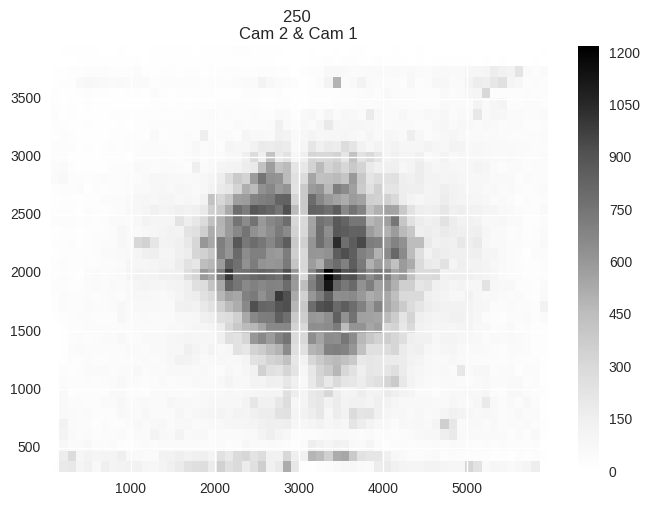

In [511]:
plotForHour("networks-hours/2015-08-21T10:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 797 6667 -- 
+ attr: id (v), weight (e)
[(0, 244), (1, 225), (2, 302)]
[[2048, 2055, 2058, 2660, 2083, 2090, 2091, 2092, 2094, 2102, 2114, 2121, 2123, 2127, 2161, 2163, 120, 2190, 2199, 2210, 2233, 2235, 2238, 192, 2245, 2270, 2279, 2282, 2283, 2286, 2088, 2295, 2296, 2318, 2322, 2323, 2329, 2349, 2359, 2367, 2371, 2379, 2382, 2412, 2415, 368, 2420, 2430, 2435, 2465, 2467, 2474, 2488, 456, 464, 2523, 480, 2540, 2547, 2551, 2557, 2585, 2598, 2602, 556, 568, 2626, 2641, 596, 2653, 2675, 2682, 2685, 2696, 2204, 2710, 2720, 2723, 2734, 2744, 2745, 702, 2778, 2793, 780, 2839, 2180, 2842, 2861, 2869, 2881, 2882, 2889, 2904, 2907, 2919, 2927, 2937, 2946, 2947, 2951, 2954, 2958, 2968, 2976, 2978, 2985, 960, 3009, 3017, 2552, 3029, 3030, 3043, 1000, 3062, 3063, 3068, 3071, 3075, 3080, 3086, 3113, 3114, 3141, 3143, 3145, 3157, 3165, 3171, 3181, 3185, 3186, 3191, 3214, 3237, 3250, 3255, 2932, 3278, 3279, 3289, 3291, 3304, 3305, 3313, 3320, 3322, 3346, 3353, 3358, 3369, 3374, 3381, 338

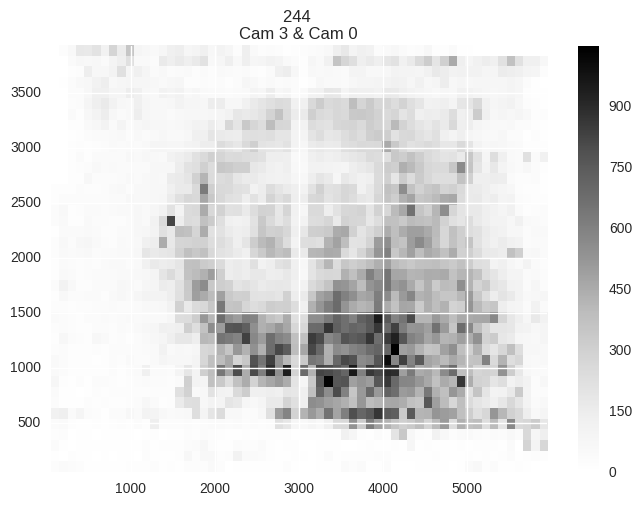

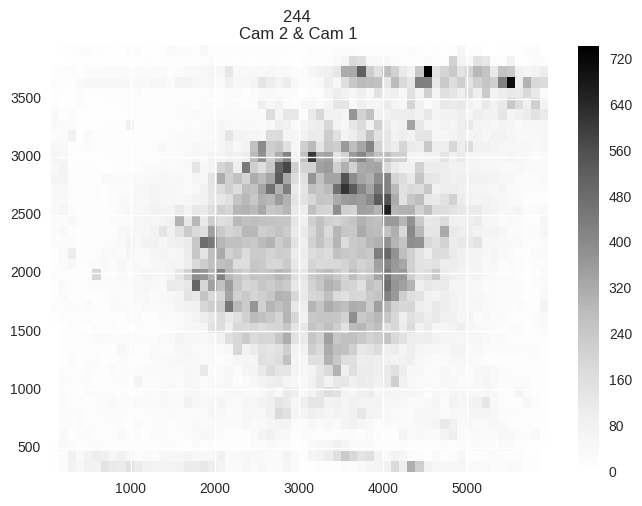

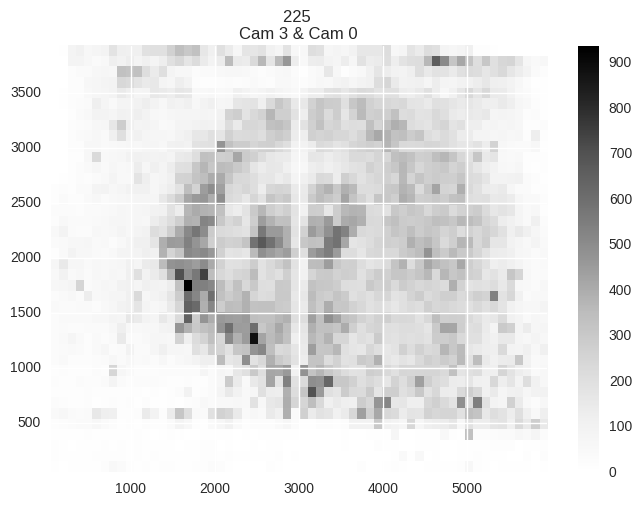

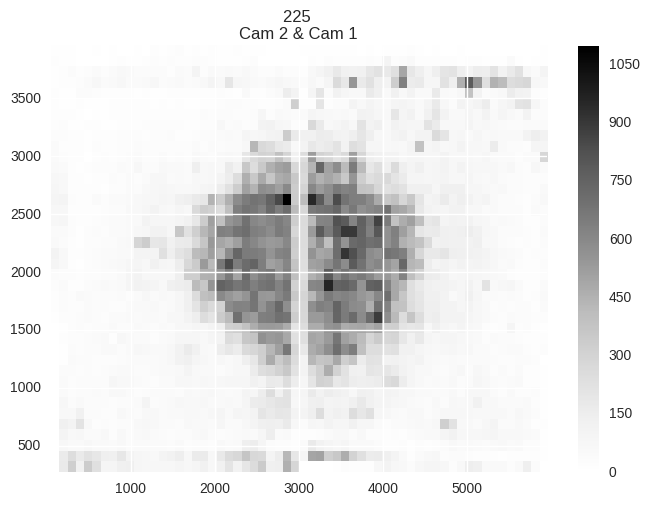

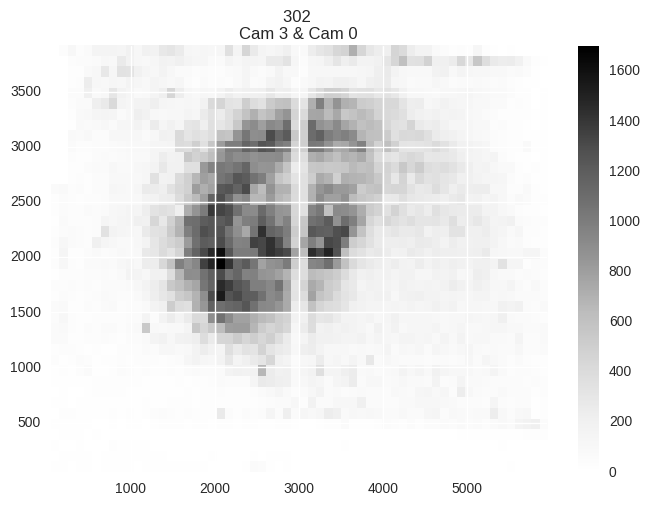

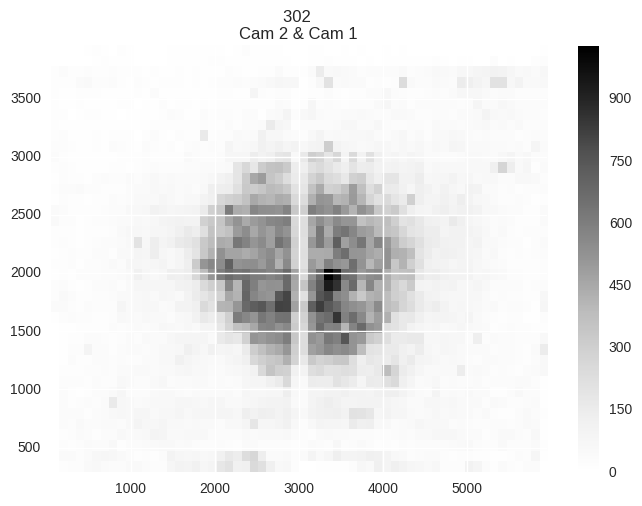

In [512]:
plotForHour("networks-hours/2015-08-21T05:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 930 14315 -- 
+ attr: id (v), weight (e)
[(0, 333), (1, 327), (2, 270)]
[[2050, 2392, 2076, 2078, 2090, 2091, 2092, 2094, 2097, 2111, 2428, 2114, 2117, 2121, 2131, 2138, 2145, 2157, 2161, 2165, 2171, 2177, 2181, 2190, 2201, 2204, 2210, 2224, 2225, 2228, 182, 2233, 2234, 2235, 2238, 2243, 2244, 2245, 2247, 2253, 2255, 3553, 2265, 2266, 2270, 2279, 2287, 2088, 2295, 2296, 2318, 2323, 2325, 2359, 2367, 2375, 2384, 1921, 2403, 2407, 2412, 2413, 2420, 2431, 2434, 2446, 2461, 2467, 2469, 2482, 2488, 2507, 2509, 2513, 2519, 2525, 2530, 2531, 2546, 2552, 2565, 2567, 2569, 2585, 2589, 2598, 2602, 2610, 2615, 2625, 2626, 2630, 2652, 2657, 2660, 2662, 2675, 2685, 644, 2694, 2696, 2500, 2718, 2721, 2723, 2745, 2749, 2757, 2766, 2767, 2768, 2778, 2786, 2811, 2814, 2815, 2834, 2845, 2846, 2847, 2851, 3889, 2874, 2875, 2881, 2882, 2889, 2890, 3895, 2898, 2902, 2904, 2907, 2909, 2910, 2911, 2913, 2926, 2937, 2946, 2962, 2966, 2969, 3004, 3009, 3021, 3027, 3043, 3062, 3063, 3066, 3075, 3077

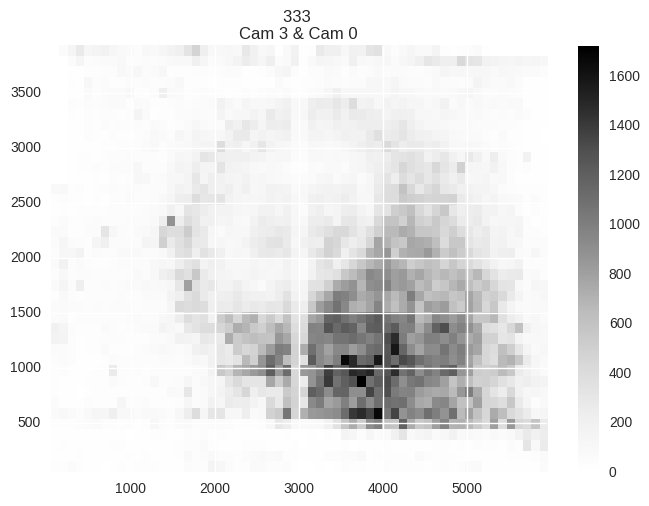

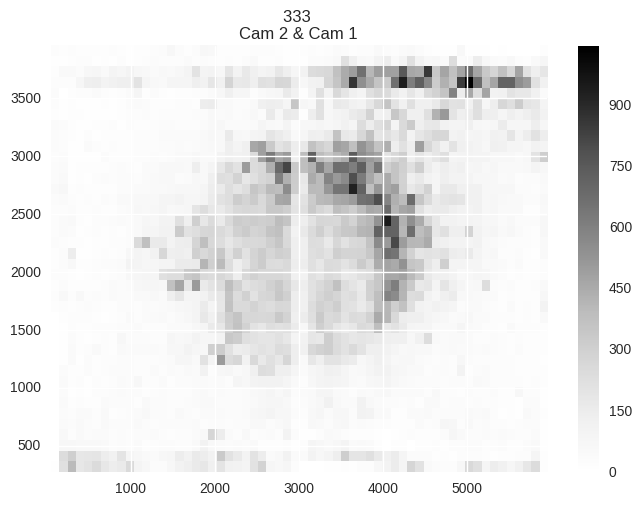

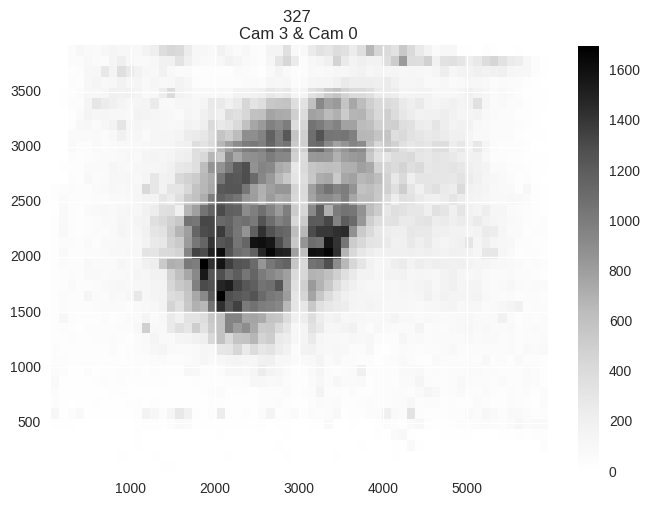

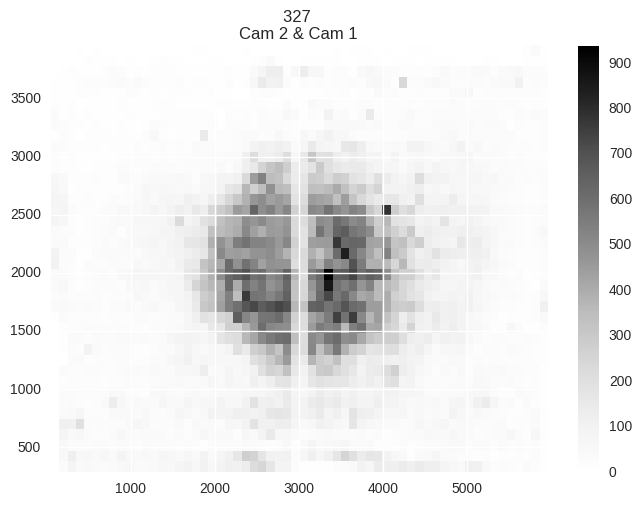

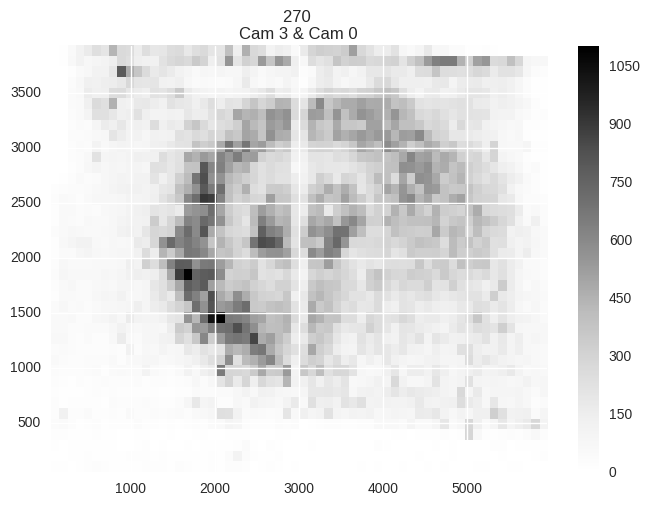

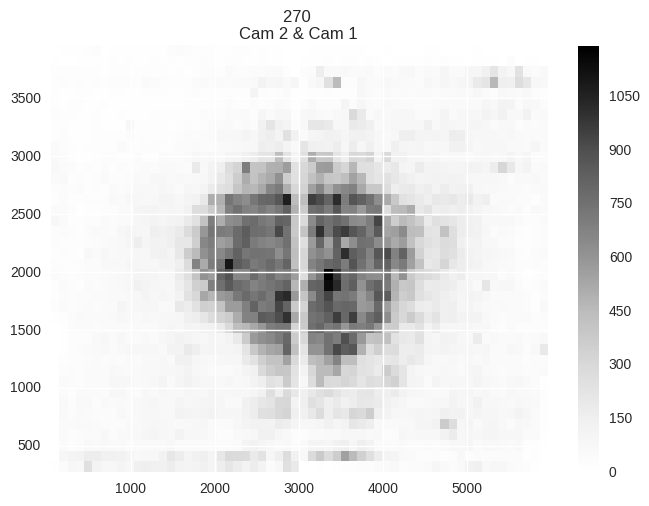

In [513]:
plotForHour("networks-hours/2015-08-21T15:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 770 5197 -- 
+ attr: id (v), weight (e)
[(0, 342), (1, 100), (2, 279), (5, 23)]
[[2050, 2053, 2392, 2069, 3076, 2078, 2091, 2092, 2094, 2106, 2111, 2113, 2114, 2117, 2147, 2161, 2165, 2174, 2178, 2197, 2204, 2211, 2225, 2231, 2234, 2238, 2251, 2253, 2255, 2279, 2287, 2088, 2294, 2322, 2324, 2325, 2329, 2331, 2339, 2345, 2349, 2350, 2357, 2366, 2373, 2382, 2383, 2391, 2397, 2399, 2402, 2403, 2412, 2413, 2415, 2420, 2430, 2434, 2442, 396, 2447, 2462, 2465, 2469, 2507, 2509, 2510, 464, 2513, 2525, 2546, 2569, 2571, 2575, 532, 2583, 2585, 2589, 2595, 2605, 2610, 2623, 2625, 2631, 2639, 2640, 2645, 2651, 2657, 2662, 2670, 2675, 2678, 2679, 2685, 644, 2694, 2696, 2710, 2500, 2720, 2721, 2722, 2723, 678, 2735, 2739, 2743, 2745, 2747, 2767, 2768, 2771, 2778, 2786, 2794, 755, 2806, 2811, 2817, 2833, 2834, 2846, 2524, 2865, 2870, 2874, 2875, 2881, 2882, 2883, 840, 2889, 2890, 3895, 2902, 2903, 2904, 2909, 2910, 2911, 2919, 2924, 2857, 2946, 2947, 2953, 2954, 2957, 2966, 2969, 2976, 2

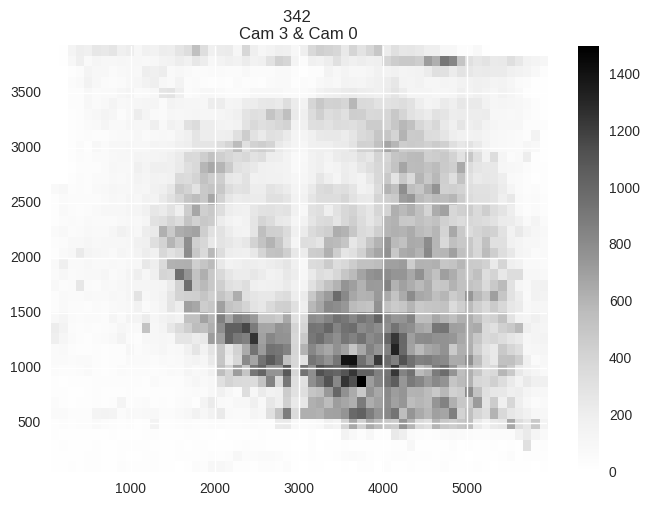

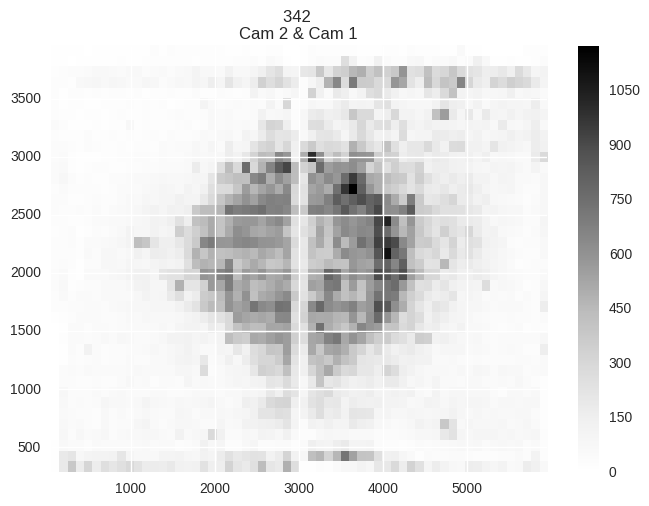

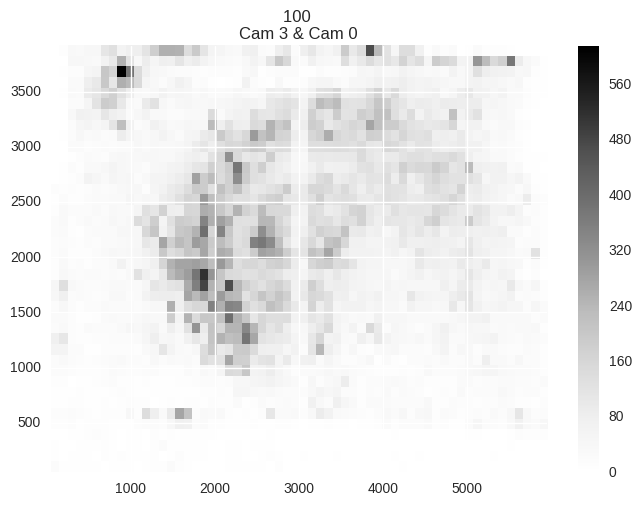

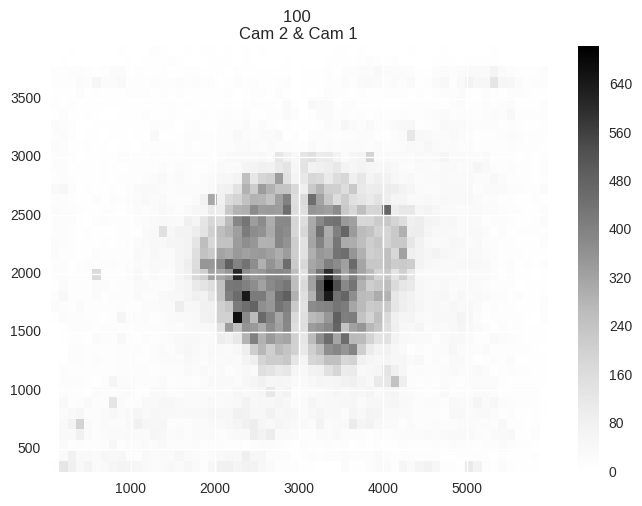

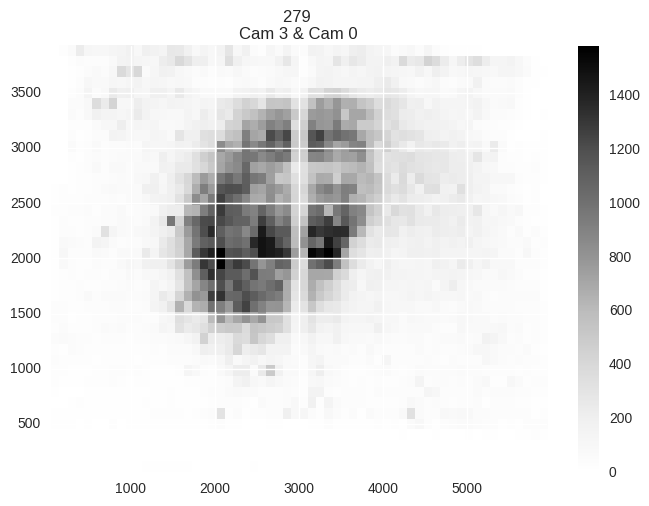

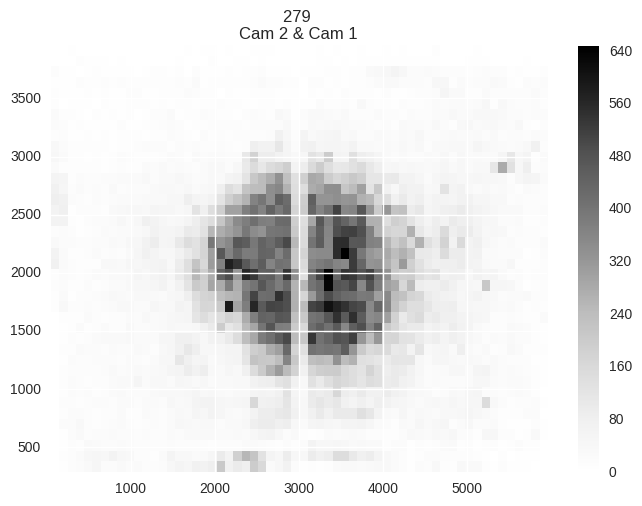

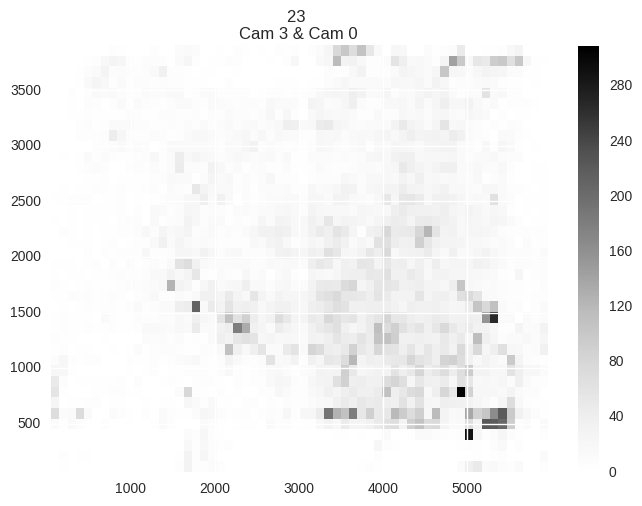

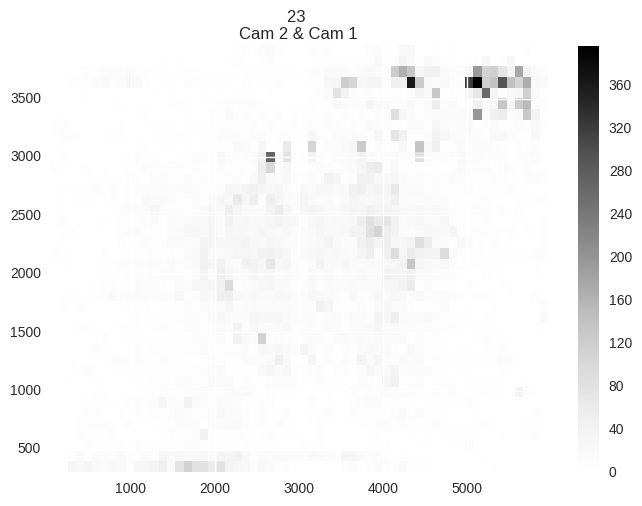

In [514]:
plotForHour("networks-hours/2015-08-21T20:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 783 7229 -- 
+ attr: id (v), weight (e)
[(0, 253), (1, 168), (2, 342)]
[[2048, 2066, 3076, 40, 2090, 2091, 48, 2097, 2102, 2106, 2113, 2123, 2125, 2127, 80, 2157, 116, 2178, 132, 136, 2199, 172, 2235, 2243, 204, 2255, 228, 2279, 2286, 2296, 272, 2335, 2363, 2374, 2383, 2387, 344, 2393, 2399, 2407, 360, 2411, 2412, 368, 2420, 2428, 2435, 2442, 2447, 2451, 2454, 2462, 2465, 420, 2488, 2495, 2524, 2531, 2534, 2547, 504, 2567, 2575, 2577, 530, 2605, 2610, 2619, 2670, 2675, 2687, 660, 2714, 2720, 2722, 2723, 2730, 2738, 2742, 700, 2749, 2753, 2762, 2766, 2768, 2770, 2814, 768, 2817, 4049, 2831, 2833, 2838, 2180, 2850, 2856, 2859, 2861, 2866, 2892, 2897, 2900, 2910, 864, 2913, 2924, 2926, 2930, 888, 2946, 2947, 2953, 2954, 2962, 2966, 2968, 2969, 2973, 2976, 2995, 3004, 3008, 3019, 3029, 3030, 3042, 3047, 2557, 3062, 1028, 3091, 3098, 3107, 3114, 3154, 3171, 3198, 3217, 3221, 3229, 3231, 3232, 3235, 3260, 3267, 3271, 3278, 3279, 3283, 3305, 3308, 3316, 3319, 3320, 3321, 3322, 334

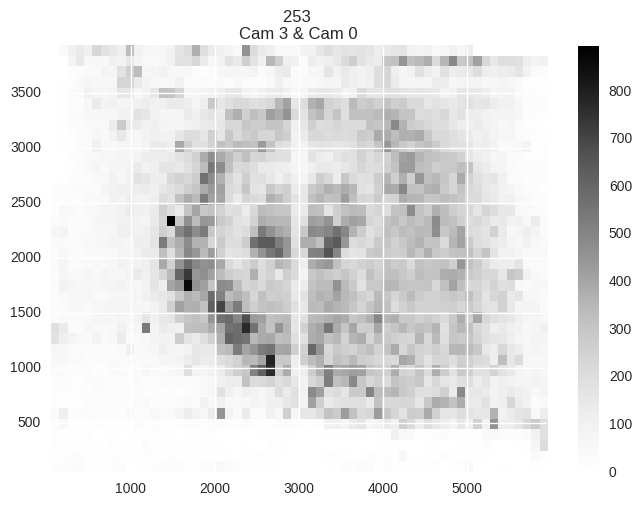

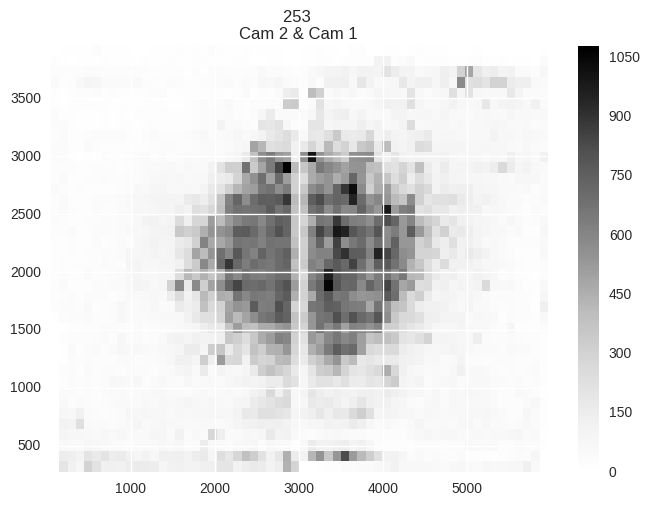

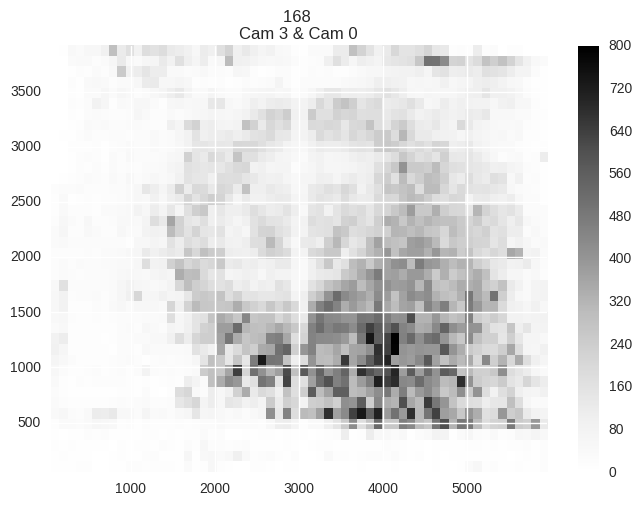

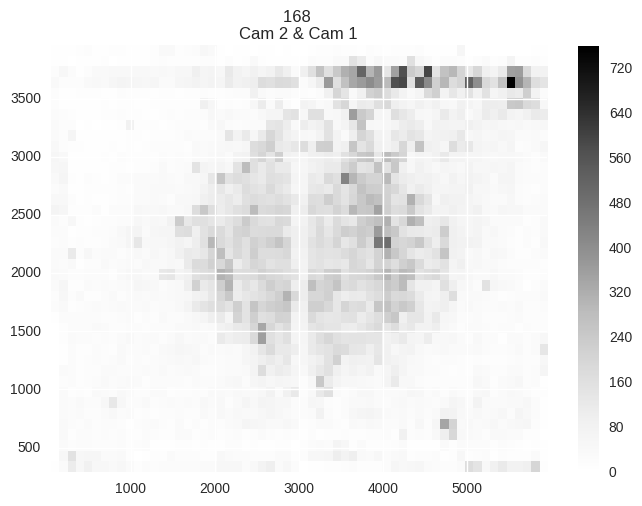

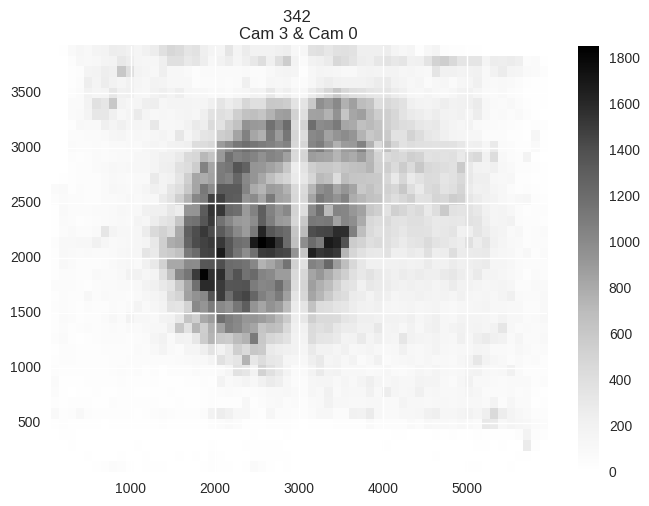

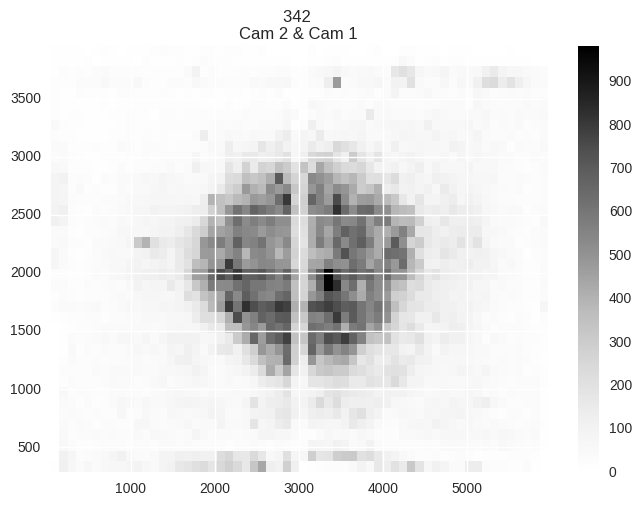

In [515]:
plotForHour("networks-hours/2015-08-21T02:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 769 6569 -- 
+ attr: id (v), weight (e)
[(0, 353), (1, 346), (2, 34)]
[[2048, 2050, 2055, 2058, 2059, 2066, 2076, 2078, 2086, 40, 2092, 2094, 48, 2102, 2106, 2123, 2127, 80, 2134, 96, 2155, 110, 116, 2171, 2174, 2177, 2179, 2181, 136, 144, 2199, 172, 2228, 2234, 2235, 204, 2270, 2768, 2428, 2282, 2287, 2088, 2290, 2292, 2294, 2295, 2322, 2326, 2335, 2345, 2349, 2358, 2365, 2374, 2375, 2382, 2383, 344, 2397, 2403, 2407, 360, 2411, 2412, 368, 2420, 3817, 2426, 380, 2435, 2446, 2451, 2461, 2466, 2467, 420, 2469, 2476, 2488, 2495, 2510, 2514, 2524, 2534, 2540, 2551, 504, 2556, 2565, 2571, 2583, 3846, 2601, 2605, 2610, 2619, 2621, 2631, 2637, 2640, 2641, 2660, 2662, 2670, 2675, 2678, 2679, 2684, 2685, 2696, 660, 2711, 2714, 2721, 2723, 2725, 2735, 2747, 700, 2755, 2770, 2771, 2778, 2782, 736, 2794, 2806, 2811, 768, 2831, 2834, 2838, 2845, 2850, 2865, 2869, 2874, 2875, 2882, 2883, 2892, 2898, 2904, 864, 2919, 2924, 888, 2954, 2955, 2962, 2966, 2968, 2969, 2978, 2981, 2985, 2995, 

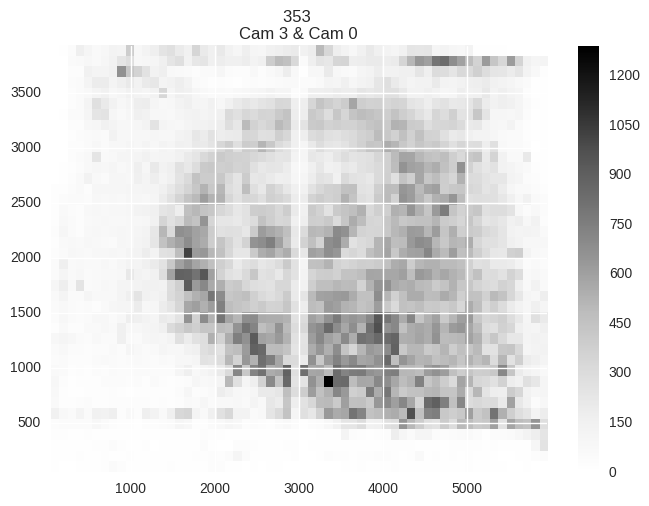

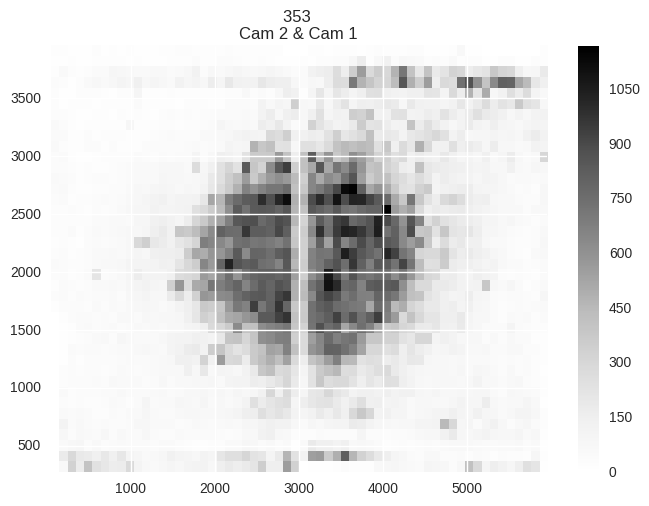

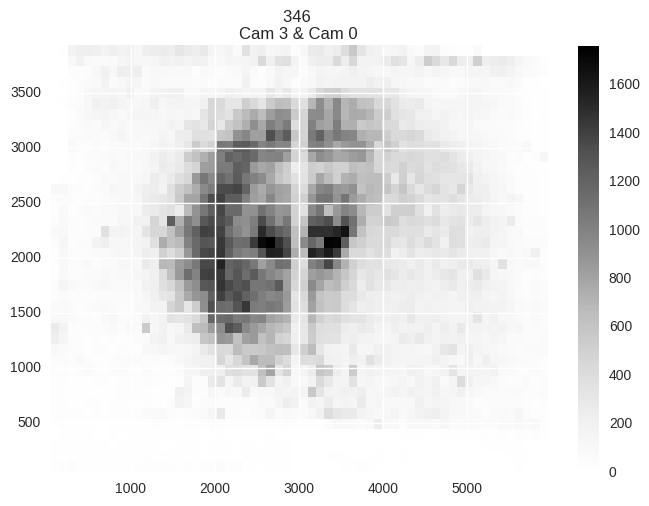

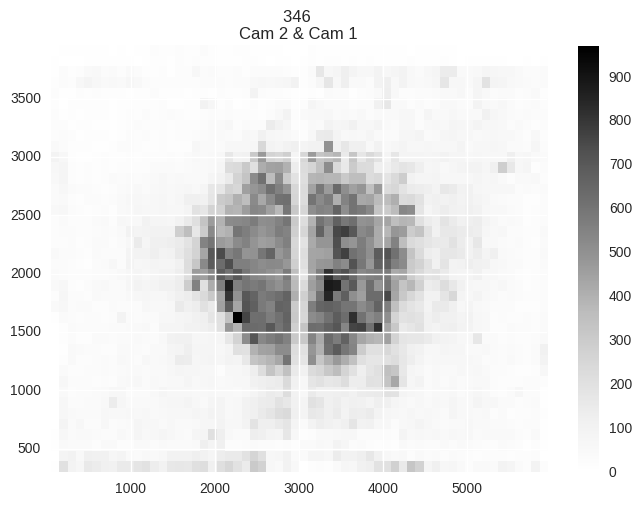

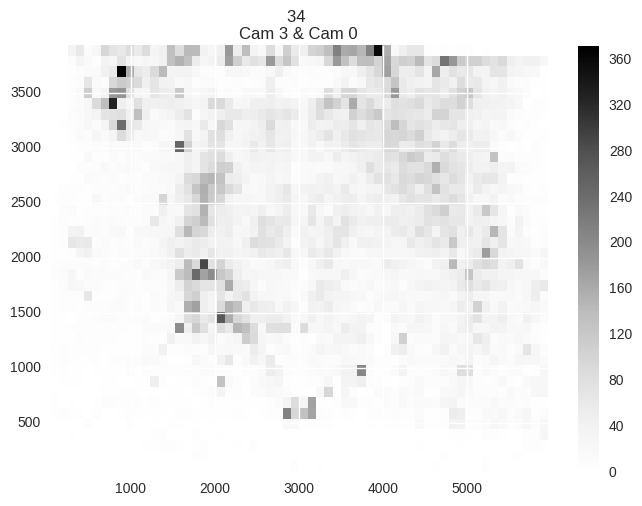

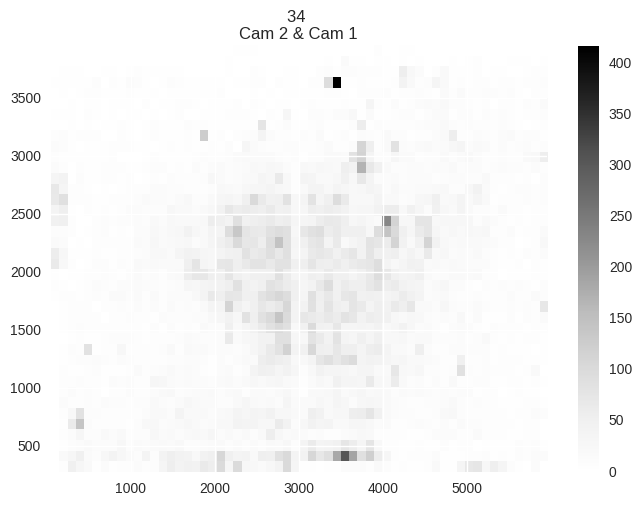

In [516]:
plotForHour("networks-hours/2015-08-21T04:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 854 8048 -- 
+ attr: id (v), weight (e)
[(0, 348), (1, 53), (2, 205), (3, 246)]
[[2048, 2053, 12, 2062, 2069, 3076, 2083, 2086, 2090, 2097, 60, 2113, 68, 72, 96, 2145, 2147, 2153, 120, 144, 2201, 156, 160, 2233, 192, 2243, 2247, 2249, 212, 2265, 720, 228, 232, 2283, 2286, 240, 252, 260, 264, 2318, 272, 2324, 2325, 2326, 2329, 284, 288, 300, 2350, 308, 312, 320, 2374, 332, 2386, 340, 2397, 356, 2411, 2414, 2415, 368, 380, 384, 2435, 2443, 396, 2450, 408, 2461, 2462, 2463, 2466, 424, 2478, 432, 456, 2509, 2510, 464, 476, 2527, 480, 2530, 492, 2547, 500, 2551, 2557, 520, 2569, 2570, 2575, 2579, 2586, 544, 2595, 92, 564, 568, 576, 2640, 2641, 596, 2645, 600, 2651, 2653, 2662, 616, 2670, 624, 2678, 2679, 636, 640, 2710, 2711, 664, 676, 680, 688, 2739, 2749, 2753, 708, 2757, 712, 2770, 732, 2782, 736, 748, 808, 756, 2807, 760, 2814, 2821, 780, 2831, 2838, 2839, 792, 2842, 2843, 2847, 2851, 804, 2853, 2183, 816, 2870, 828, 836, 2887, 840, 2892, 848, 2897, 2900, 2902, 2906, 876, 29

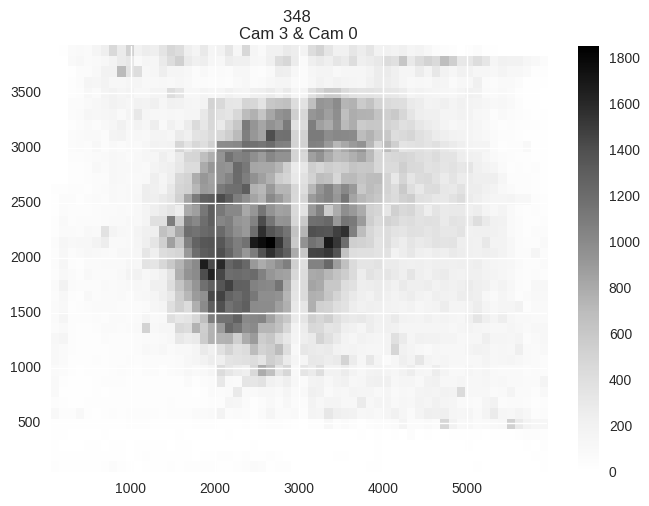

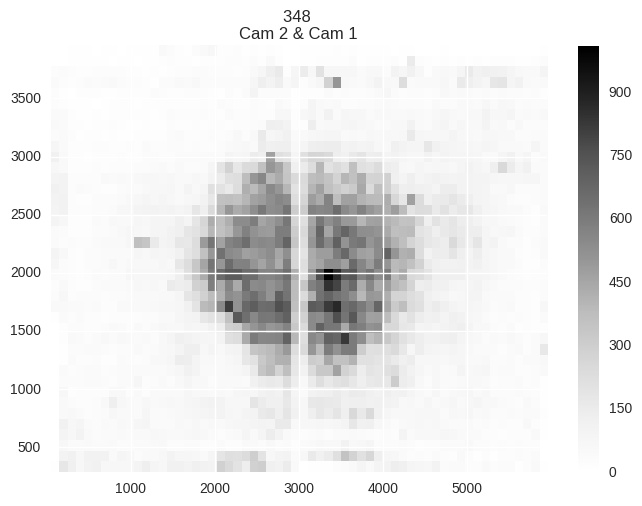

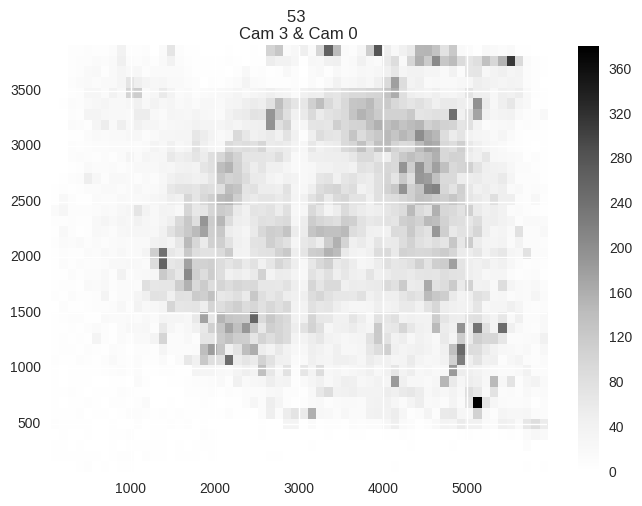

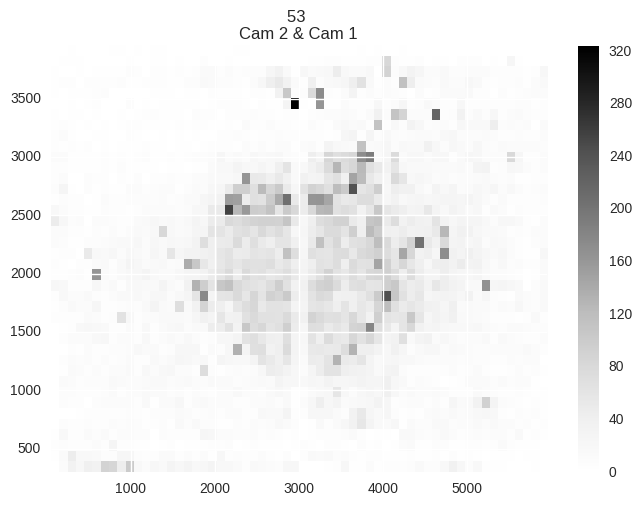

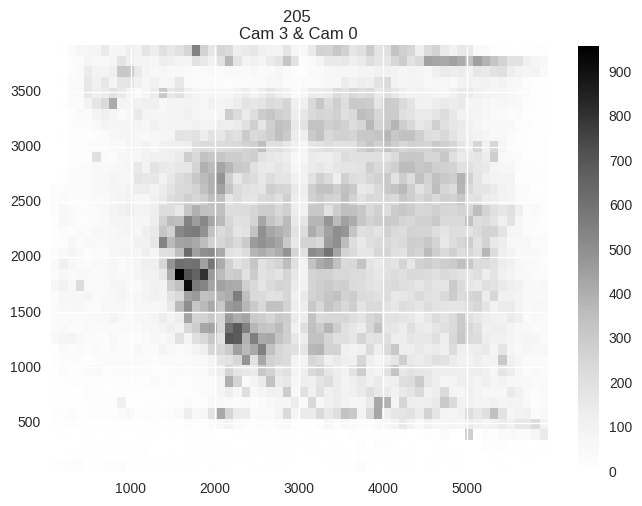

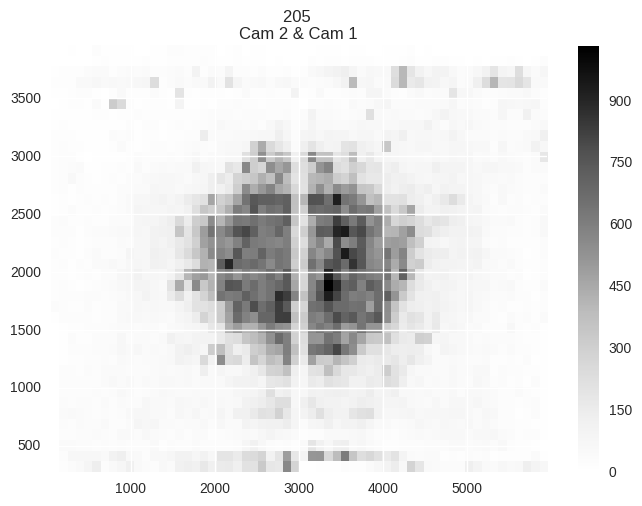

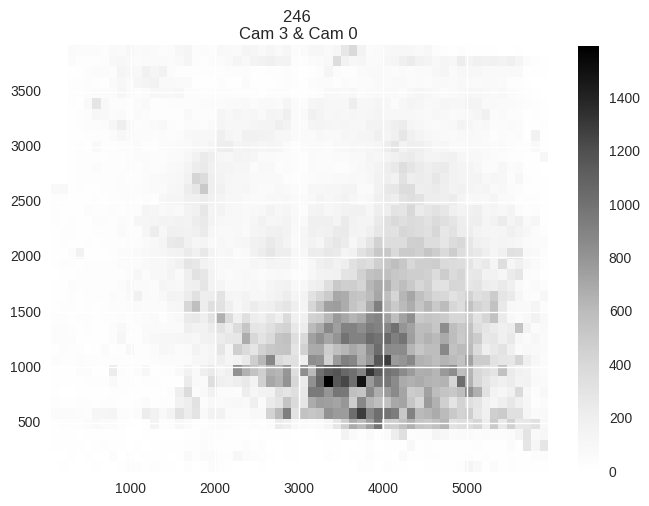

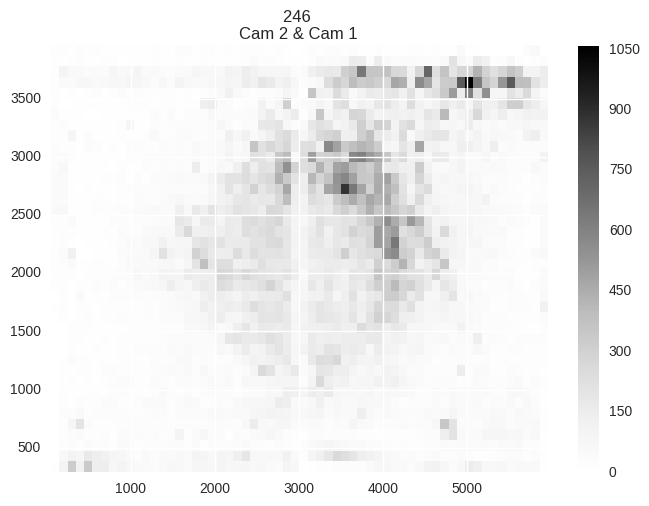

In [517]:
plotForHour("networks-hours/2015-08-21T06:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 931 10249 -- 
+ attr: id (v), weight (e)
[(0, 319), (1, 343), (2, 257)]
[[2048, 2049, 2050, 3076, 2076, 2078, 2083, 2090, 2091, 2092, 2111, 2114, 68, 2117, 2131, 2660, 2145, 2157, 2161, 2165, 2171, 2181, 2190, 2195, 2197, 2204, 2210, 2211, 2214, 2217, 2224, 2233, 2234, 2244, 2247, 2253, 2255, 2265, 2266, 2282, 2088, 2296, 2432, 2350, 2357, 2359, 2367, 2375, 2387, 2392, 2402, 2403, 2407, 2412, 2413, 2428, 2431, 2434, 2437, 2443, 2447, 2450, 2461, 2466, 2467, 2474, 2488, 833, 2507, 2509, 2519, 2522, 2534, 2540, 514, 2565, 2567, 2575, 2582, 2583, 2585, 2589, 2598, 2608, 2623, 2625, 2626, 2630, 2652, 2657, 2675, 2685, 2686, 2694, 2696, 2500, 2714, 3841, 2723, 2730, 2734, 2735, 2504, 2738, 2745, 2747, 2749, 2757, 2766, 2768, 2778, 2684, 2793, 2228, 2817, 2834, 2842, 2845, 2861, 2869, 2874, 2889, 2890, 2898, 2904, 2906, 2911, 2924, 2937, 892, 2946, 2955, 2962, 2966, 2968, 2969, 2978, 3009, 2552, 2557, 3080, 3084, 3086, 3088, 3093, 3096, 3112, 3113, 3114, 3115, 3117, 3124, 3128, 3

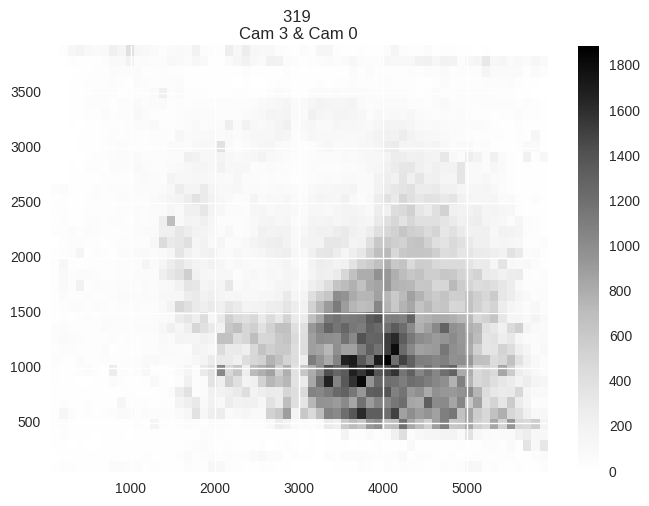

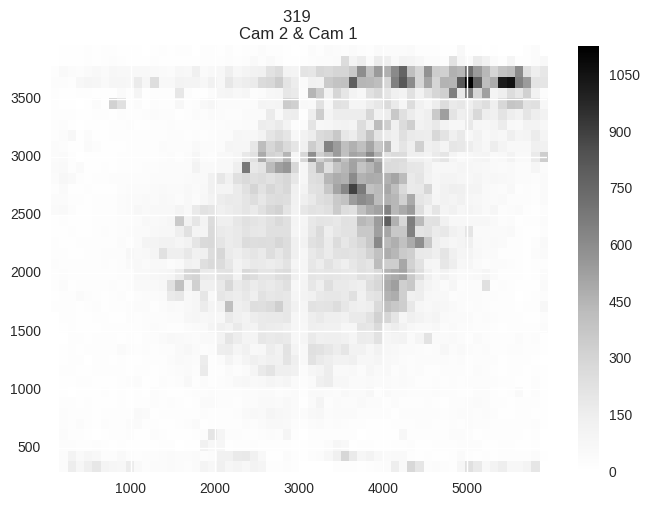

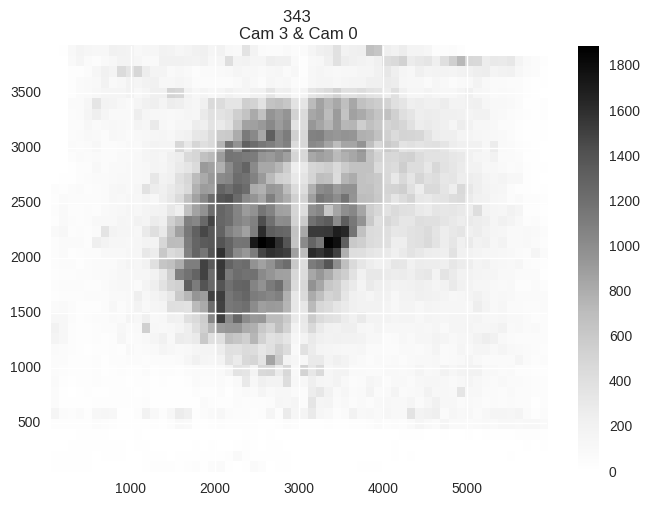

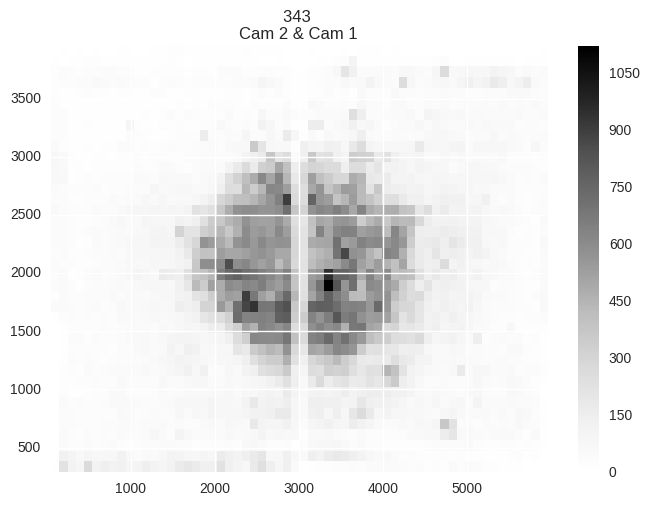

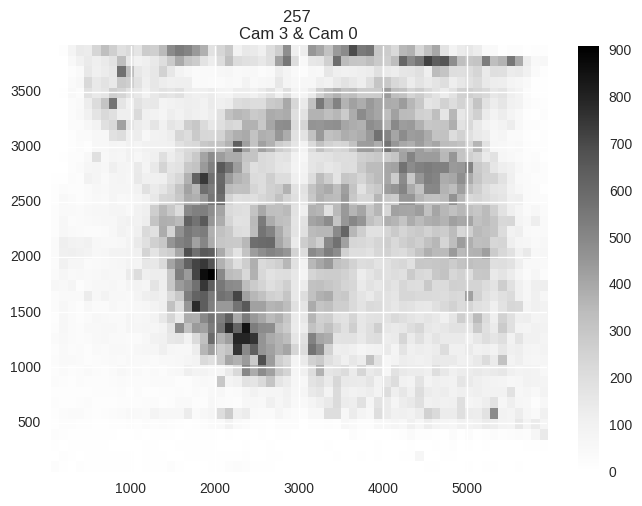

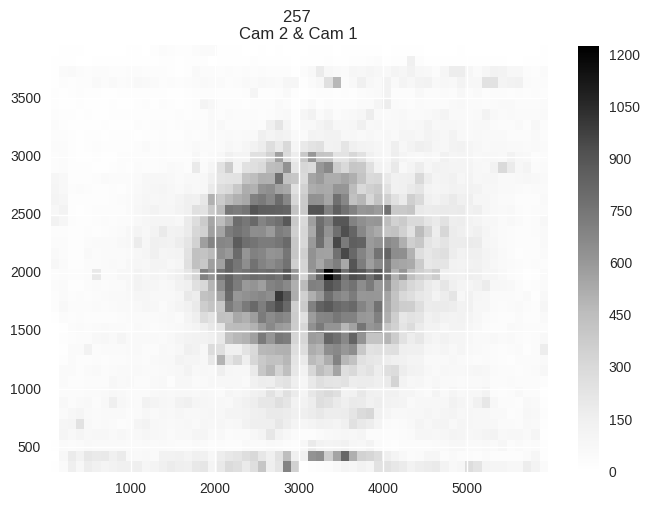

In [518]:
plotForHour("networks-hours/2015-08-21T08:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 982 14090 -- 
+ attr: id (v), weight (e)
[(0, 354), (2, 386), (3, 232)]
[[2050, 2392, 2066, 2076, 2078, 2091, 2092, 2094, 2102, 2111, 2114, 2117, 2125, 2131, 2660, 2157, 2161, 2165, 2171, 2177, 2181, 2195, 2204, 2210, 2211, 2214, 2224, 2225, 2228, 2235, 2238, 2243, 2247, 2251, 2253, 2255, 2266, 2270, 2768, 2279, 2428, 2282, 2287, 2088, 2294, 2295, 2296, 2432, 2318, 2322, 2323, 2325, 2345, 2350, 2357, 2358, 2359, 2366, 2367, 2375, 2402, 2403, 2407, 2411, 2412, 2413, 2431, 2434, 2446, 3689, 2461, 2463, 2465, 2488, 2495, 2540, 2509, 2513, 2514, 2519, 2523, 2524, 2525, 2530, 2546, 2551, 2556, 2557, 2564, 2565, 2567, 2585, 2589, 2594, 2598, 2623, 2625, 2626, 2630, 2637, 2641, 2645, 2652, 2657, 2833, 2675, 2685, 2694, 2696, 656, 2500, 2720, 2721, 2723, 2738, 2745, 2747, 2749, 2755, 2766, 2767, 2778, 2779, 2684, 2786, 2815, 2834, 2845, 2846, 2850, 2851, 2861, 2869, 2870, 2881, 2889, 2898, 2907, 2909, 2910, 2924, 2926, 2930, 2953, 2955, 2958, 2962, 2966, 2969, 2985, 3004, 3009, 302

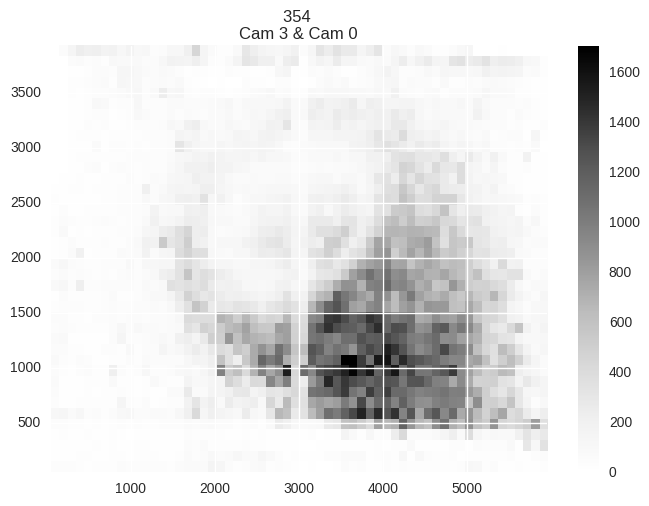

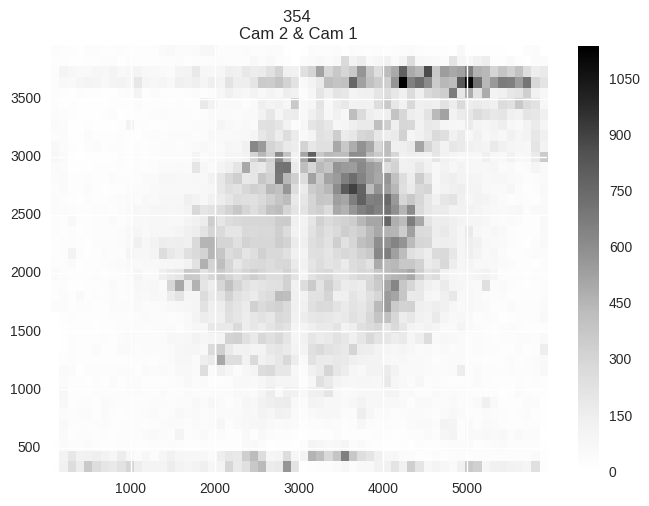

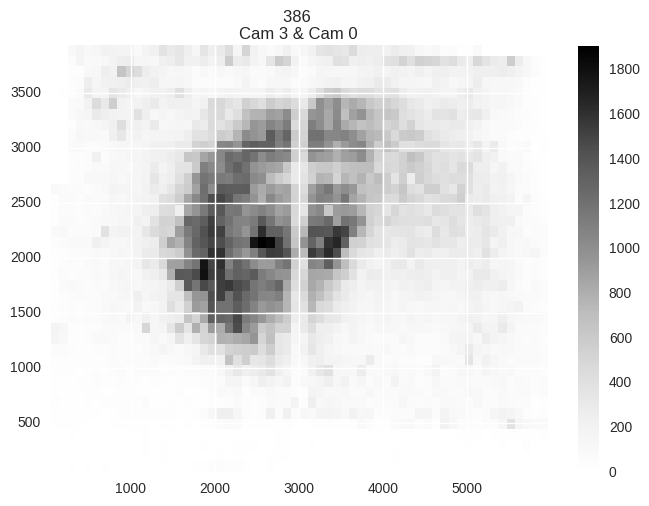

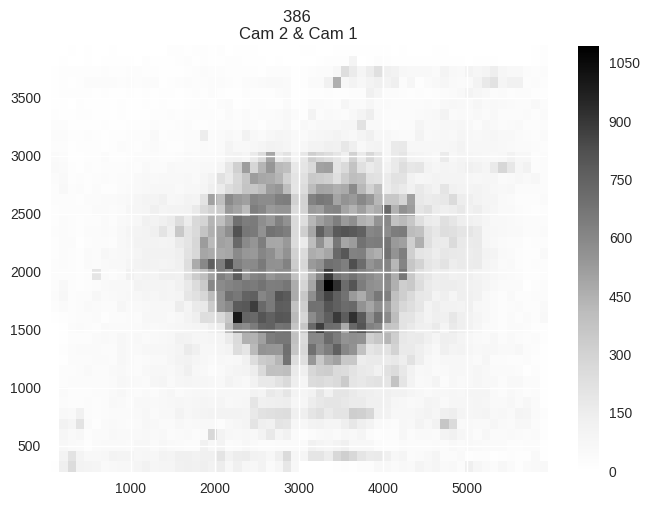

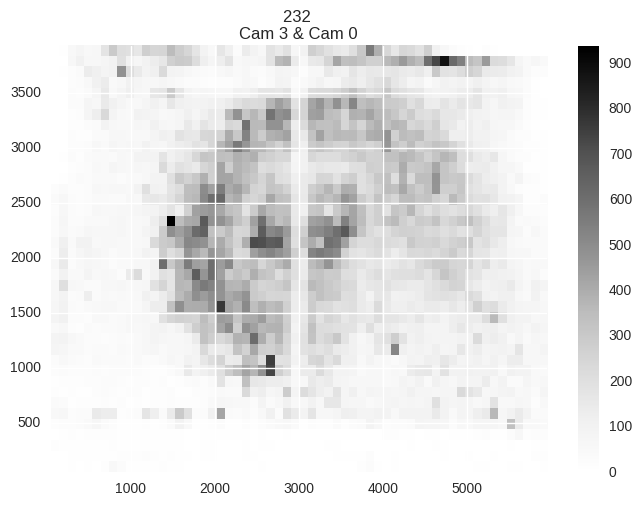

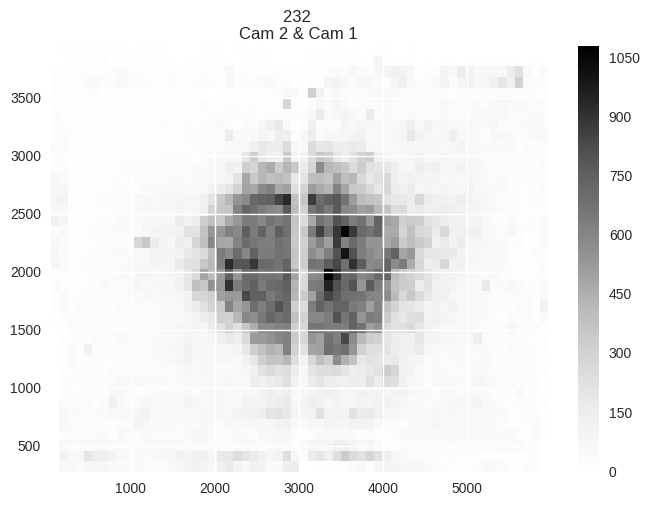

In [519]:
plotForHour("networks-hours/2015-08-21T12:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 964 14266 -- 
+ attr: id (v), weight (e)
[(0, 318), (1, 359), (2, 277)]
[[2050, 2660, 3076, 2076, 2091, 2092, 2105, 2111, 2114, 2117, 2121, 2131, 2138, 2145, 2147, 2150, 2157, 110, 2161, 2165, 2171, 3093, 2177, 2181, 2195, 2199, 2201, 2204, 2210, 2211, 2214, 2225, 2234, 2235, 2238, 2244, 2253, 2255, 3553, 2266, 2428, 2282, 2287, 2088, 2296, 2318, 2322, 2323, 2329, 2357, 2359, 2363, 2366, 2367, 2374, 2375, 2379, 2384, 343, 2399, 2402, 2403, 2407, 2412, 2431, 2437, 2442, 2446, 2450, 2454, 2461, 2465, 2466, 2476, 2482, 2488, 2495, 2507, 2509, 2513, 2525, 2851, 2530, 2531, 2552, 2565, 2567, 2569, 524, 2574, 2575, 2585, 2589, 2598, 2602, 2623, 2625, 2626, 2630, 2641, 2645, 2657, 2670, 2675, 2685, 2721, 2723, 2738, 2745, 2757, 2768, 2778, 2779, 2684, 2786, 2797, 2856, 2815, 784, 2834, 2845, 2847, 2392, 2853, 2865, 2870, 2875, 2882, 2889, 2898, 2900, 2907, 2909, 2911, 2932, 2937, 2946, 2953, 2962, 2966, 2978, 2986, 3009, 3063, 3065, 3075, 3084, 3088, 2904, 2564, 3115, 3117, 3128, 

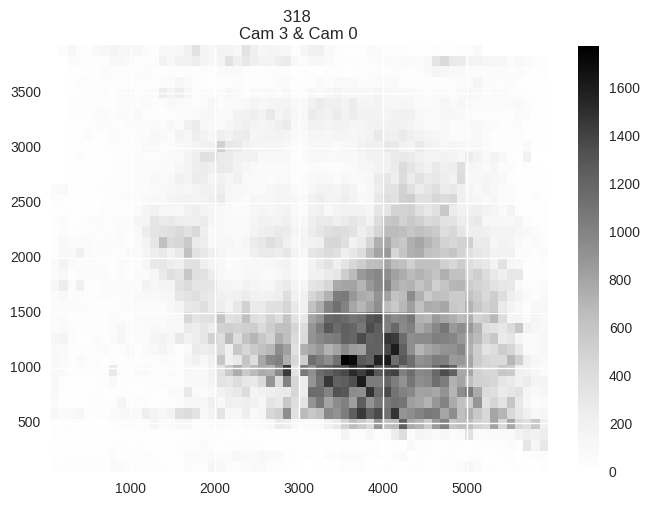

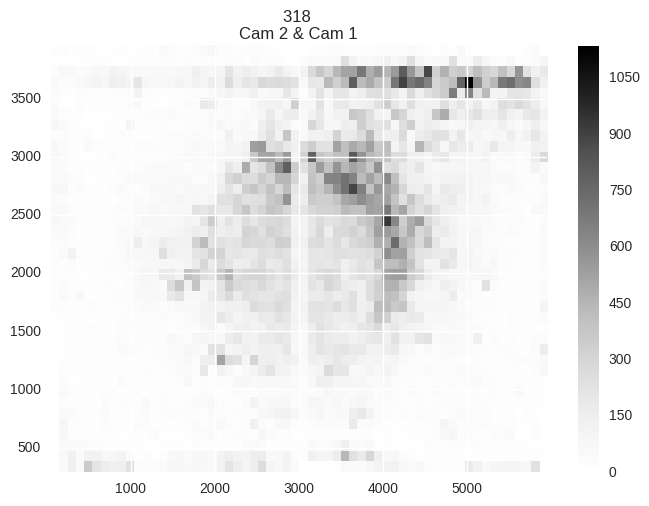

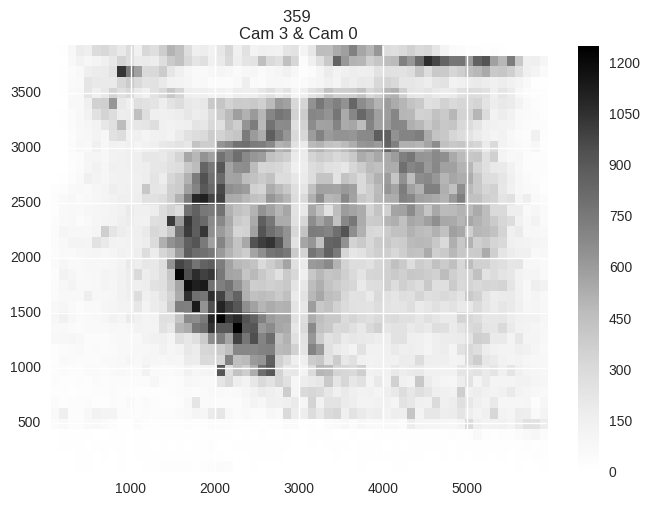

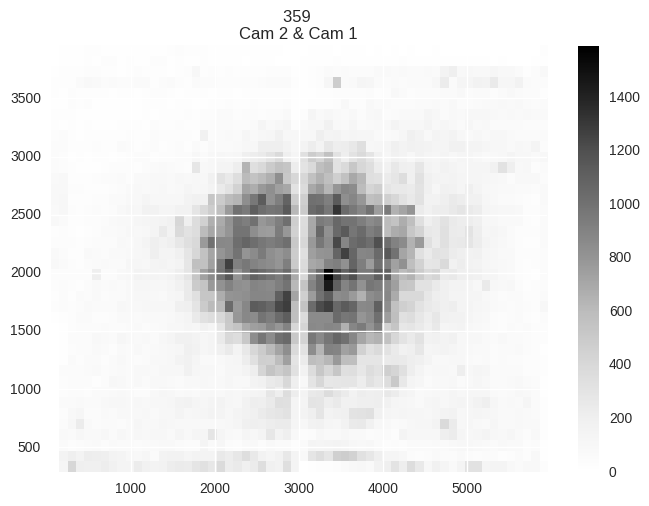

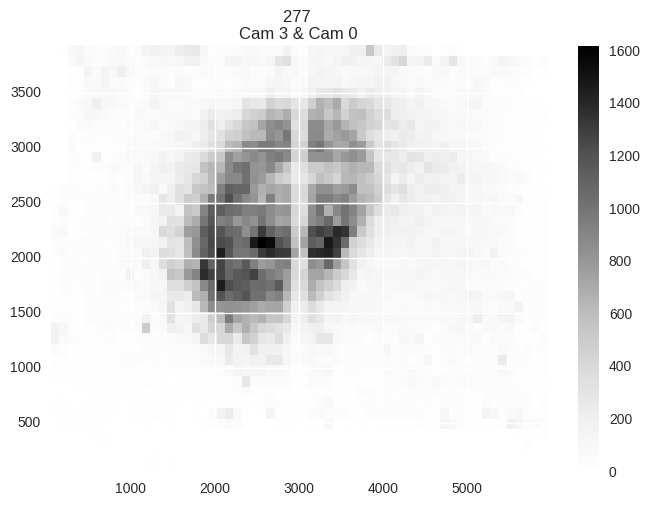

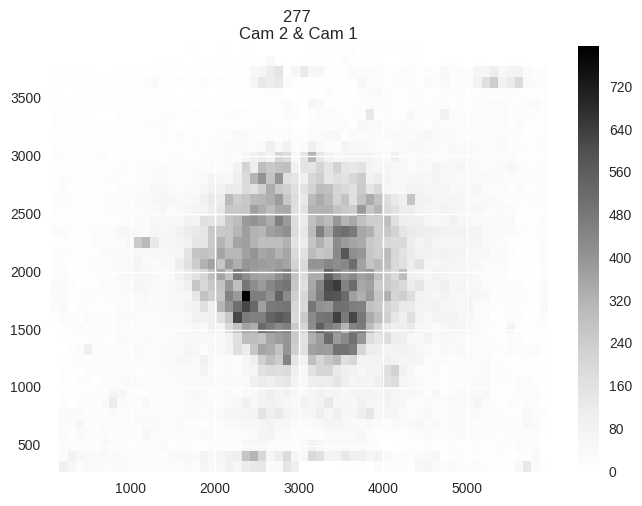

In [520]:
plotForHour("networks-hours/2015-08-21T14:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 889 9194 -- 
+ attr: id (v), weight (e)
[(0, 338), (1, 193), (2, 297), (3, 34)]
[[2050, 2392, 3076, 2076, 2078, 1372, 2090, 2091, 2092, 2111, 2114, 2117, 2131, 2138, 2145, 2157, 2161, 2165, 2171, 2177, 2181, 2204, 2210, 2214, 2224, 2225, 2234, 2235, 2238, 620, 2244, 2245, 2247, 2253, 2255, 3553, 2265, 2266, 2270, 2279, 2282, 2088, 2294, 2295, 2296, 2432, 2320, 2345, 2350, 2359, 2367, 2375, 2383, 2403, 2407, 2412, 2413, 2420, 3817, 2428, 2431, 2434, 2437, 2443, 2446, 2461, 2463, 2466, 2488, 2507, 2509, 2513, 2519, 2546, 2547, 2552, 2557, 2565, 2567, 2585, 2589, 548, 2602, 2608, 2610, 2623, 2625, 2626, 2639, 2645, 2652, 2657, 2662, 2668, 2675, 2682, 2685, 2694, 2696, 664, 2718, 2721, 2723, 2738, 2745, 2753, 2757, 2766, 2768, 2770, 2786, 3196, 2856, 2811, 764, 2815, 2834, 2845, 2847, 2850, 2851, 2853, 810, 2861, 2881, 834, 2889, 2890, 2898, 2907, 2909, 2910, 2911, 2926, 2937, 2943, 2946, 2953, 2962, 2968, 2978, 2981, 2986, 2548, 3009, 3021, 3042, 3062, 3063, 3075, 3077, 3080, 

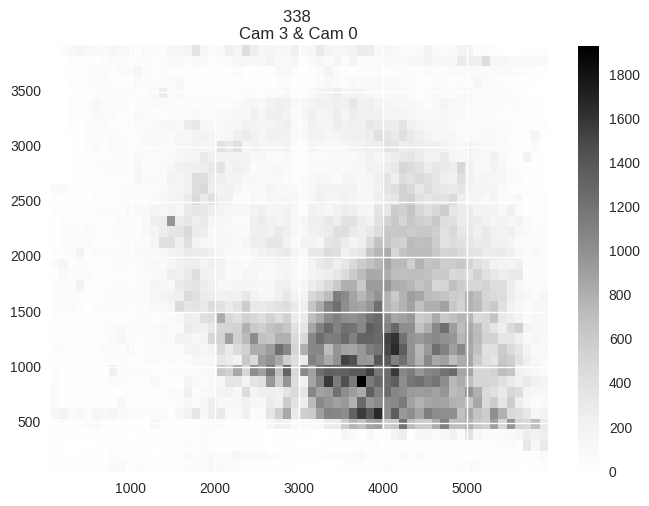

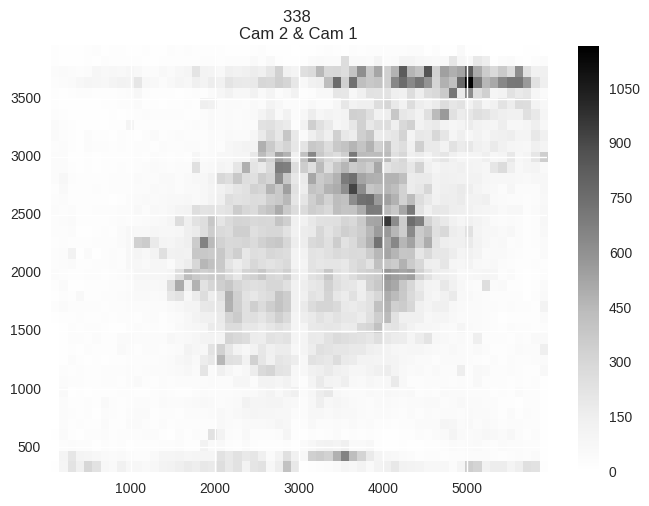

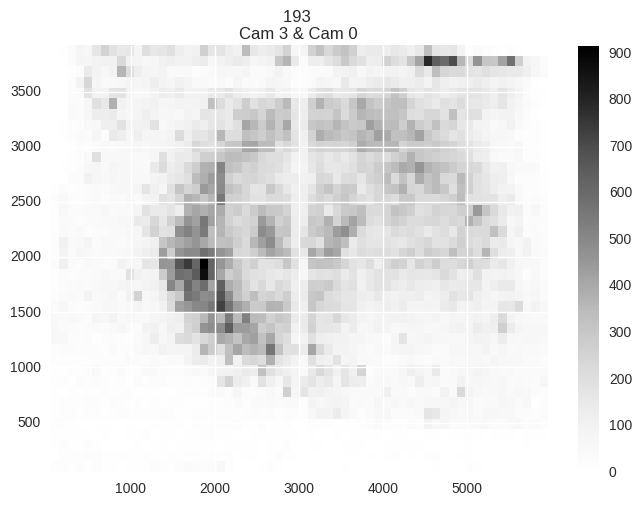

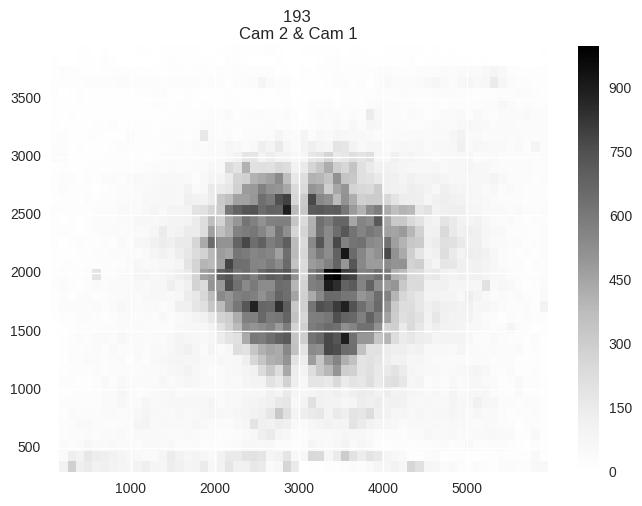

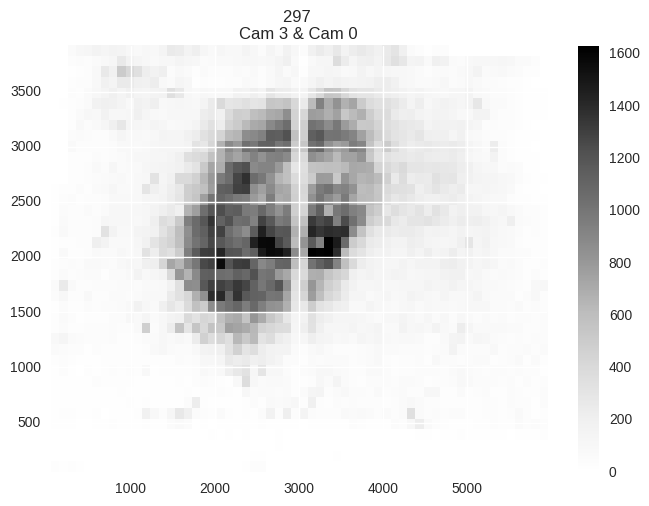

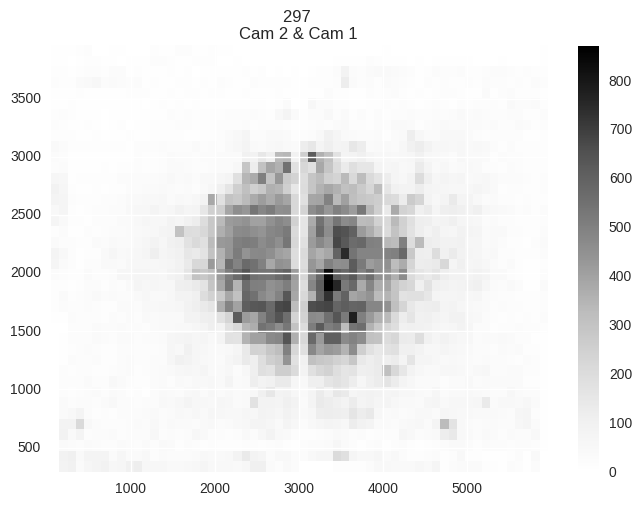

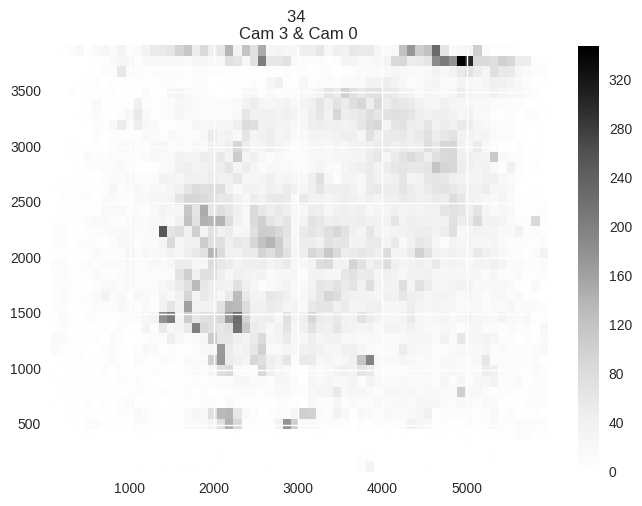

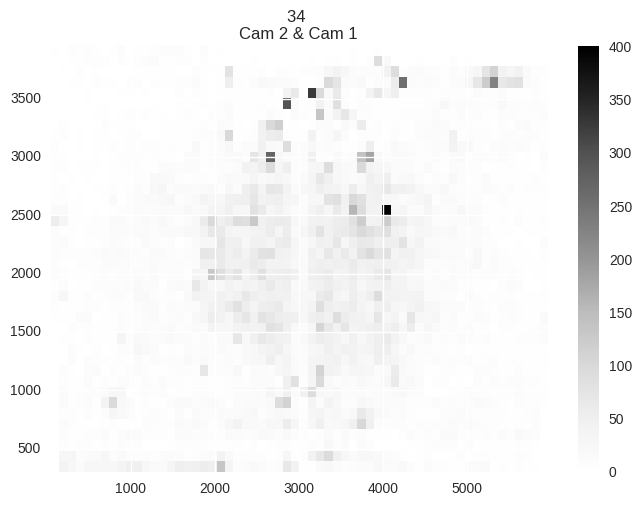

In [521]:
plotForHour("networks-hours/2015-08-21T16:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 774 5527 -- 
+ attr: id (v), weight (e)
[(0, 339), (1, 368), (2, 22), (5, 33)]
[[2050, 2055, 2062, 2069, 2086, 2090, 2094, 2097, 2106, 2111, 2113, 72, 2121, 2125, 2134, 2147, 2155, 2157, 2163, 2174, 2178, 132, 2181, 136, 2190, 2204, 2210, 2224, 2225, 180, 2231, 2233, 2234, 2240, 2243, 2245, 2247, 2251, 2253, 216, 2265, 228, 2279, 2283, 2287, 240, 2088, 2292, 2294, 272, 2324, 2326, 2329, 2331, 2335, 2345, 2349, 2358, 2365, 2366, 2374, 2383, 2391, 2397, 2399, 2413, 2414, 2415, 368, 2420, 2426, 380, 2430, 2435, 2443, 396, 2447, 3689, 2454, 408, 2462, 2466, 2478, 2486, 2499, 2500, 2510, 464, 2523, 2525, 2530, 2531, 2552, 2557, 520, 2570, 2575, 2576, 532, 2583, 2585, 2586, 2601, 2602, 2610, 2615, 2621, 2623, 2631, 2637, 2639, 2640, 2651, 608, 2660, 2670, 628, 632, 2682, 660, 2720, 2722, 676, 2739, 2747, 704, 2753, 2755, 2762, 2766, 2770, 2778, 2797, 2228, 2806, 2815, 768, 2817, 772, 2821, 780, 2833, 2842, 796, 2847, 2850, 2857, 2865, 2874, 2875, 2881, 2883, 840, 2889, 844, 2903,

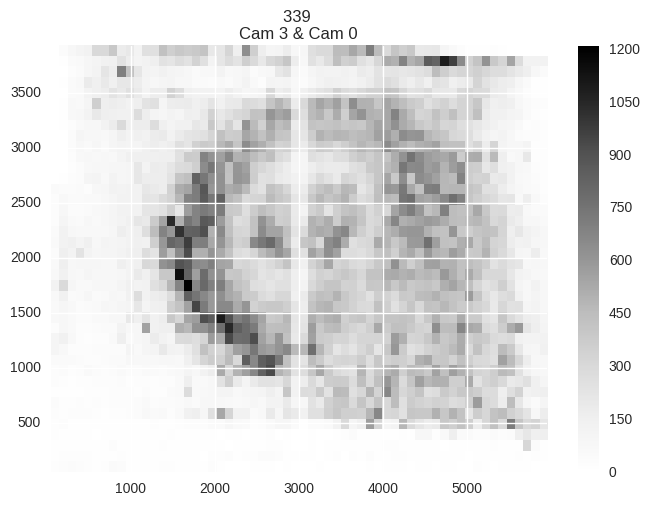

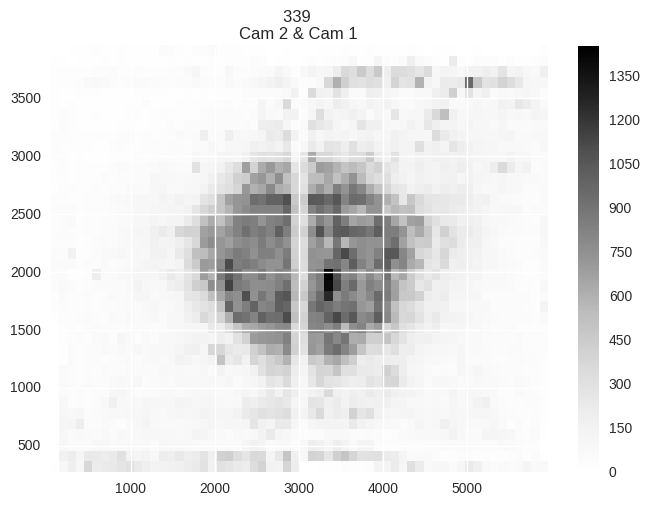

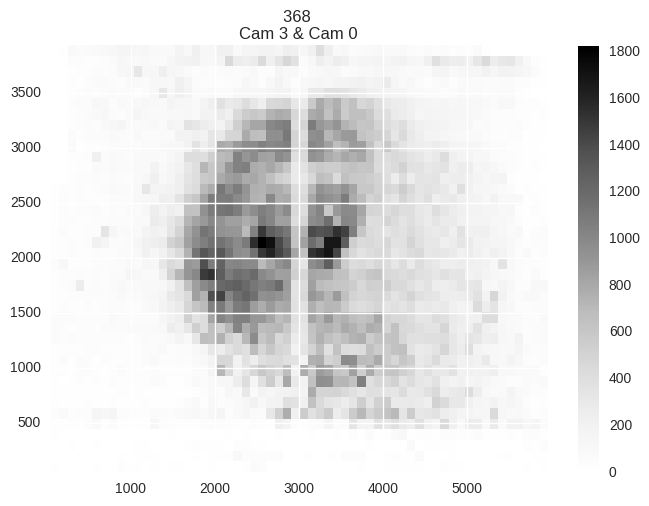

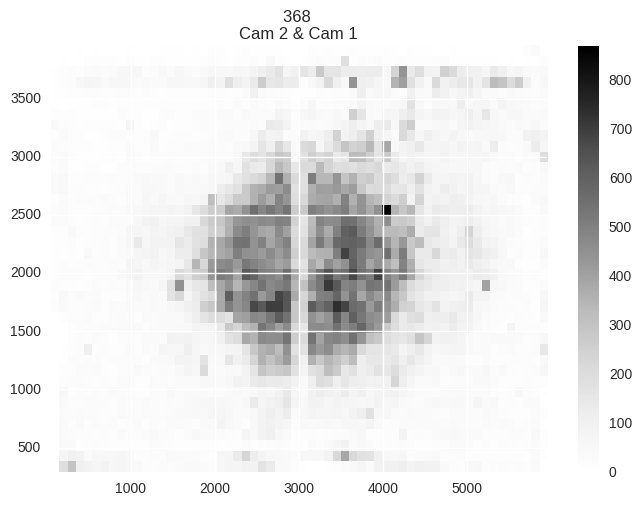

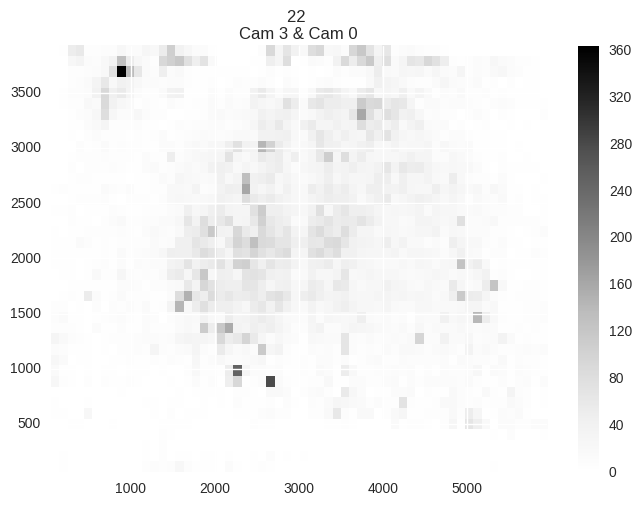

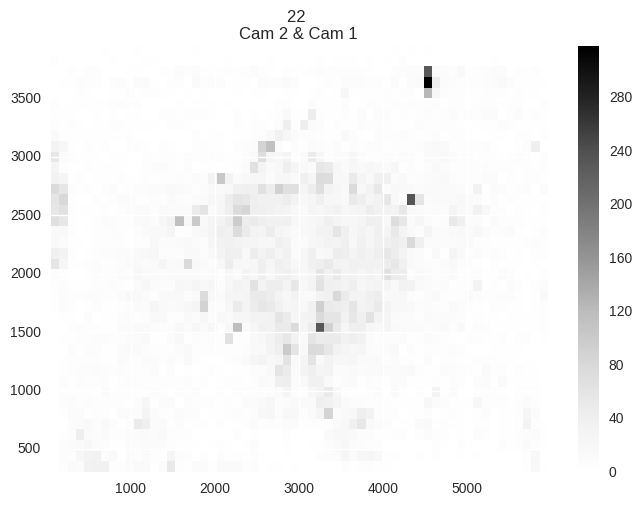

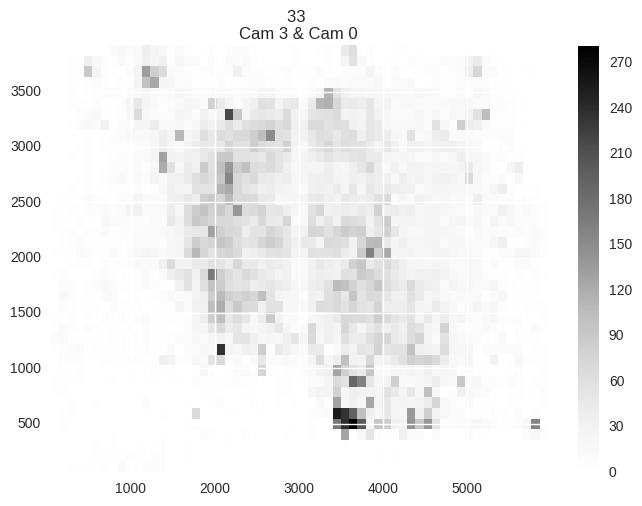

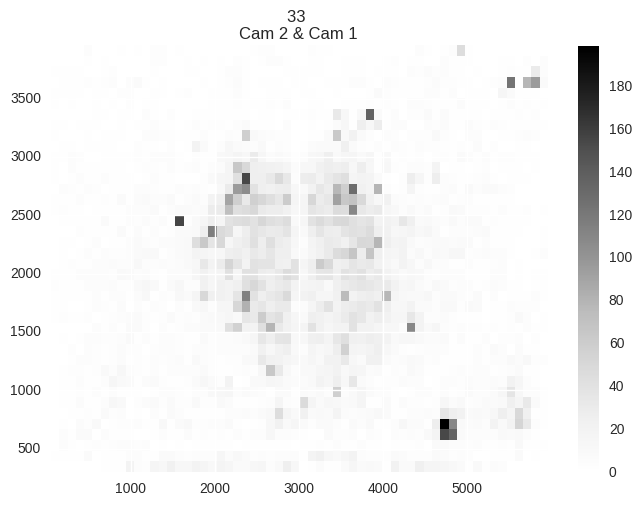

In [522]:
plotForHour("networks-hours/2015-08-21T18:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 793 6289 -- 
+ attr: id (v), weight (e)
[(0, 324), (1, 263), (2, 157)]
[[2050, 2055, 2057, 2058, 2069, 3076, 2078, 2090, 2094, 2097, 2106, 2107, 2111, 2114, 2123, 2125, 2131, 2134, 2153, 2155, 2157, 110, 2165, 2174, 2178, 2179, 2190, 2197, 2211, 2225, 2243, 2251, 2279, 2283, 2287, 2088, 2294, 2296, 2329, 2335, 2383, 2384, 2391, 2392, 2397, 2399, 2403, 2407, 2412, 2413, 373, 3817, 2426, 2428, 1581, 2442, 2454, 2461, 2462, 2465, 2467, 2469, 2478, 2488, 456, 2507, 2523, 2546, 2551, 2557, 2567, 2583, 2585, 2589, 3847, 2605, 2610, 572, 2621, 2623, 2625, 2626, 2631, 2639, 2641, 2645, 2657, 2662, 2678, 2679, 2682, 2684, 2694, 2710, 2500, 2718, 2722, 2723, 2725, 2738, 2742, 2743, 2745, 2747, 2768, 728, 2782, 736, 2794, 2228, 2814, 2821, 2841, 2842, 2845, 2846, 2847, 2850, 2861, 2866, 2881, 844, 2897, 856, 2907, 2909, 2919, 2926, 2930, 2937, 2943, 2946, 2951, 2954, 916, 2966, 2973, 932, 2985, 2986, 2995, 2548, 3305, 3029, 3030, 3033, 3043, 3055, 1008, 3063, 3066, 3068, 3080, 2904, 3

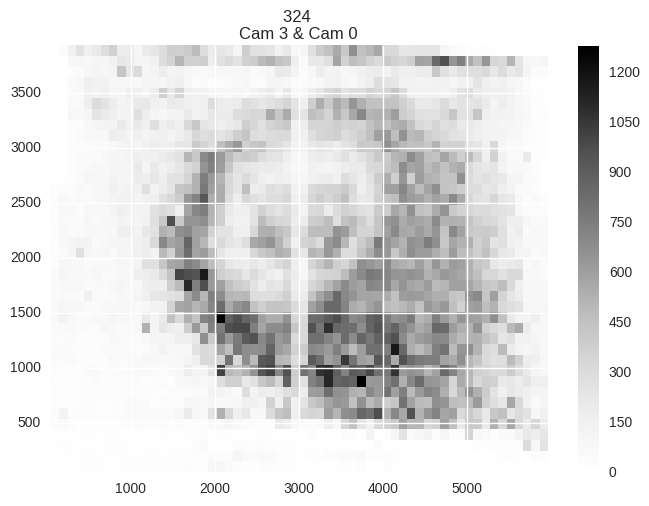

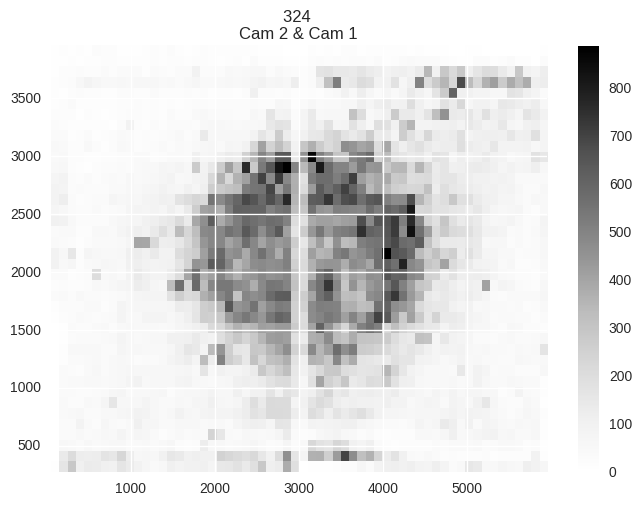

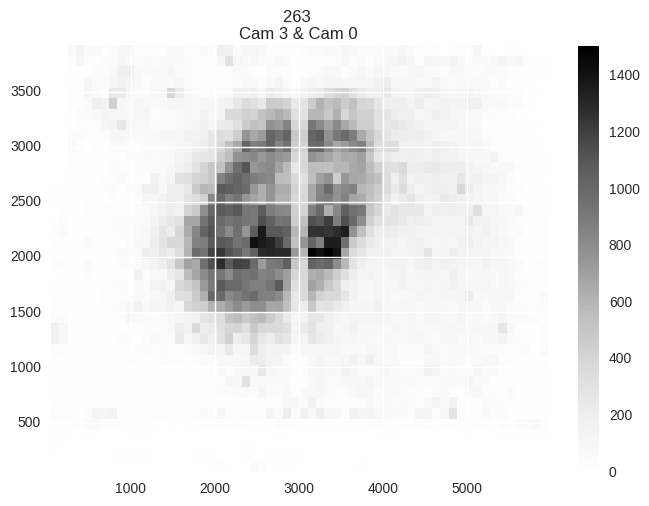

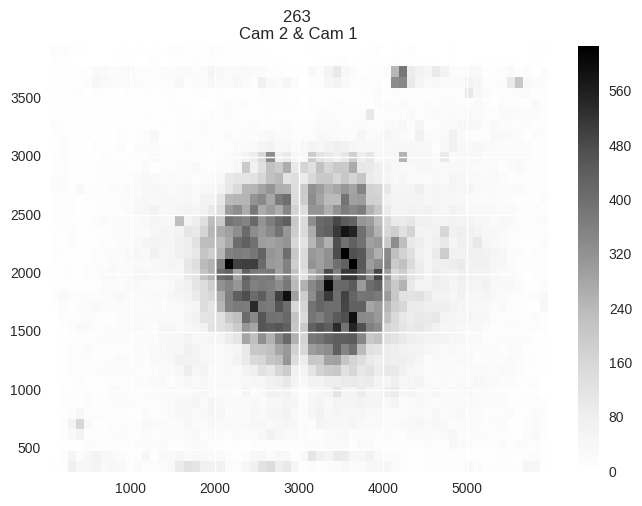

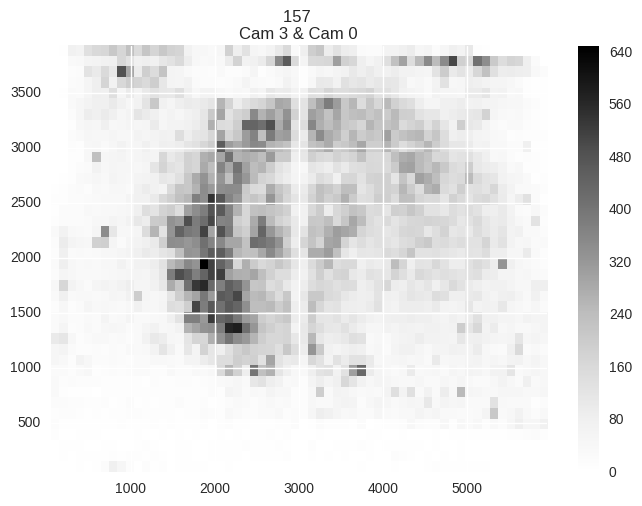

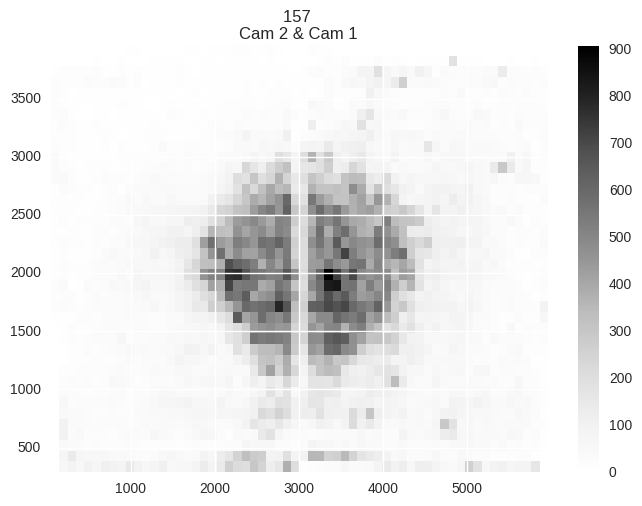

In [523]:
plotForHour("networks-hours/2015-08-21T22:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

# Wie sieht so generell die Verteilung auf der Wabe aus für den ganzen Tag?

In [563]:
def getDFSample(n, conn):
    sql1 = '''
    SELECT count(*)
    FROM DETECTIONS d
    '''
    c = pd.read_sql(sql1, conn)
    c = c["count(*)"].ix[0]

    arr = np.random.randint(0,c, n)
    
    df_list = []
    
    for elem in arr:
        
        sql2 = '''
        SELECT d.XPOS, d.YPOS, d.ID, fc.CAM_ID
        FROM DETECTIONS d
        INNER JOIN FRAME f
        ON d.FRAME_ID=f.FRAME_ID
        INNER JOIN FRAME_CONTAINER fc
        ON f.FC_ID=fc.FC_ID
        LIMIT 1 OFFSET {};
        '''.format(elem)
    
        s = pd.read_sql(sql2, conn)
        df_list.append(s)
    
    

    return pd.concat(df_list)

In [ ]:
getDFSample(100,conn)

In [562]:
np.random.randint(0,10, 20)

array([9, 8, 9, 4, 0, 8, 8, 5, 3, 8, 8, 2, 8, 6, 2, 9, 8, 4, 3, 8])

# Plot Only Data for that hour

In [72]:
def getDFwithIDSts(ids, begin, end, conn):
    ids_str = ', '.join([str(x) for x in ids])
    sql = '''
        SELECT d.XPOS, d.YPOS, d.ID, fc.CAM_ID
        FROM DETECTIONS d
        INNER JOIN FRAME f
        ON d.FRAME_ID=f.FRAME_ID
        INNER JOIN FRAME_CONTAINER fc
        ON f.FC_ID=fc.FC_ID
        WHERE d.ID IN ({}) AND
        f.TIMESTAMP >= {} AND
        f.TIMESTAMP <= {};
    '''.format(ids_str, begin,end)
    return pd.read_sql(sql, conn)

In [38]:
def plotID1h1h(path, limit):
    g = ig.Graph.Read_GraphML(path)
    print(g.summary())
    c = getCommunitiesFastGreedy(g,limit)
    print([len(cc) for cc in c])
    for i in list(range(len(c))):
        plotCommunityHeatmapFrac1h1h(c, i, conn, path)

In [73]:
def plotCommunityHeatmapFrac1h1h(ids, index, conn, path):
    start_str = path.split("_")[0].split("/")[-1]
    start_dt = datetime.datetime.strptime(start_str, "%Y-%m-%dT%H:%M:%SZ").replace(tzinfo=pytz.UTC)
    start_ts = start_dt.timestamp()
    end_dt = start_dt + 5*datetime.timedelta(minutes=60)
    end_ts = end_dt.timestamp()
    
    
    infomap = getDFwithIDSts(ids[index], start_ts, end_ts, conn)
    print("plotCommunityHeatmapFrac1h1h after getDF..:", index)
    
    plotHeatmapXYFrac(str(len(ids[index])), infomap, 3, 0, path, 0.2)
    plt.show()
    plotHeatmapXYFrac(str(len(ids[index])), infomap, 2, 1, path, 0.2)
    plt.show()

In [26]:
start = "2015-08-21T00:00:00Z"
start_dt = datetime.datetime.strptime(start, "%Y-%m-%dT%H:%M:%SZ").replace(tzinfo=pytz.UTC)
start_ts = start_dt.timestamp()

In [30]:
end_dt = start_dt + 5*datetime.timedelta(minutes=60)
end_ts = end_dt.timestamp()

In [31]:
retval = getDFwithIDSts([1], start_ts, end_ts, conn)

IGRAPH U-W- 772 5691 -- 
+ attr: id (v), weight (e)
[(1, 143), (2, 230), (3, 358)]
[143, 230, 358]
plotCommunityHeatmapFrac1h1h after getDF..: 0


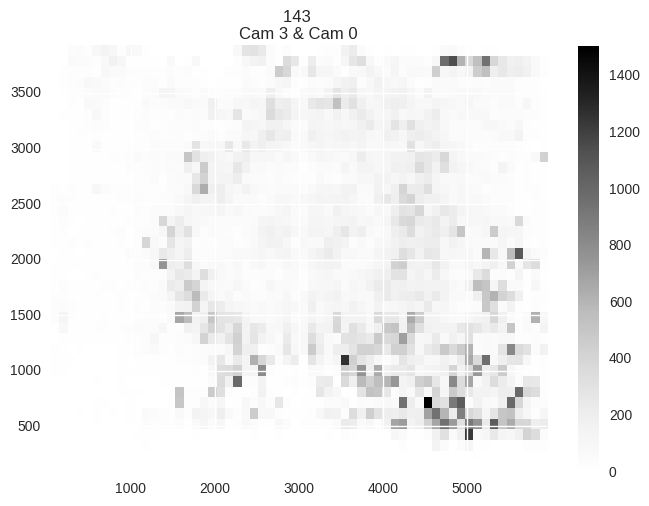

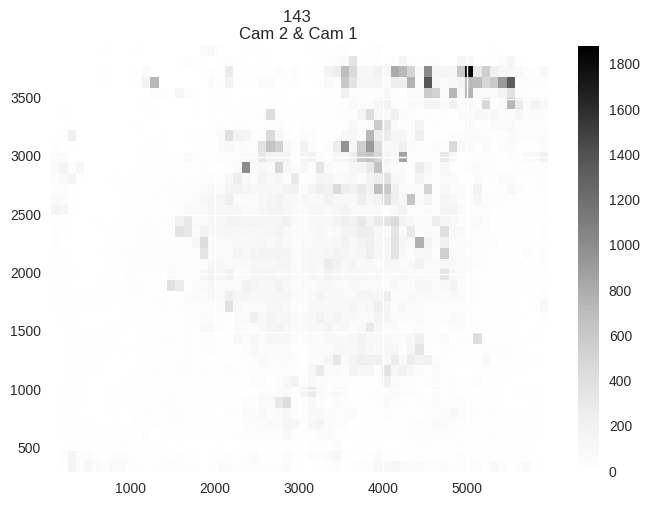

plotCommunityHeatmapFrac1h1h after getDF..: 1


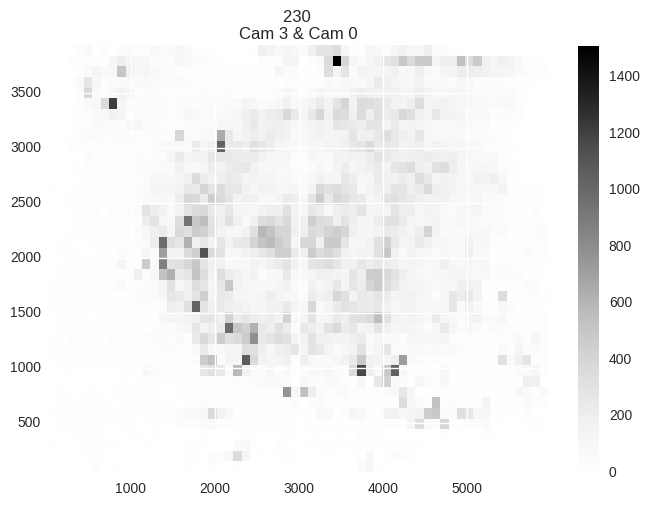

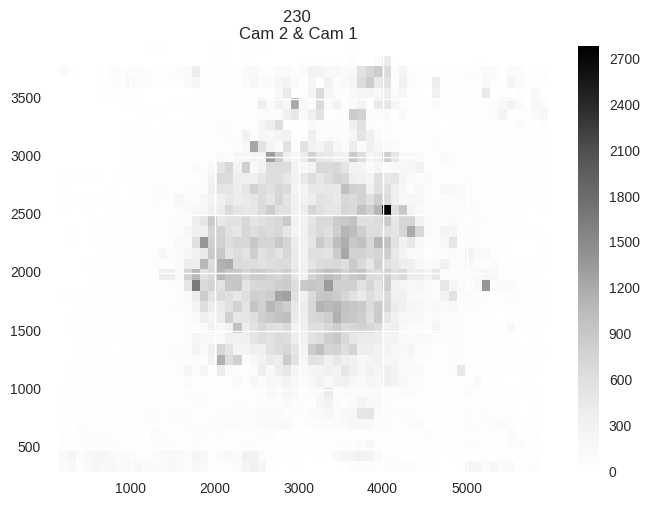

plotCommunityHeatmapFrac1h1h after getDF..: 2


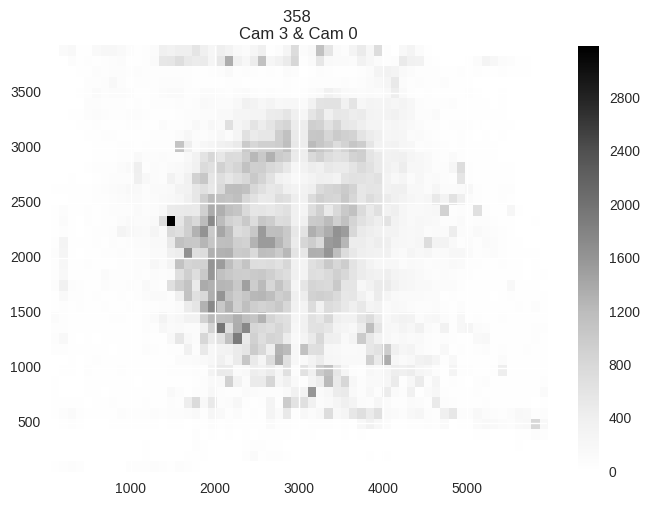

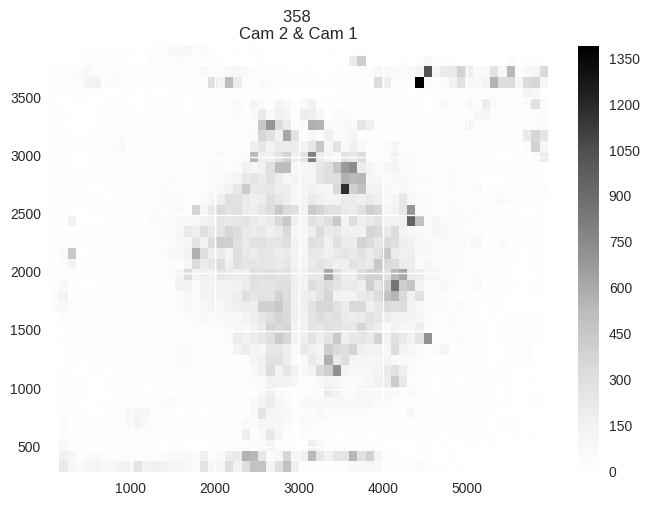

In [48]:
plotID1h1h("networks-hours/2015-08-21T00:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 797 6667 -- 
+ attr: id (v), weight (e)
[(0, 244), (1, 225), (2, 302)]
[244, 225, 302]
plotCommunityHeatmapFrac1h1h after getDF..: 0


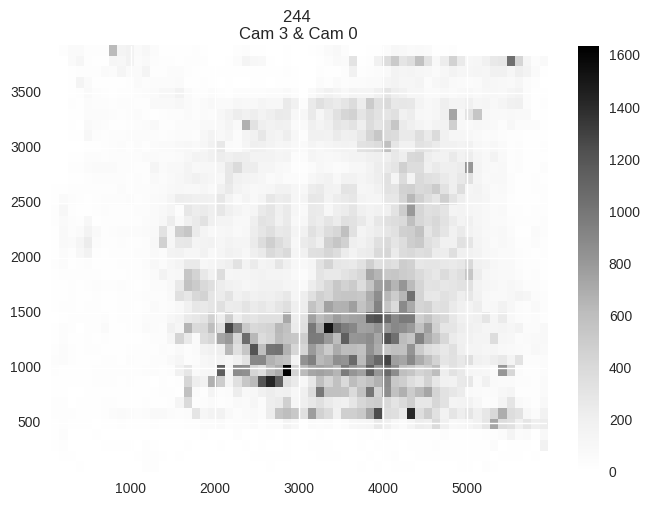

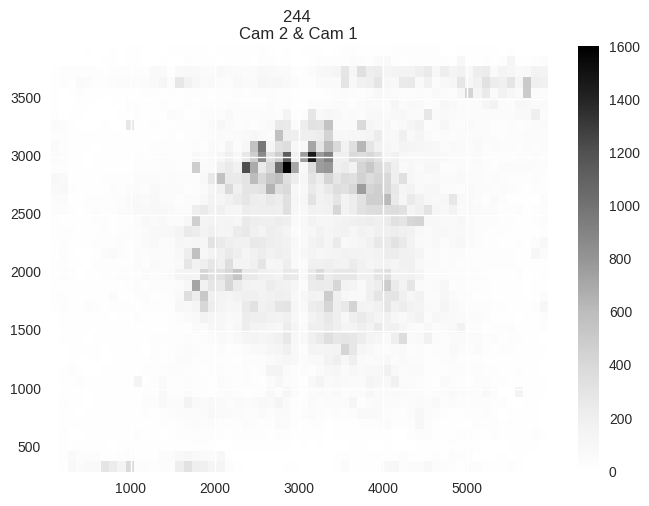

plotCommunityHeatmapFrac1h1h after getDF..: 1


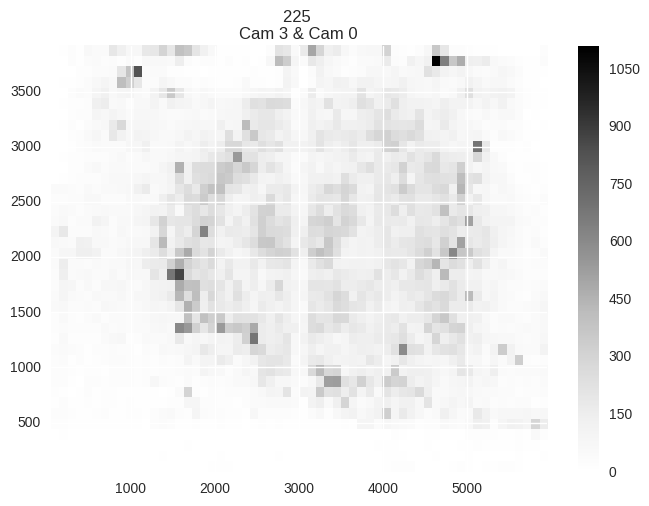

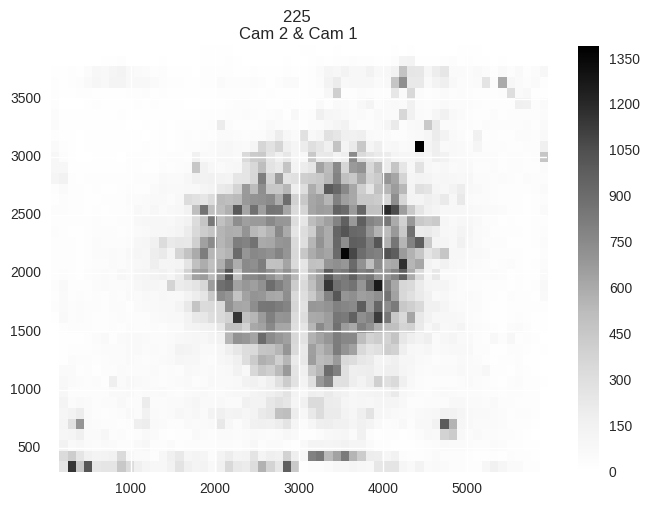

plotCommunityHeatmapFrac1h1h after getDF..: 2


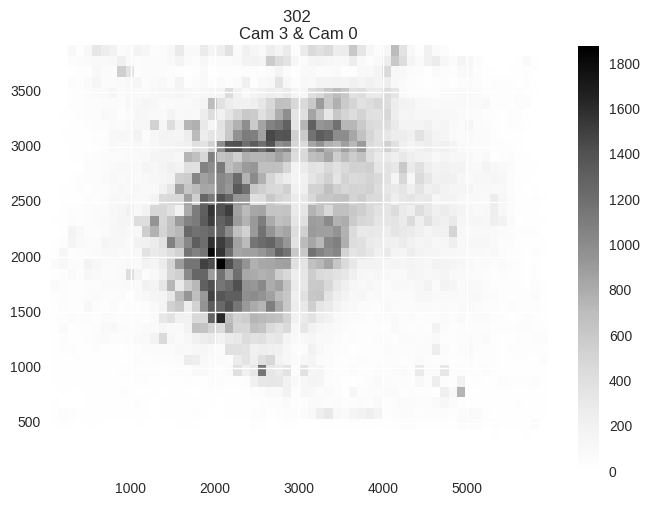

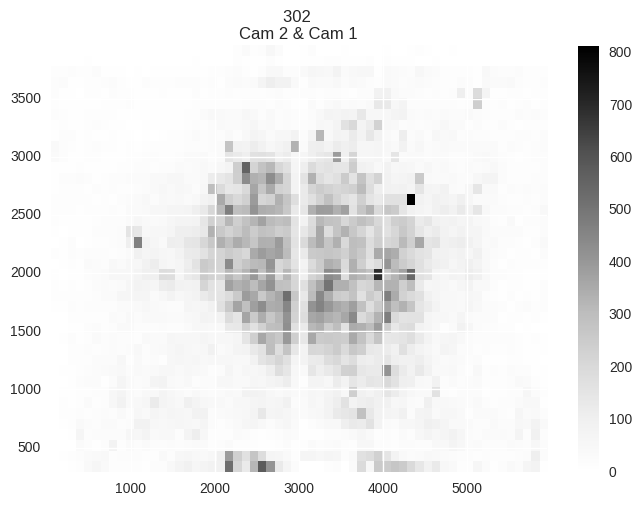

In [49]:
plotID1h1h("networks-hours/2015-08-21T05:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 993 14991 -- 
+ attr: id (v), weight (e)
[(0, 343), (1, 385), (2, 250)]
[343, 385, 250]
plotCommunityHeatmapFrac1h1h after getDF..: 0


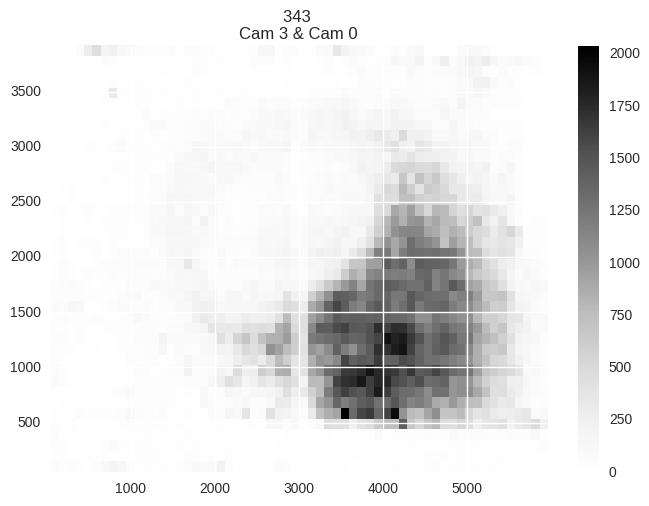

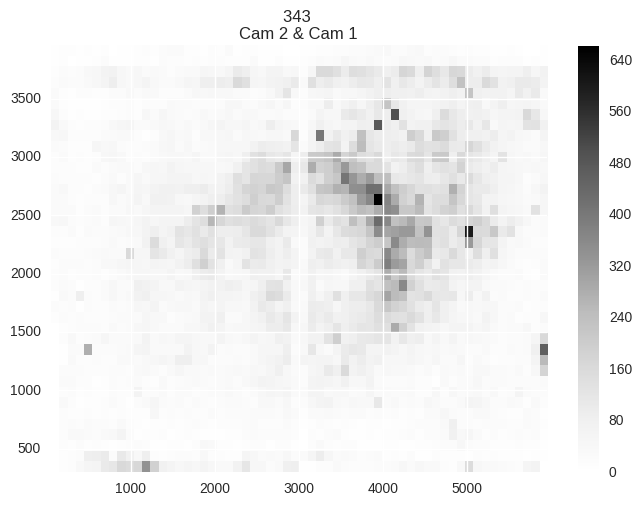

plotCommunityHeatmapFrac1h1h after getDF..: 1


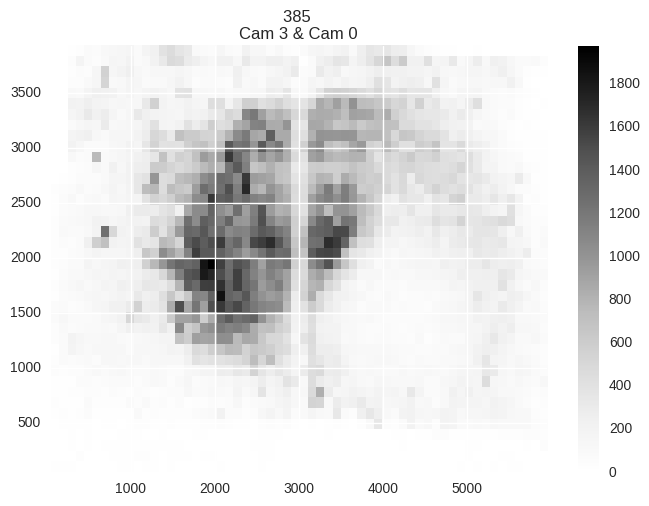

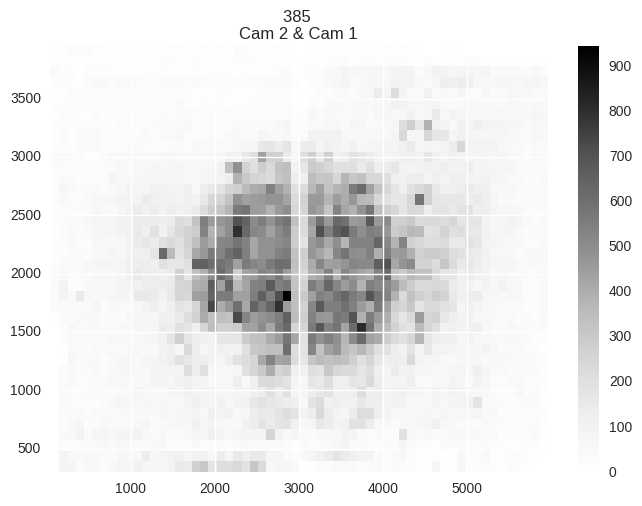

plotCommunityHeatmapFrac1h1h after getDF..: 2


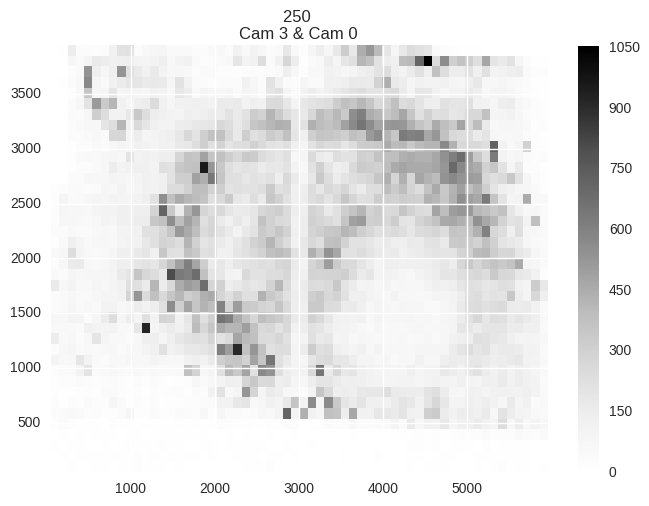

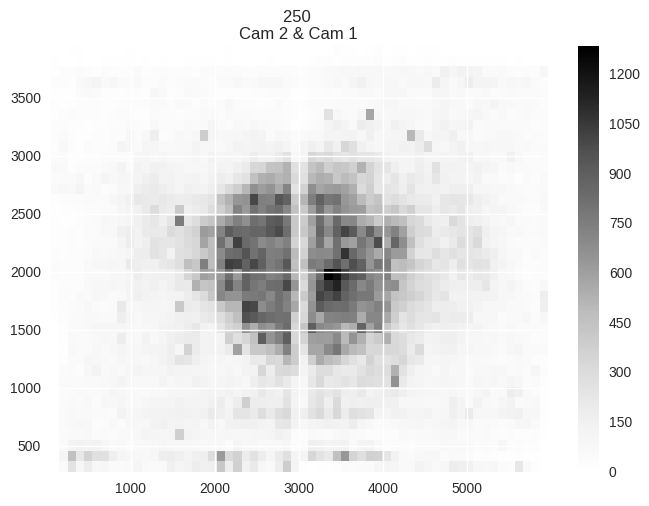

In [50]:
plotID1h1h("networks-hours/2015-08-21T10:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 930 14315 -- 
+ attr: id (v), weight (e)
[(0, 333), (1, 327), (2, 270)]
[333, 327, 270]
plotCommunityHeatmapFrac1h1h after getDF..: 0


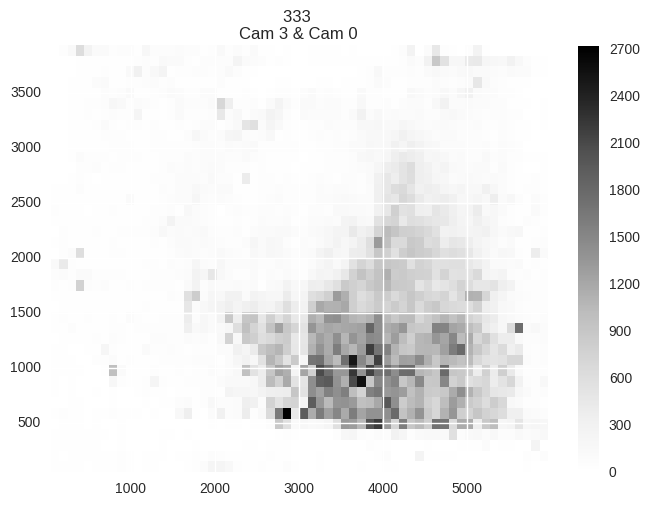

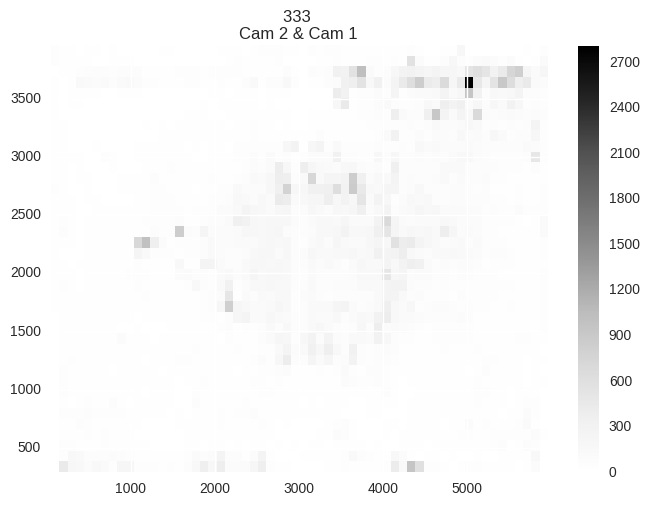

plotCommunityHeatmapFrac1h1h after getDF..: 1


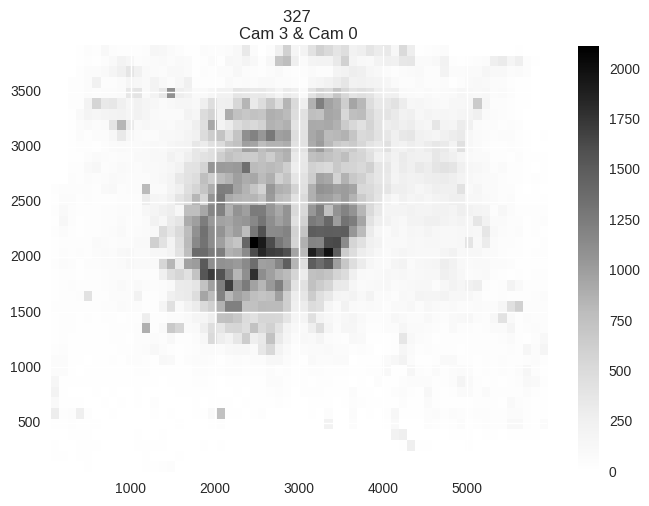

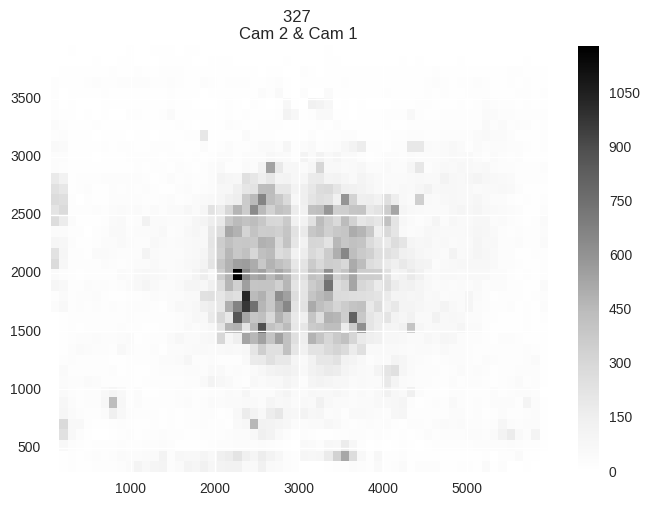

plotCommunityHeatmapFrac1h1h after getDF..: 2


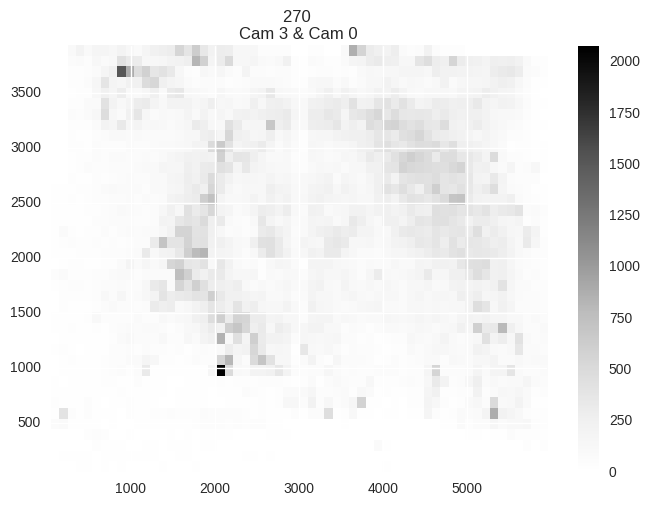

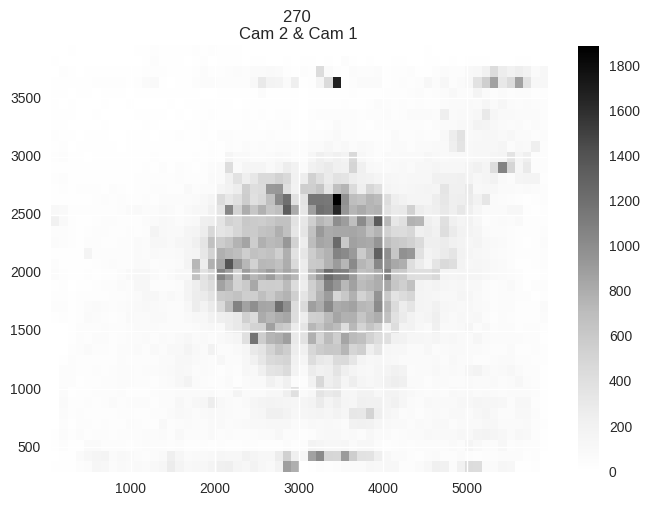

In [51]:
plotID1h1h("networks-hours/2015-08-21T15:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 770 5197 -- 
+ attr: id (v), weight (e)
[(0, 342), (1, 100), (2, 279), (5, 23)]
[342, 100, 279, 23]
plotCommunityHeatmapFrac1h1h after getDF..: 0


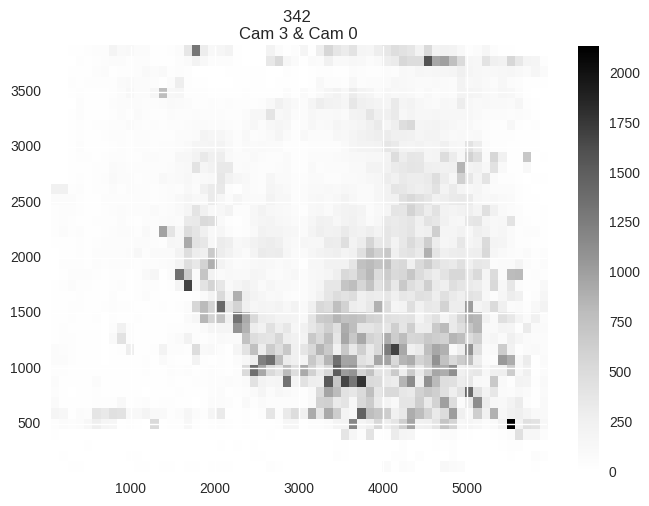

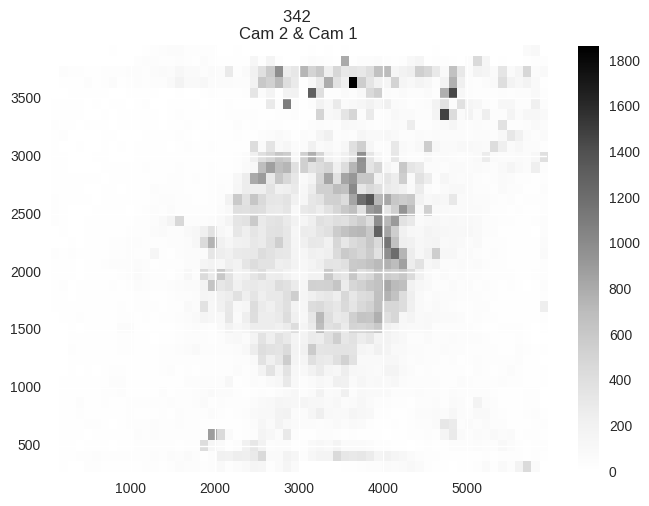

plotCommunityHeatmapFrac1h1h after getDF..: 1


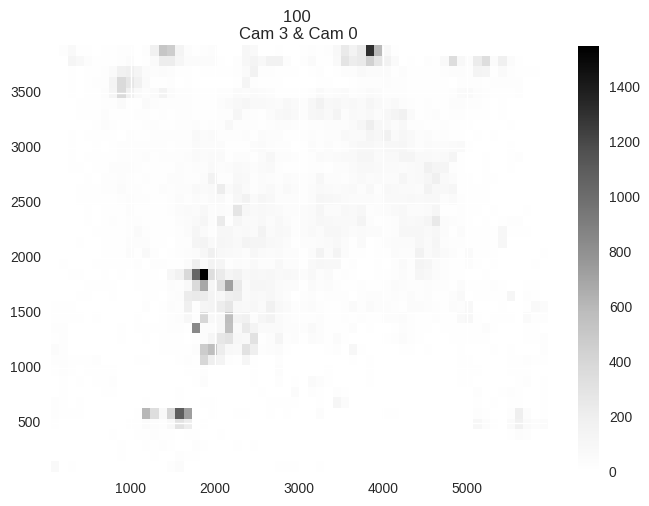

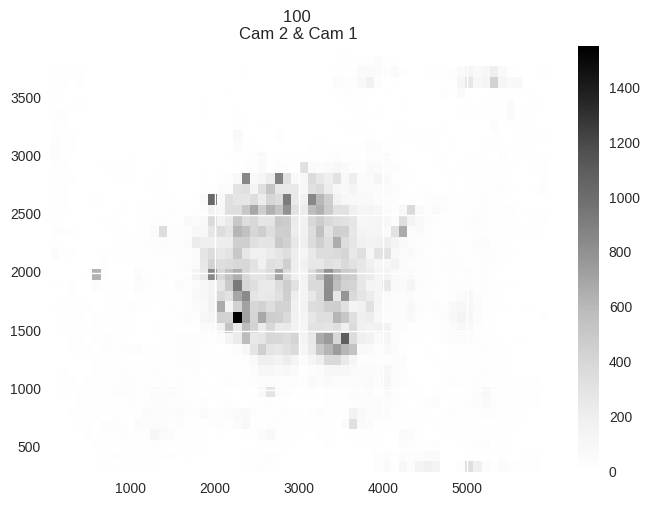

plotCommunityHeatmapFrac1h1h after getDF..: 2


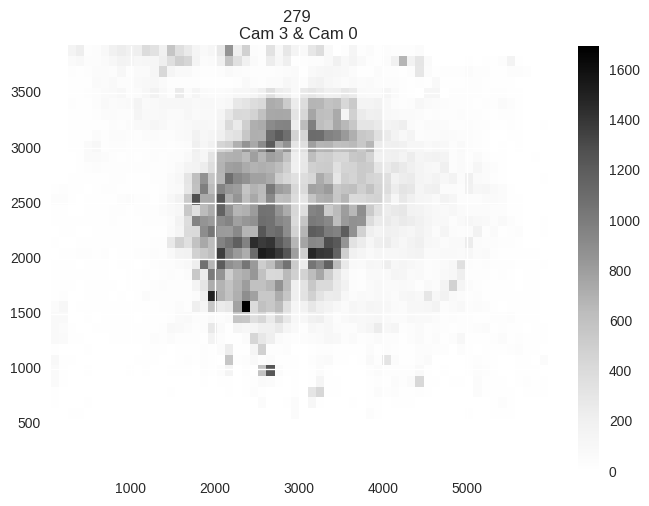

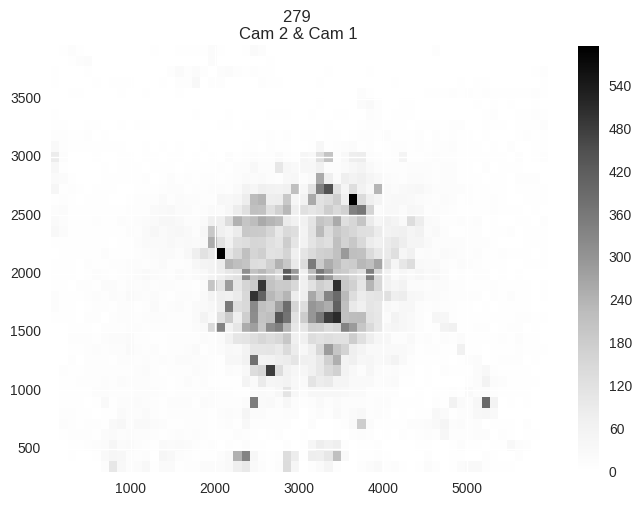

plotCommunityHeatmapFrac1h1h after getDF..: 3


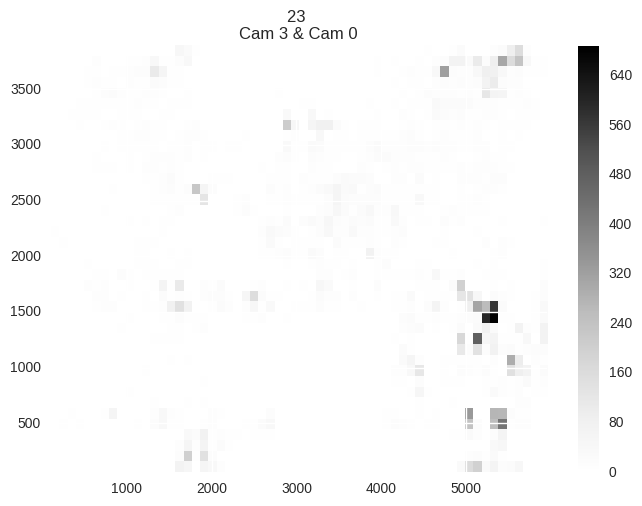

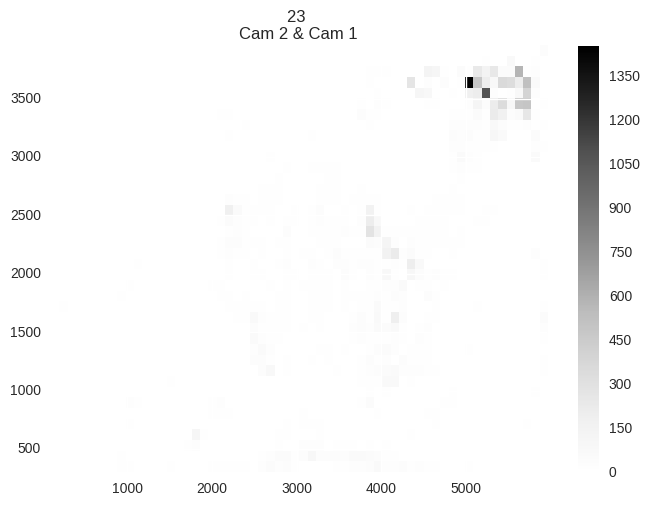

In [52]:
plotID1h1h("networks-hours/2015-08-21T20:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 783 7229 -- 
+ attr: id (v), weight (e)
[(0, 253), (1, 168), (2, 342)]
[253, 168, 342]
plotCommunityHeatmapFrac1h1h after getDF..: 0


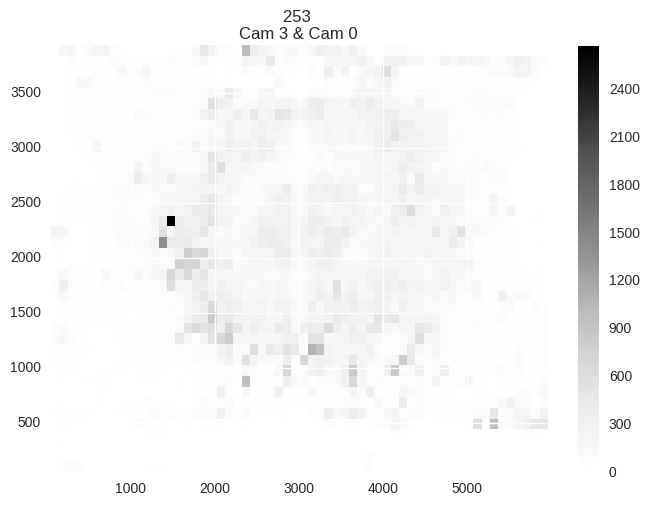

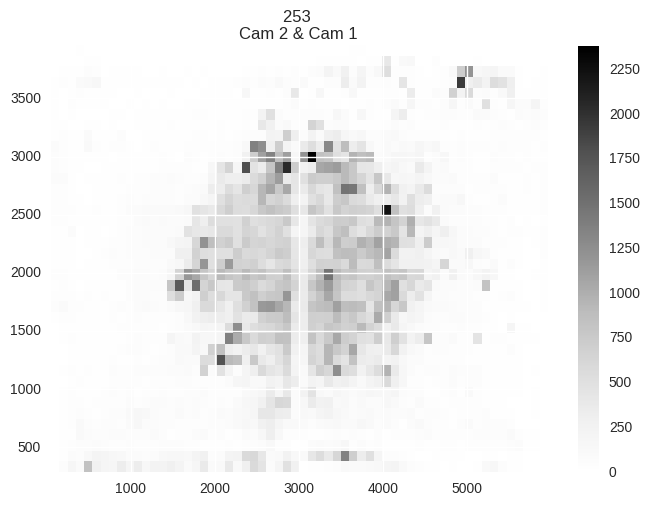

plotCommunityHeatmapFrac1h1h after getDF..: 1


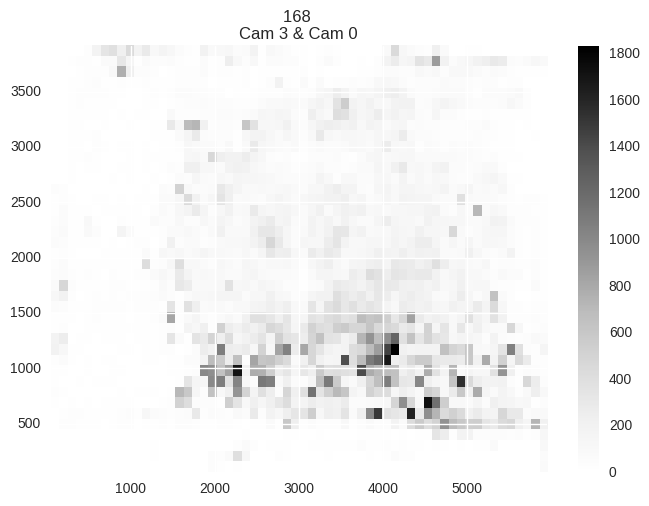

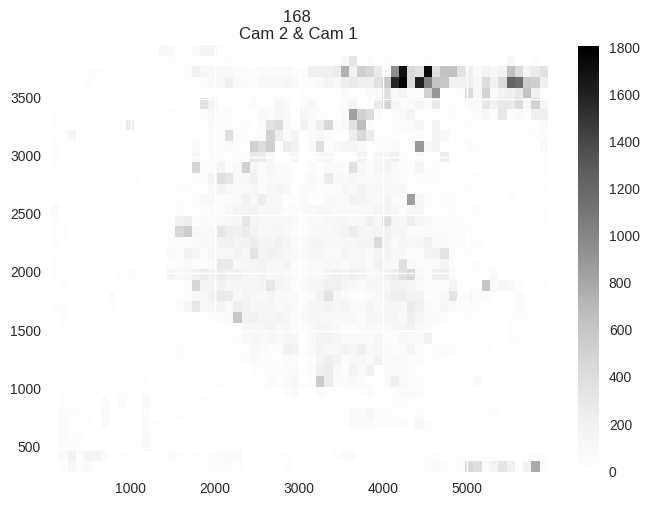

plotCommunityHeatmapFrac1h1h after getDF..: 2


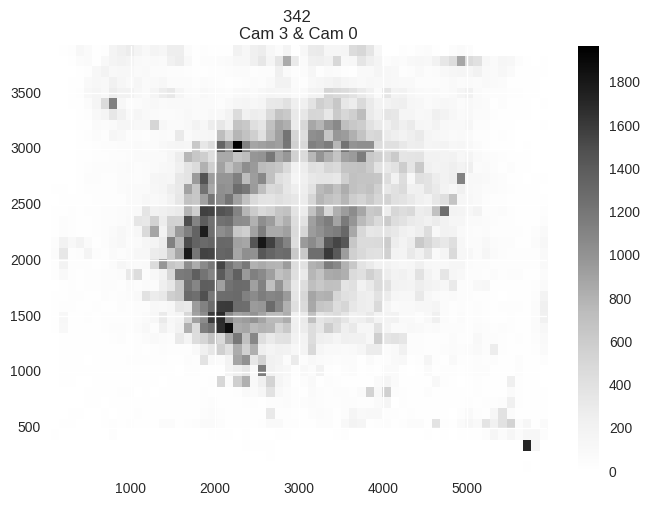

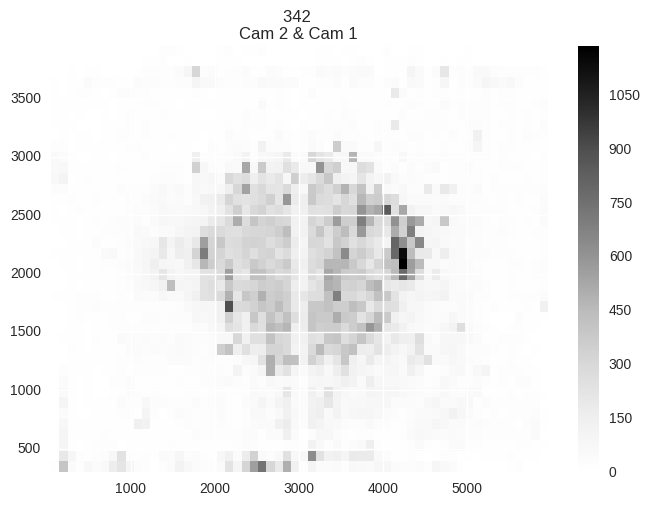

In [53]:
plotID1h1h("networks-hours/2015-08-21T02:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 769 6569 -- 
+ attr: id (v), weight (e)
[(0, 353), (1, 346), (2, 34)]
[353, 346, 34]
plotCommunityHeatmapFrac1h1h after getDF..: 0


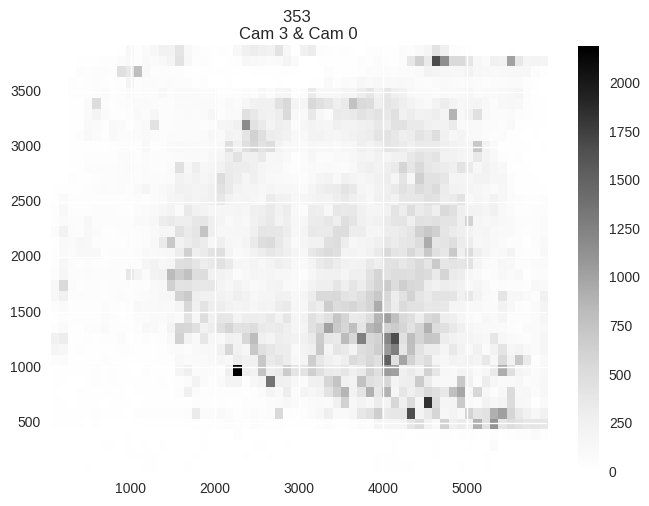

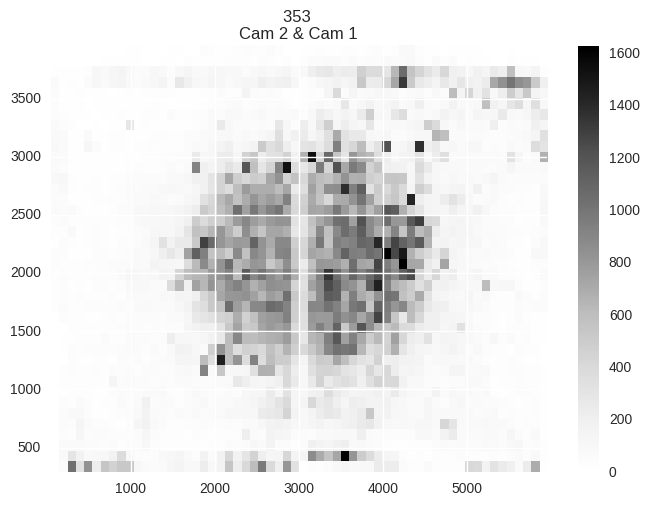

plotCommunityHeatmapFrac1h1h after getDF..: 1


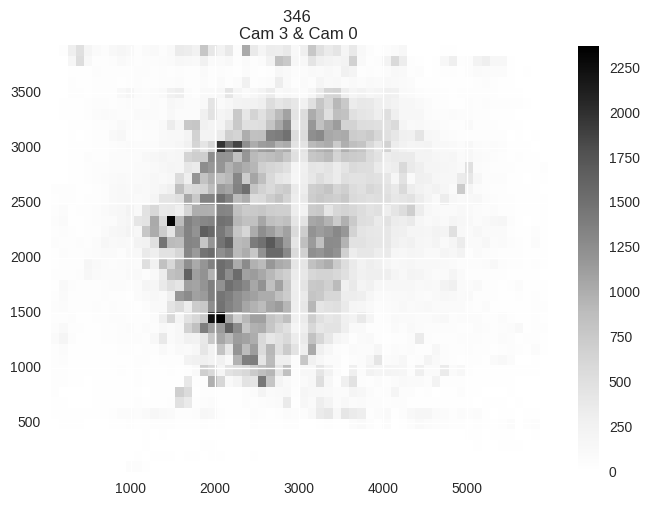

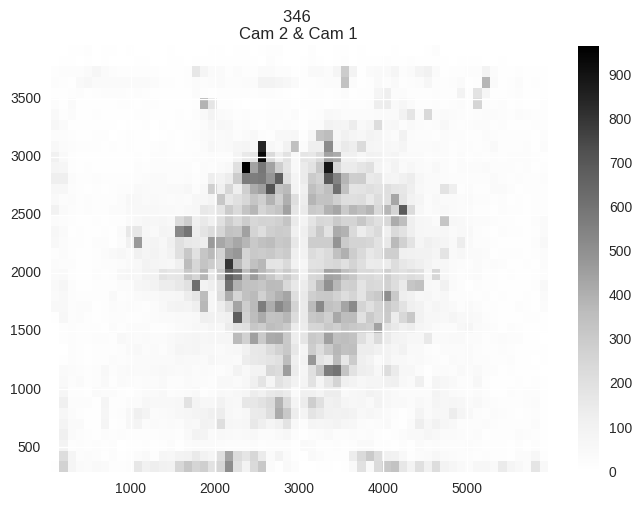

plotCommunityHeatmapFrac1h1h after getDF..: 2


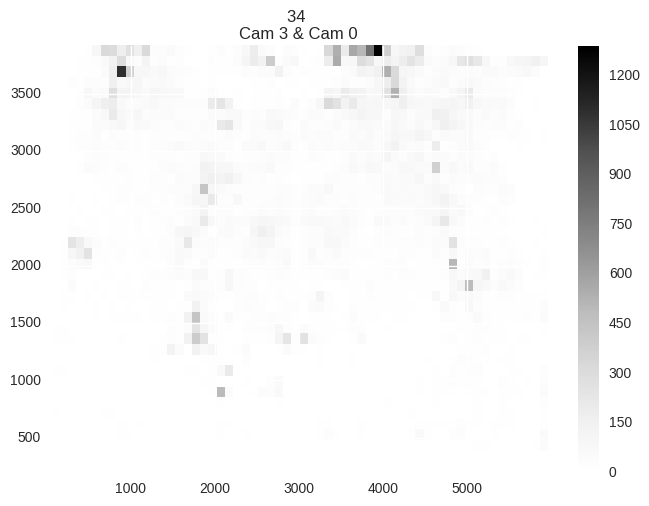

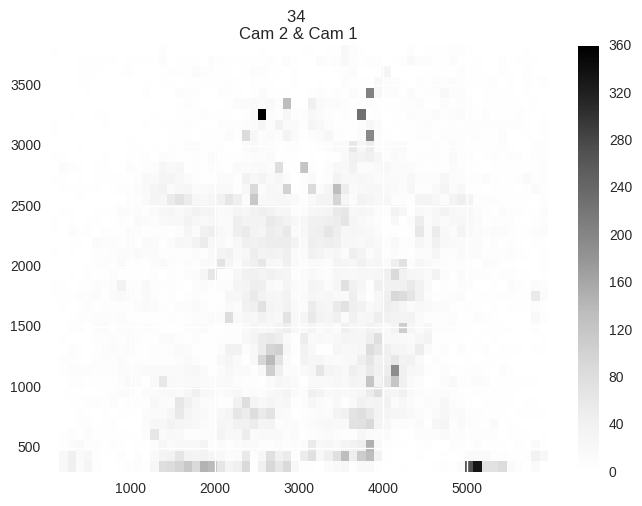

In [54]:
plotID1h1h("networks-hours/2015-08-21T04:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 854 8048 -- 
+ attr: id (v), weight (e)
[(0, 348), (1, 53), (2, 205), (3, 246)]
[348, 53, 205, 246]
plotCommunityHeatmapFrac1h1h after getDF..: 0


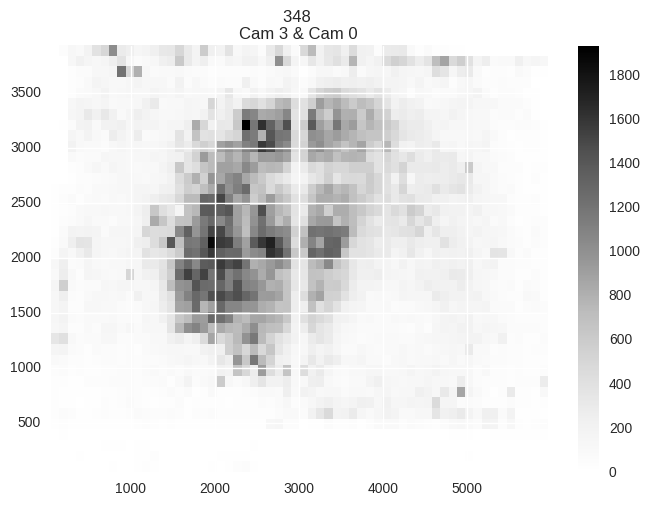

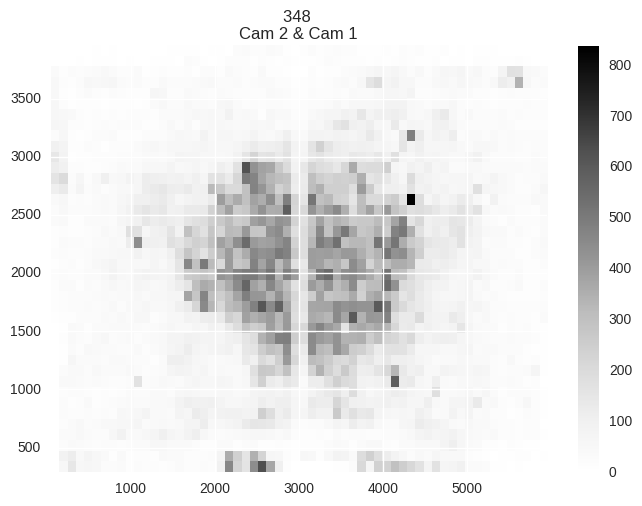

plotCommunityHeatmapFrac1h1h after getDF..: 1


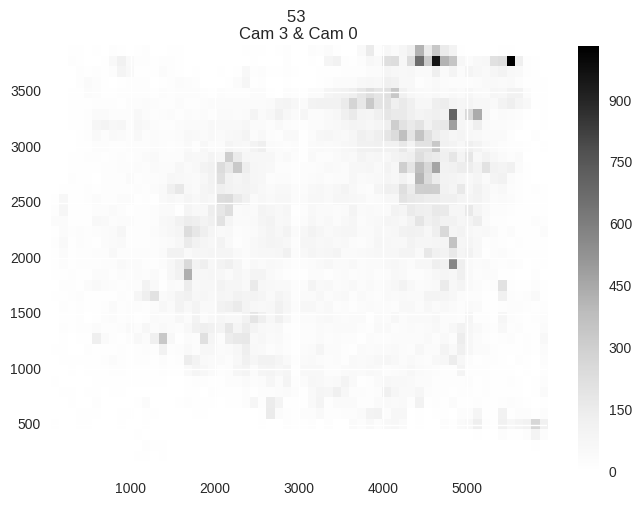

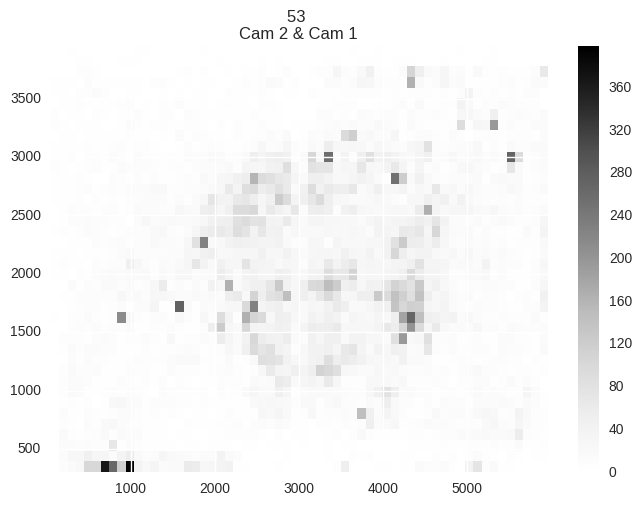

plotCommunityHeatmapFrac1h1h after getDF..: 2


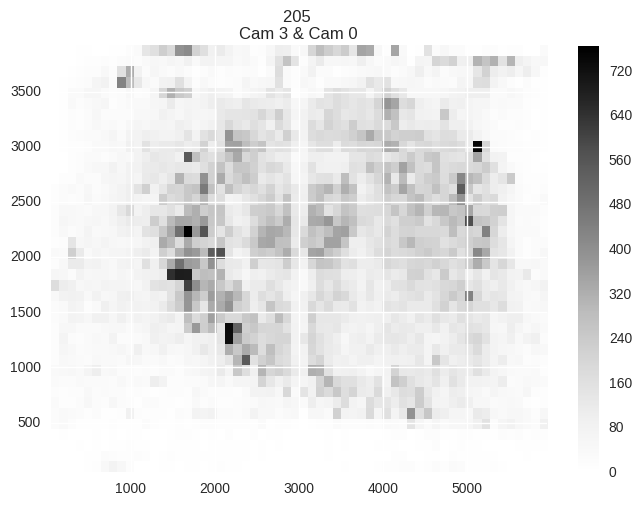

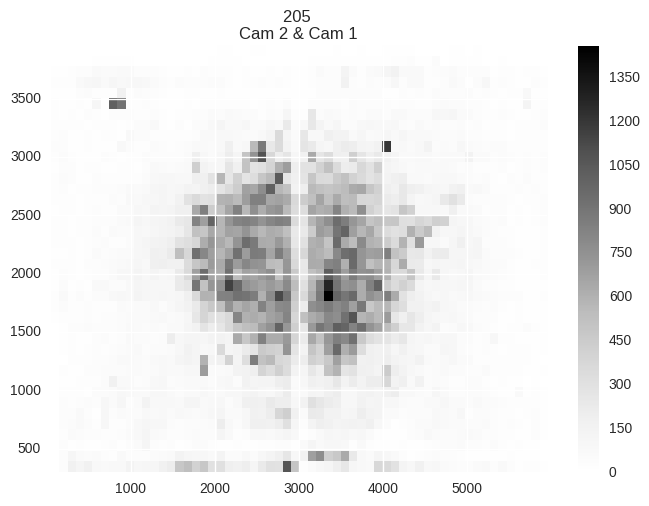

plotCommunityHeatmapFrac1h1h after getDF..: 3


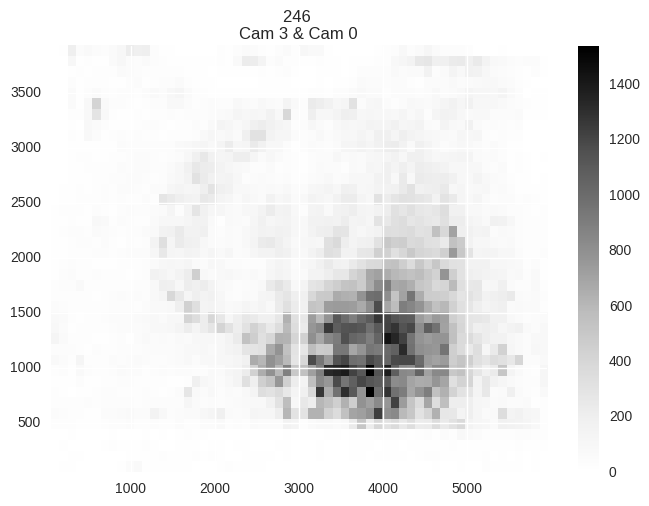

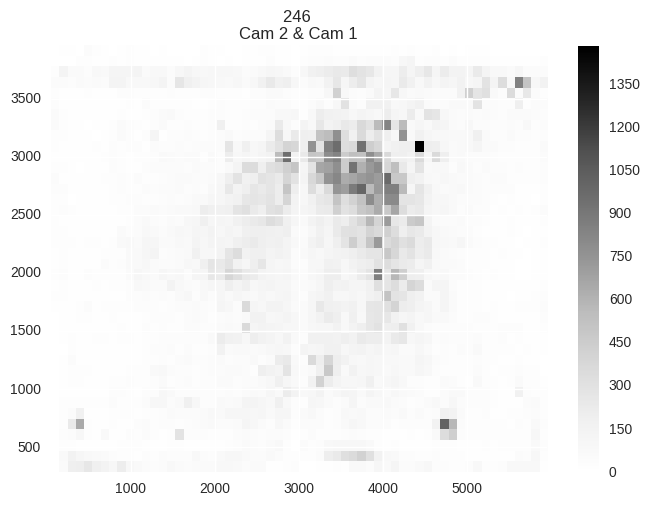

In [ ]:
plotID1h1h("networks-hours/2015-08-21T06:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

IGRAPH U-W- 931 10249 -- 
+ attr: id (v), weight (e)
[(0, 319), (1, 343), (2, 257)]
[319, 343, 257]
plotCommunityHeatmapFrac1h1h after getDF..: 0


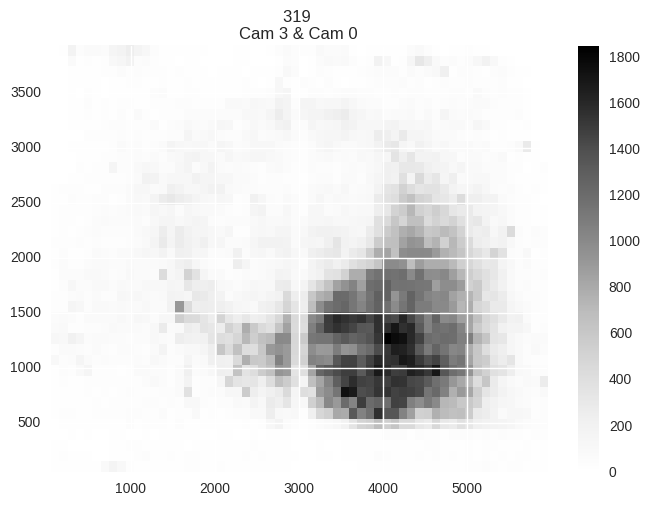

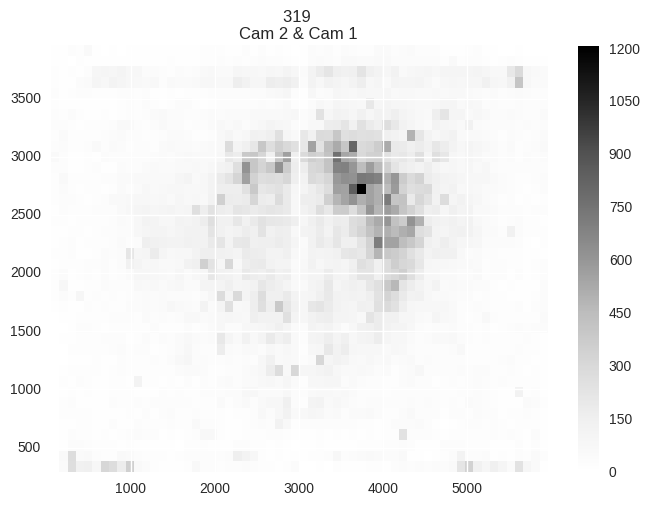

In [ ]:
plotID1h1h("networks-hours/2015-08-21T08:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

In [ ]:
plotID1h1h("networks-hours/2015-08-21T12:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

In [ ]:
plotID1h1h("networks-hours/2015-08-21T14:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

In [ ]:
plotID1h1h("networks-hours/2015-08-21T16:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

In [ ]:
plotID1h1h("networks-hours/2015-08-21T18:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

In [ ]:
plotID1h1h("networks-hours/2015-08-21T22:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 20)

# Plot Communities Tagesnetzwerk fastgreedy

IGRAPH U-W- 1202 152449 -- 
+ attr: id (v), weight (e)
[(0, 509), (1, 661)]
[[2048, 2049, 2050, 2055, 2392, 18, 2076, 2078, 35, 1372, 2091, 2092, 53, 2102, 2111, 2114, 2117, 2121, 2123, 2744, 2660, 2161, 2165, 118, 121, 2171, 3093, 2177, 2181, 1351, 1730, 2190, 2195, 2197, 2210, 2211, 2214, 168, 2217, 2224, 2225, 182, 2234, 2235, 2238, 2244, 2247, 2253, 2255, 2265, 2266, 2270, 2768, 2279, 2282, 2287, 2088, 2295, 2296, 2432, 258, 1375, 2318, 1069, 2322, 2323, 2325, 280, 2350, 2357, 2359, 2366, 2367, 2375, 2379, 834, 3128, 2387, 1921, 2402, 2403, 2407, 2411, 2412, 2413, 1768, 2420, 373, 746, 2431, 2434, 2435, 2437, 1772, 1090, 2446, 2447, 405, 2461, 2466, 2474, 2482, 2488, 833, 2540, 2507, 2509, 2513, 2519, 2522, 2525, 1104, 2530, 2534, 2546, 2556, 2131, 515, 2564, 2565, 2567, 2569, 2574, 530, 2582, 2585, 2138, 1450, 1798, 2598, 2602, 2610, 2623, 2625, 2626, 2630, 2645, 2657, 2662, 2670, 2675, 2685, 2686, 790, 2694, 2157, 2204, 2713, 2718, 2721, 2723, 678, 2734, 2504, 2738, 2745, 698, 27

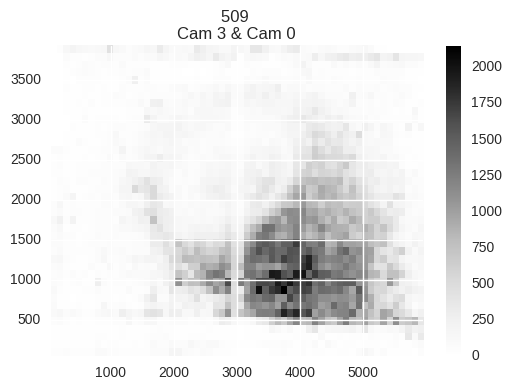

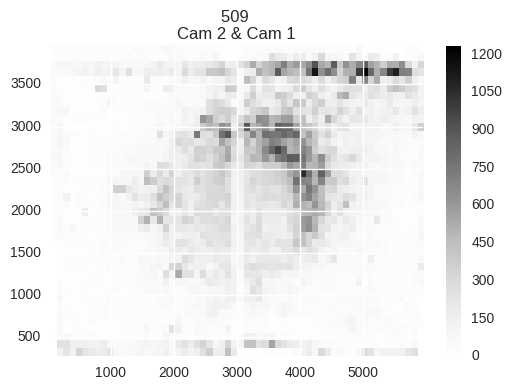

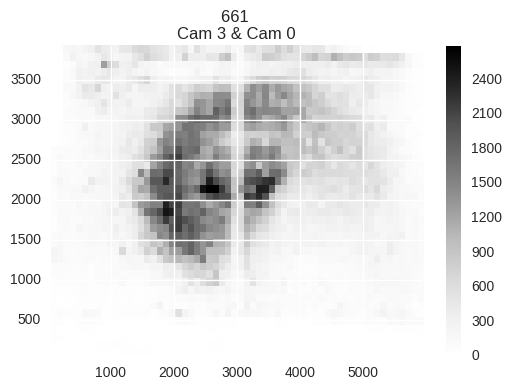

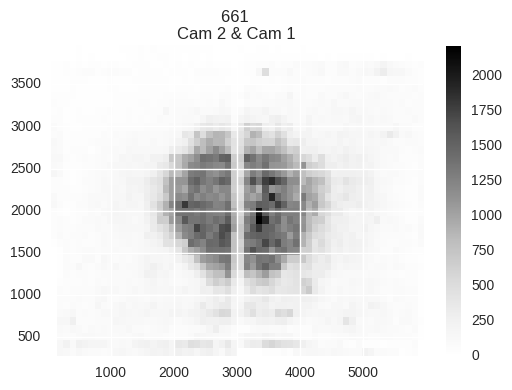

In [71]:
plotForHour("networks-days/2015-08-21T00:00:00Z_1d_allCams_0.99conf_160dist_6ilen.graphml", 20)

# Communities per Hour k-clique communities

In [130]:
def plotIDSkcc(path, limit):
    g = nx.read_graphml(path)
    print(nx.info(g))
    
    c = getCommunitiesKCC(g,limit)
    print([len(cc) for cc in c])
    
    for i in list(range(len(c))):
        plotCommunityHeatmapFrac1h1h(c, i, conn, path)

In [131]:
def getCommunitiesKCC(g,limit):
    c = list(nx.community.k_clique_communities(g,5))
    l = [cc for cc in c if len(cc) > limit]
    return l

Name: 
Type: Graph
Number of nodes: 772
Number of edges: 5691
Average degree:  14.7435
[114, 19, 14]
plotCommunityHeatmapFrac1h1h after getDF..: 0


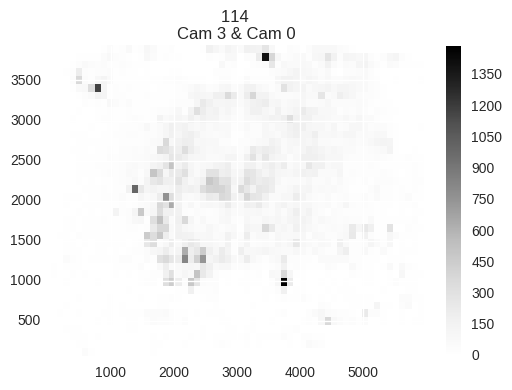

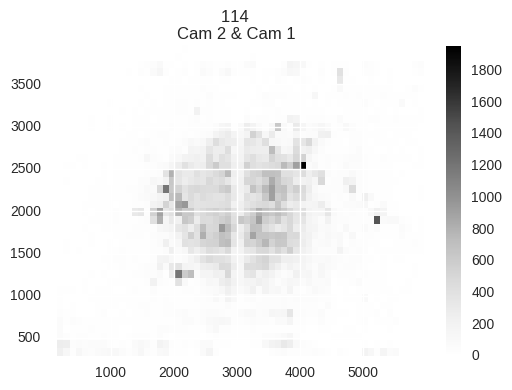

plotCommunityHeatmapFrac1h1h after getDF..: 1


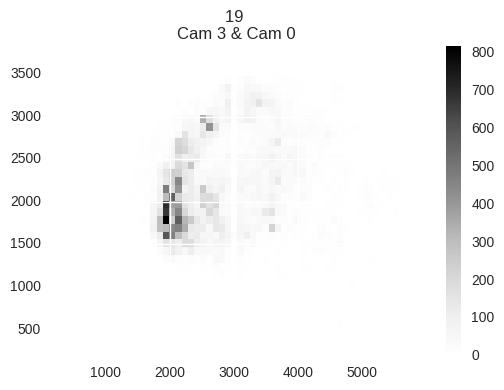

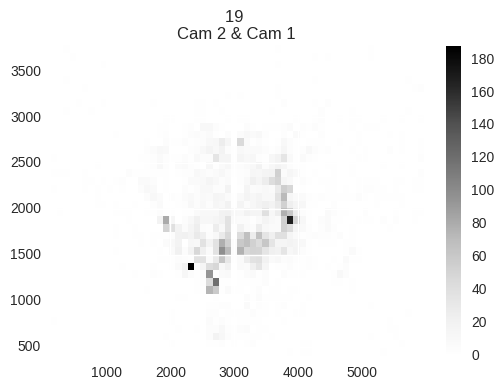

plotCommunityHeatmapFrac1h1h after getDF..: 2


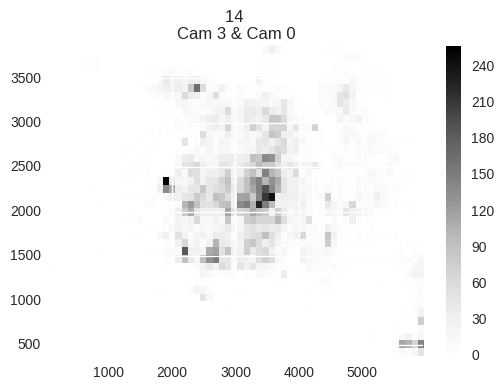

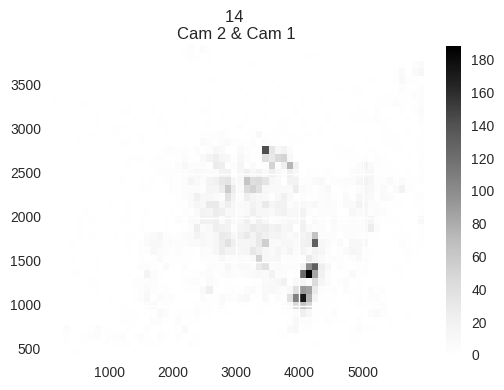

In [132]:
plotIDSkcc("networks-hours/2015-08-21T00:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 10)

Name: 
Type: Graph
Number of nodes: 797
Number of edges: 6667
Average degree:  16.7302
[140, 42, 23, 22]
plotCommunityHeatmapFrac1h1h after getDF..: 0


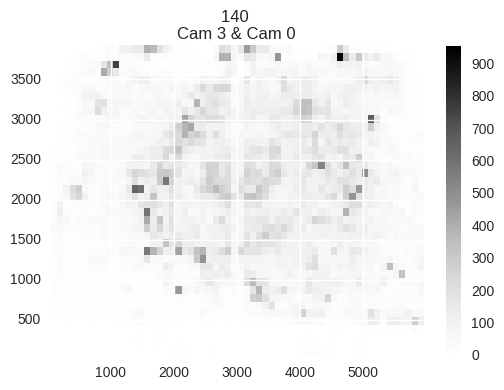

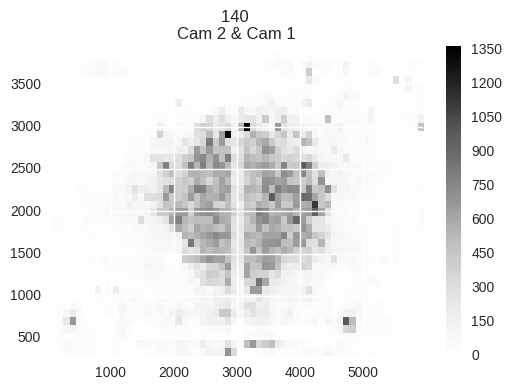

plotCommunityHeatmapFrac1h1h after getDF..: 1


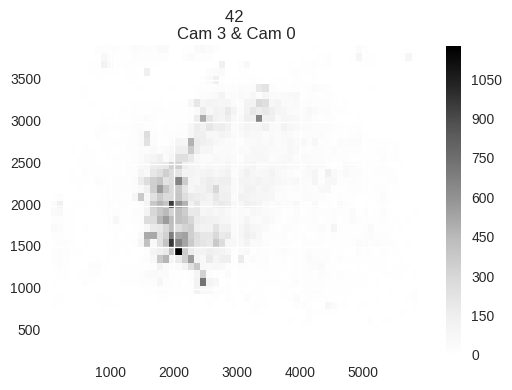

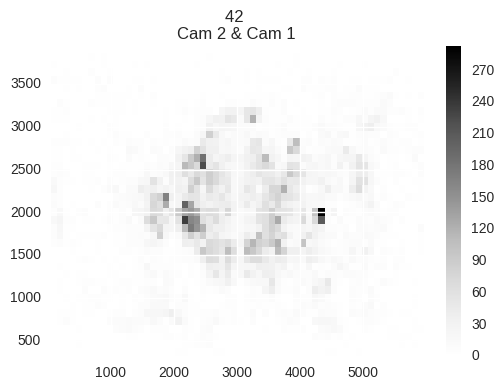

plotCommunityHeatmapFrac1h1h after getDF..: 2


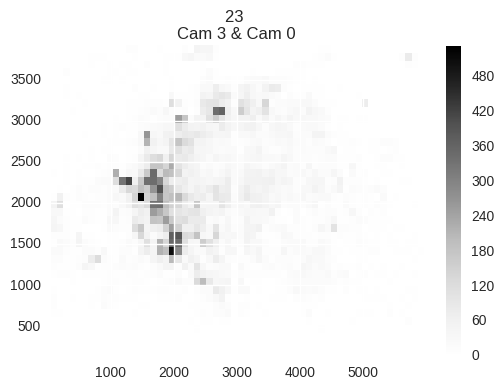

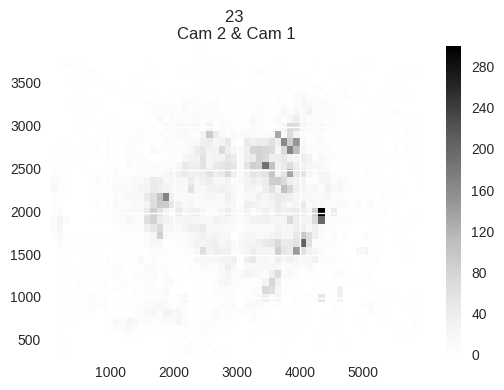

plotCommunityHeatmapFrac1h1h after getDF..: 3


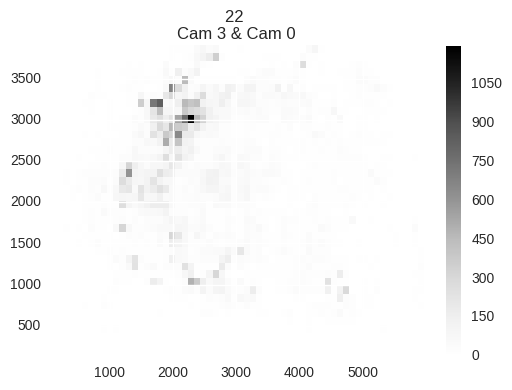

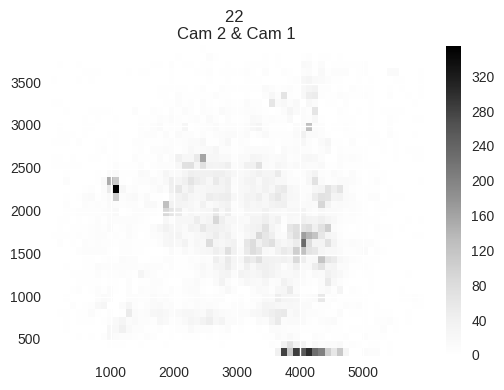

In [133]:
plotIDSkcc("networks-hours/2015-08-21T05:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 10)

Name: 
Type: Graph
Number of nodes: 993
Number of edges: 14991
Average degree:  30.1934
[369, 24, 15, 11, 16, 11, 11]
plotCommunityHeatmapFrac1h1h after getDF..: 0


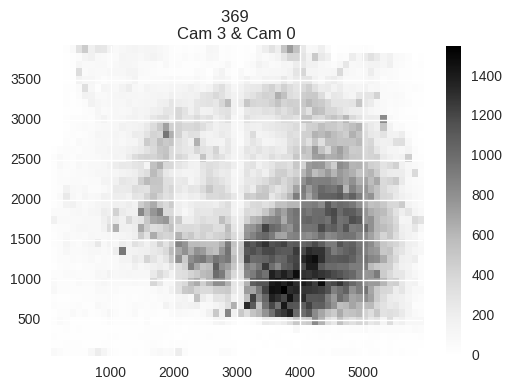

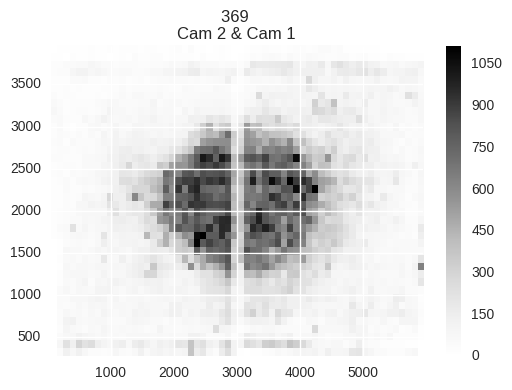

plotCommunityHeatmapFrac1h1h after getDF..: 1


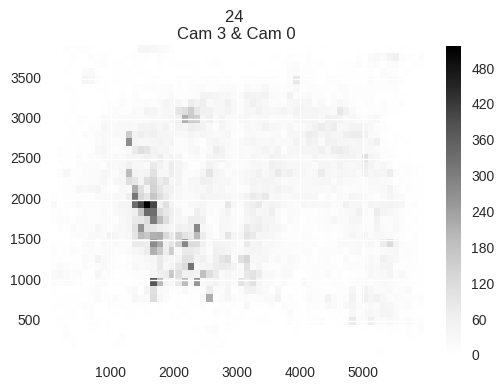

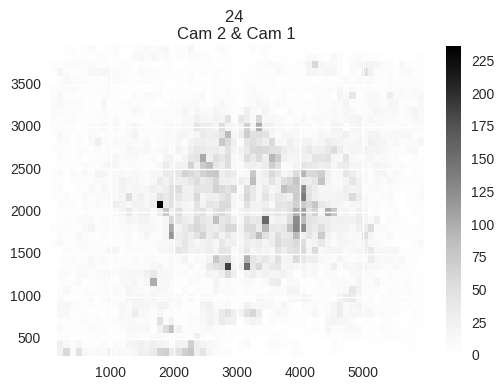

plotCommunityHeatmapFrac1h1h after getDF..: 2


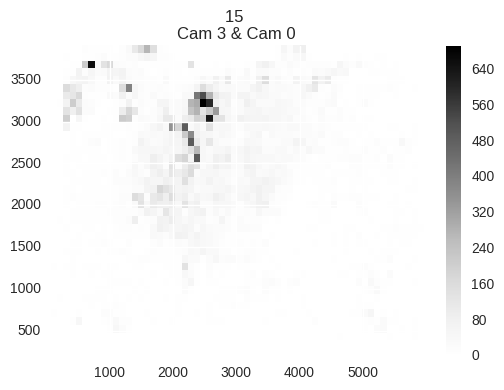

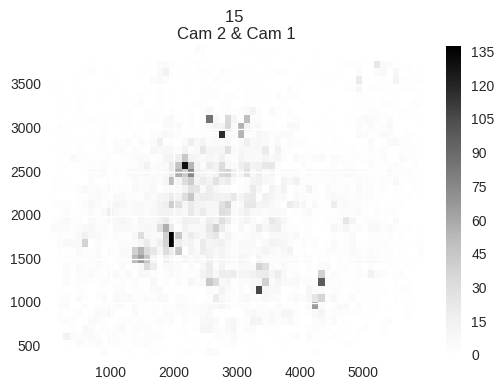

plotCommunityHeatmapFrac1h1h after getDF..: 3


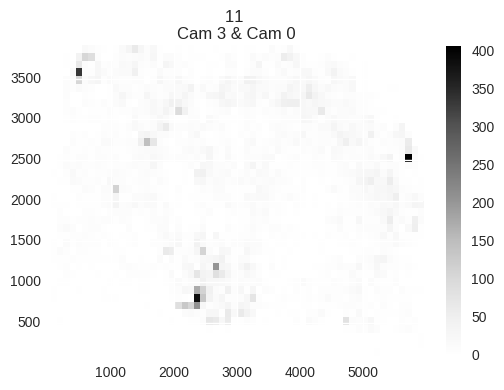

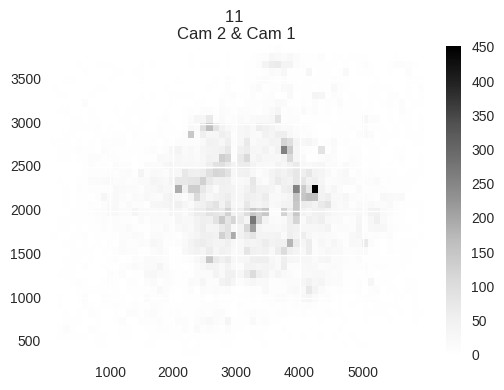

plotCommunityHeatmapFrac1h1h after getDF..: 4


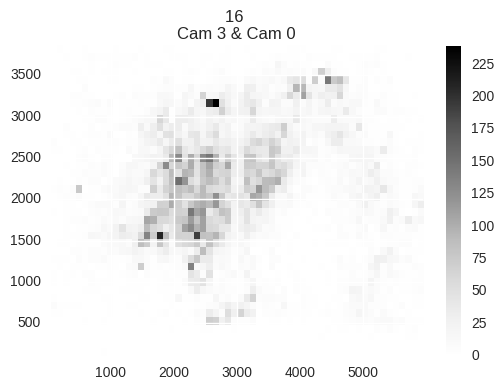

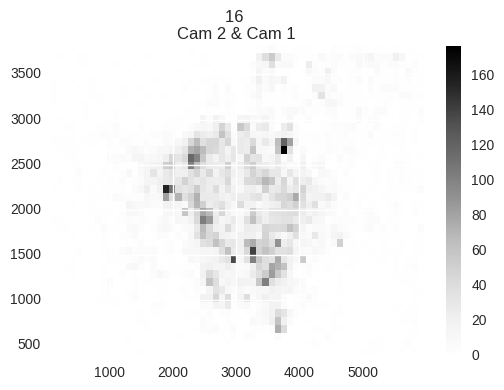

plotCommunityHeatmapFrac1h1h after getDF..: 5


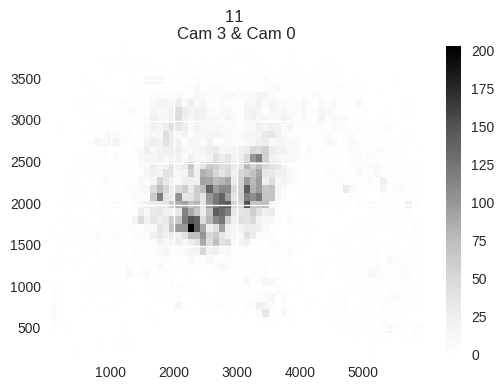

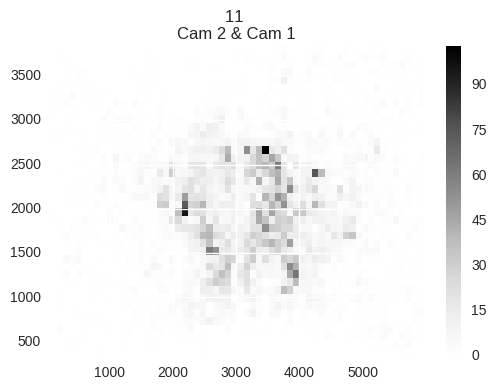

plotCommunityHeatmapFrac1h1h after getDF..: 6


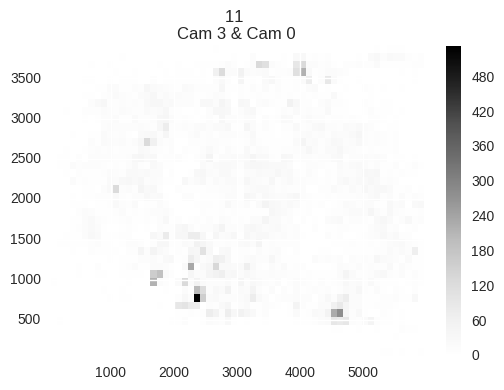

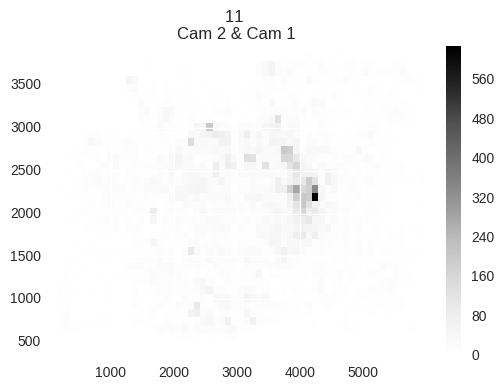

In [134]:
plotIDSkcc("networks-hours/2015-08-21T10:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 10)

Name: 
Type: Graph
Number of nodes: 930
Number of edges: 14315
Average degree:  30.7849
[186, 183, 88, 11]
plotCommunityHeatmapFrac1h1h after getDF..: 0


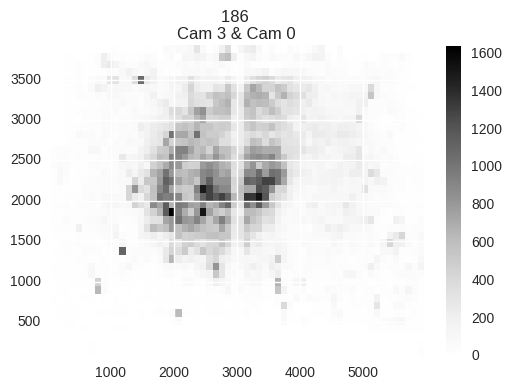

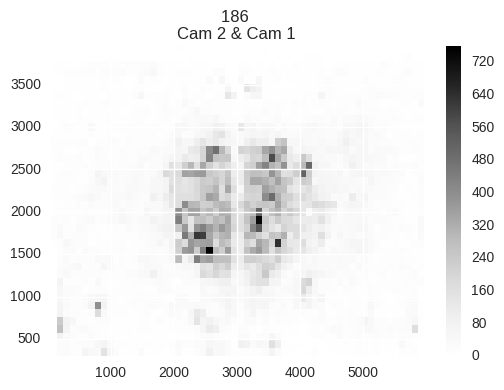

plotCommunityHeatmapFrac1h1h after getDF..: 1


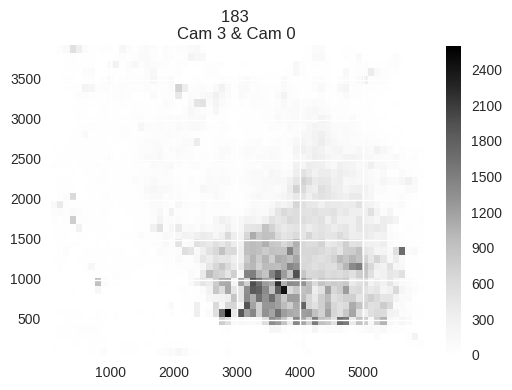

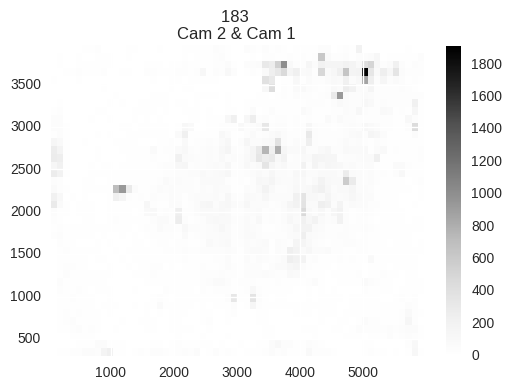

plotCommunityHeatmapFrac1h1h after getDF..: 2


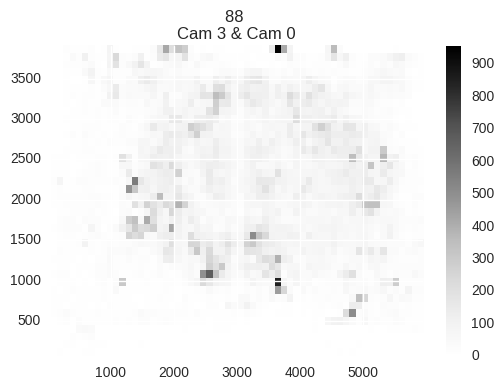

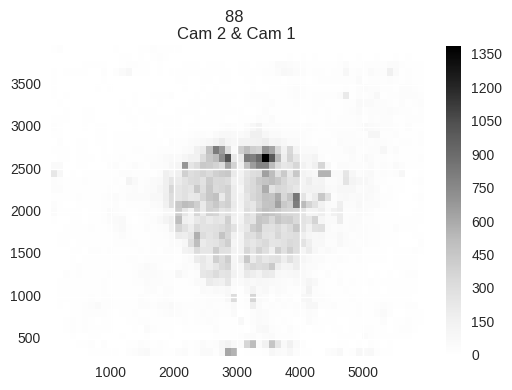

plotCommunityHeatmapFrac1h1h after getDF..: 3


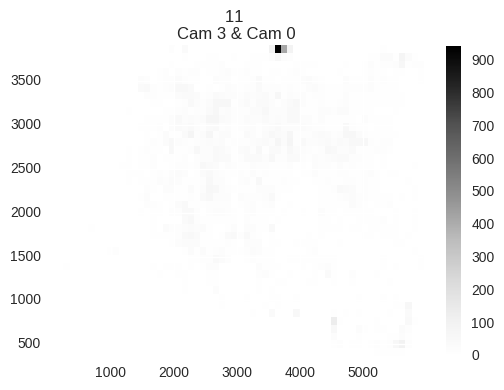

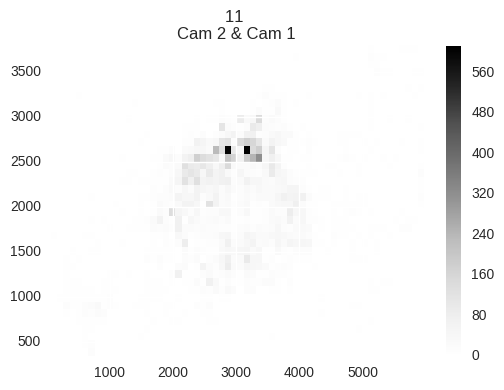

In [135]:
plotIDSkcc("networks-hours/2015-08-21T15:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 10)

Name: 
Type: Graph
Number of nodes: 770
Number of edges: 5197
Average degree:  13.4987
[71, 28, 11]
plotCommunityHeatmapFrac1h1h after getDF..: 0


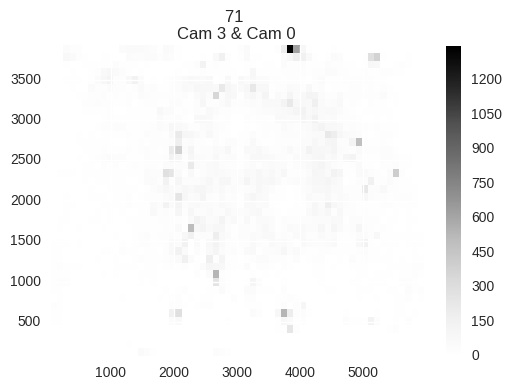

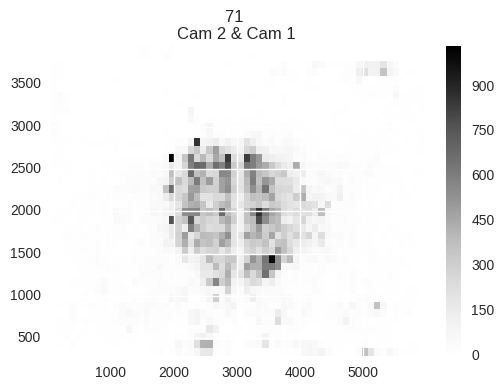

plotCommunityHeatmapFrac1h1h after getDF..: 1


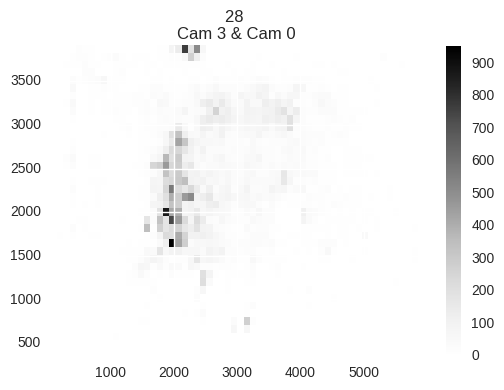

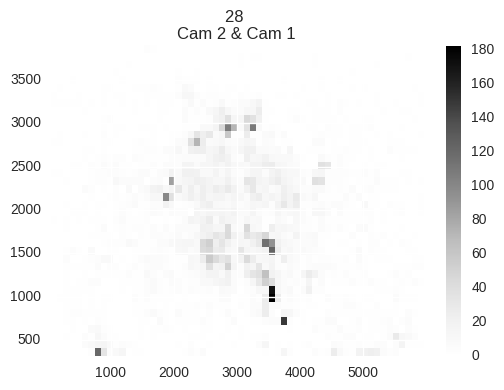

plotCommunityHeatmapFrac1h1h after getDF..: 2


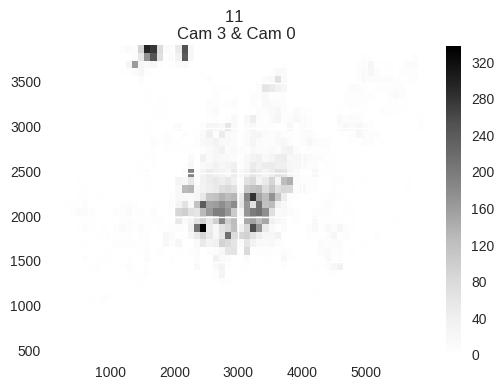

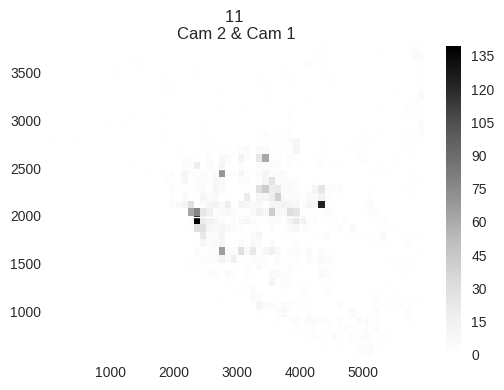

In [136]:
plotIDSkcc("networks-hours/2015-08-21T20:00:00Z_1h_allCams_0.99conf_160dist_6ilen.graphml", 10)